In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import math

In [ ]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [ ]:
data = pd.read_csv("./train.csv")
train, test = train_test_split(data, test_size=0.3, random_state=42)
print('train shape:', train.shape)
print('test shape:', test.shape)

train shape: (1022, 81)
test shape: (438, 81)


# EDA

In [ ]:
display(train.head())
display(train.describe())
display(train.info())

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
135,136,20,RL,80.0,10400,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2008,WD,Normal,174000
1452,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
762,763,60,FV,72.0,8640,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2010,Con,Normal,215200
932,933,20,RL,84.0,11670,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Normal,320000
435,436,60,RL,43.0,10667,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,ConLw,Normal,212000


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1022.000000,1022.000000,832.000000,1022.000000,1022.000000,1022.000000,1022.000000,1022.000000,1019.000000,1022.000000,...,1022.000000,1022.000000,1022.000000,1022.000000,1022.000000,1022.000000,1022.000000,1022.000000,1022.000000,1022.000000
mean,732.338552,57.059687,70.375000,10745.437378,6.128180,5.564579,1970.995108,1984.757339,105.261040,446.176125,...,97.548924,49.525440,21.303327,3.881605,15.565558,2.743640,41.565558,6.363992,2007.814090,181312.692759
std,425.860402,42.669715,25.533607,11329.753423,1.371391,1.110557,30.748816,20.747109,172.707705,459.971174,...,131.691873,69.205968,61.534380,32.547722,56.445749,39.671531,338.132358,2.650115,1.325807,77617.461005
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,367.500000,20.000000,59.000000,7564.250000,5.000000,5.000000,1953.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,735.500000,50.000000,70.000000,9600.000000,6.000000,5.000000,1972.000000,1994.000000,0.000000,390.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,165000.000000
75%,1100.500000,70.000000,80.000000,11692.500000,7.000000,6.000000,2001.000000,2004.000000,170.000000,724.000000,...,170.500000,73.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1378.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,8300.000000,12.000000,2010.000000,745000.000000


<class 'pandas.core.frame.DataFrame'>
Index: 1022 entries, 135 to 1126
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1022 non-null   int64  
 1   MSSubClass     1022 non-null   int64  
 2   MSZoning       1022 non-null   object 
 3   LotFrontage    832 non-null    float64
 4   LotArea        1022 non-null   int64  
 5   Street         1022 non-null   object 
 6   Alley          66 non-null     object 
 7   LotShape       1022 non-null   object 
 8   LandContour    1022 non-null   object 
 9   Utilities      1022 non-null   object 
 10  LotConfig      1022 non-null   object 
 11  LandSlope      1022 non-null   object 
 12  Neighborhood   1022 non-null   object 
 13  Condition1     1022 non-null   object 
 14  Condition2     1022 non-null   object 
 15  BldgType       1022 non-null   object 
 16  HouseStyle     1022 non-null   object 
 17  OverallQual    1022 non-null   int64  
 18  OverallCond

None

,Null_Count
PoolQC,1017
MiscFeature,982
Alley,956
Fence,820
MasVnrType,590
FireplaceQu,487
LotFrontage,190
GarageQual,54
GarageFinish,54
GarageType,54


,LotFrontage,GarageYrBlt,MasVnrArea
count,832.000000,968.000000,1019.000000
mean,70.375000,1978.676653,105.261040
std,25.533607,24.814634,172.707705
min,21.000000,1900.000000,0.000000
25%,59.000000,1961.000000,0.000000
50%,70.000000,1980.000000,0.000000
75%,80.000000,2002.000000,170.000000
max,313.000000,2010.000000,1378.000000


<class 'pandas.core.frame.DataFrame'>
Index: 1022 entries, 135 to 1126
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PoolQC        5 non-null      object 
 1   MiscFeature   40 non-null     object 
 2   Alley         66 non-null     object 
 3   Fence         202 non-null    object 
 4   MasVnrType    432 non-null    object 
 5   FireplaceQu   535 non-null    object 
 6   LotFrontage   832 non-null    float64
 7   GarageQual    968 non-null    object 
 8   GarageFinish  968 non-null    object 
 9   GarageType    968 non-null    object 
 10  GarageYrBlt   968 non-null    float64
 11  GarageCond    968 non-null    object 
 12  BsmtCond      996 non-null    object 
 13  BsmtQual      996 non-null    object 
 14  BsmtExposure  996 non-null    object 
 15  BsmtFinType1  996 non-null    object 
 16  BsmtFinType2  996 non-null    object 
 17  MasVnrArea    1019 non-null   float64
 18  Electrical    1021 non-null   o

None

<Axes: >

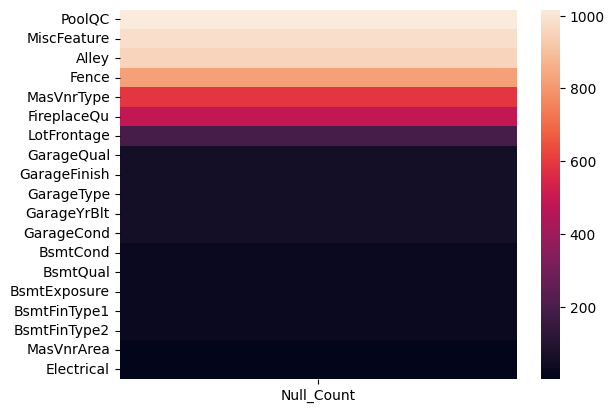

In [ ]:
# checking for columns has null value
null_count_df = train.isnull().sum().sort_values(ascending=False).to_frame().rename(columns={0: 'Null_Count'}).query('Null_Count != 0')
display(null_count_df)

null_columns = null_count_df.index.tolist()
display(train[null_columns].describe())
display(train[null_columns].info())

sns.heatmap(null_count_df)

In [ ]:
null_count_df['Null percentage'] = null_count_df['Null_Count']/len(train)
null_count_df

,Null_Count,Null percentage
PoolQC,1017,0.995108
MiscFeature,982,0.960861
Alley,956,0.935421
Fence,820,0.802348
MasVnrType,590,0.577299
FireplaceQu,487,0.476517
LotFrontage,190,0.185910
GarageQual,54,0.052838
GarageFinish,54,0.052838
GarageType,54,0.052838


In [ ]:
import matplotlib.gridspec as gridspec
from scipy import stats
import matplotlib.style as style
def plotting_3_chart(data, feature):

    style.use('fivethirtyeight')

    ## Creating a customized chart. and giving in figsize and everything.
    fig = plt.figure(constrained_layout=True, figsize=(12,8))
    ## creating a grid of 3 cols and 3 rows.
    grid = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)
    #gs = fig3.add_gridspec(3, 3)

    ## Customizing the histogram grid.
    ax1 = fig.add_subplot(grid[0, :2])
    ## Set the title.
    ax1.set_title('Histogram')
    ## plot the histogram.
    sns.distplot(data.loc[:,feature], norm_hist=True, ax = ax1)

    # customizing the QQ_plot.
    ax2 = fig.add_subplot(grid[1, :2])
    ## Set the title.
    ax2.set_title('QQ_plot')
    ## Plotting the QQ_Plot.
    stats.probplot(data.loc[:,feature], plot = ax2)

    ## Customizing the Box Plot.
    ax3 = fig.add_subplot(grid[:, 2])
    ## Set title.
    ax3.set_title('Box Plot')
    ## Plotting the box plot.
    sns.boxplot(data.loc[:,feature], orient='v', ax = ax3);


skewness: 1.7620722977926118


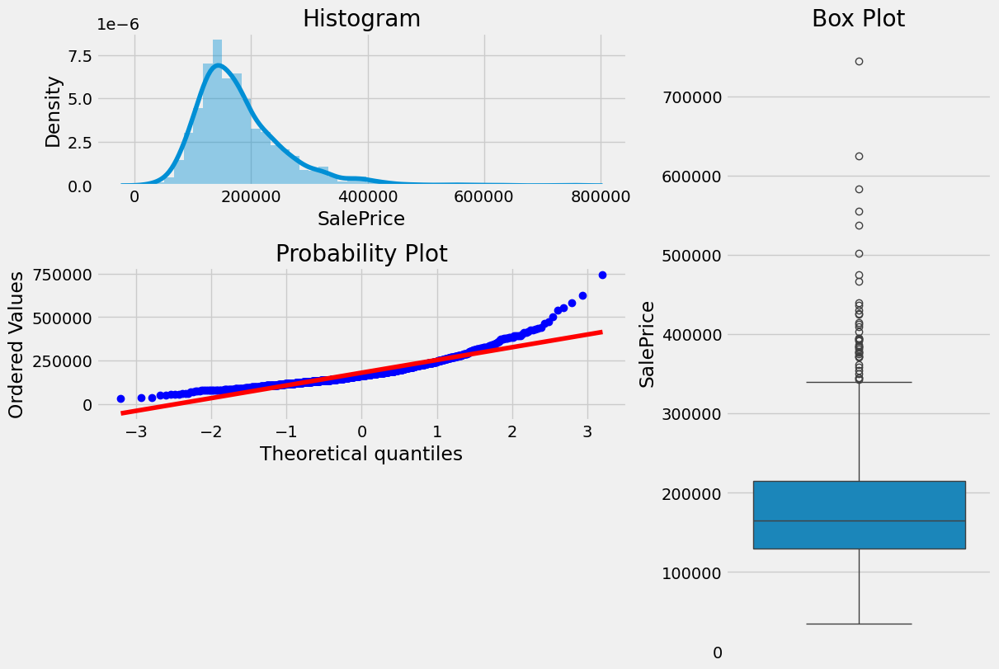

In [ ]:
# checking target variable SalePrice
plotting_3_chart(train, 'SalePrice')
print('skewness:', train['SalePrice'].skew())

In [ ]:
# checking the numerical and categorical variables
numerical_columns = train.select_dtypes(include=['float64', 'int64']).columns.to_list()
categorical_columns = train.select_dtypes(include=['object']).columns.to_list()


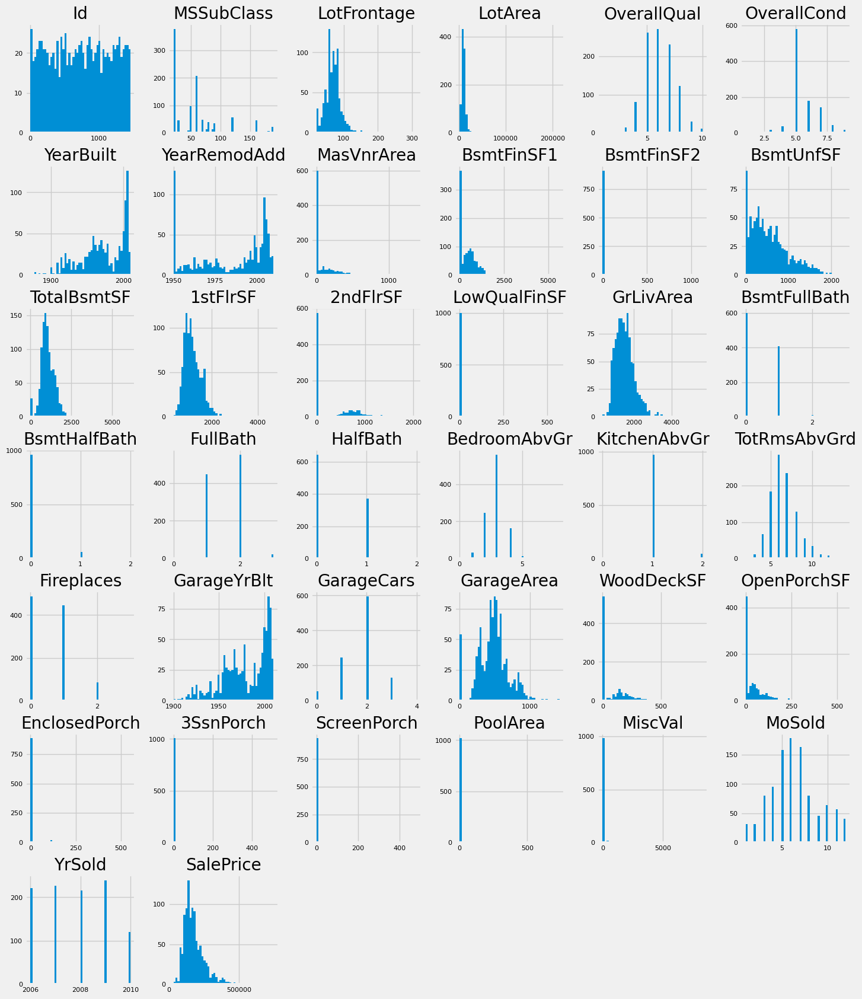

In [ ]:
# distribution of numerical columns
train[numerical_columns].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
plt.show()

The Null value in categorical columns also means 'do not have this feature', but not an error.

Also, according to the features description and the hist plot of the numerical columns, it is better to take `MSSubClass` and `MoSold` into to one-hot categorical variables, rather than numerical variables.

In [ ]:
extra_one_hot = ['MSSubClass', 'MoSold']
numerical_columns = list(set(numerical_columns).difference(extra_one_hot))

In [ ]:
numerical_columns_no_target = list(set(numerical_columns).difference(['SalePrice']))

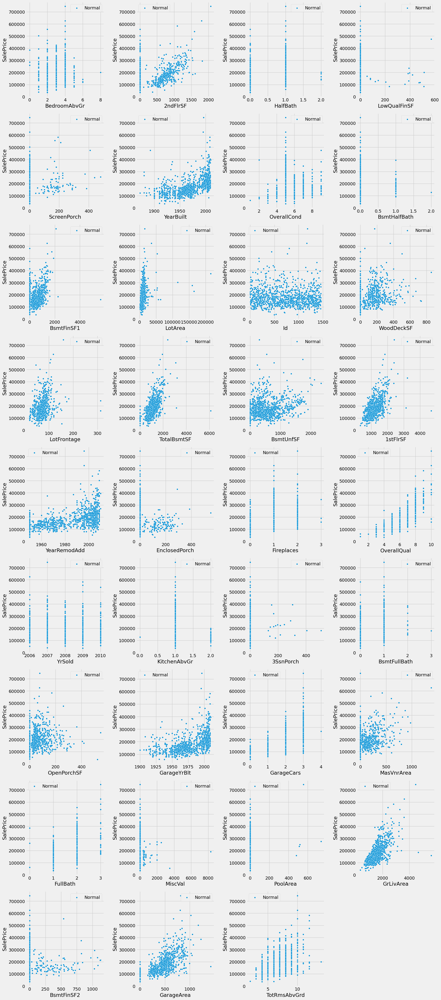

In [ ]:
len_n = len(numerical_columns_no_target)
n_rows = int(len_n/4) + (1 if len_n%4 != 0 else 0)
_, axes = plt.subplots(n_rows, 4, figsize=(20, 5*n_rows))
for col, ax in zip(numerical_columns_no_target, axes.flatten()):
  series = train[col]

  sns.scatterplot(x=series, y=train['SalePrice'], s=20,
                  label='Normal', ax=ax)
  ax.set_xlabel(col); ax.set_ylabel('SalePrice')

axes[-1][-1].set_visible(False)
plt.legend(frameon=False)
plt.tight_layout()
plt.show()

In [ ]:
num_corr_martix = train[numerical_columns].corr()

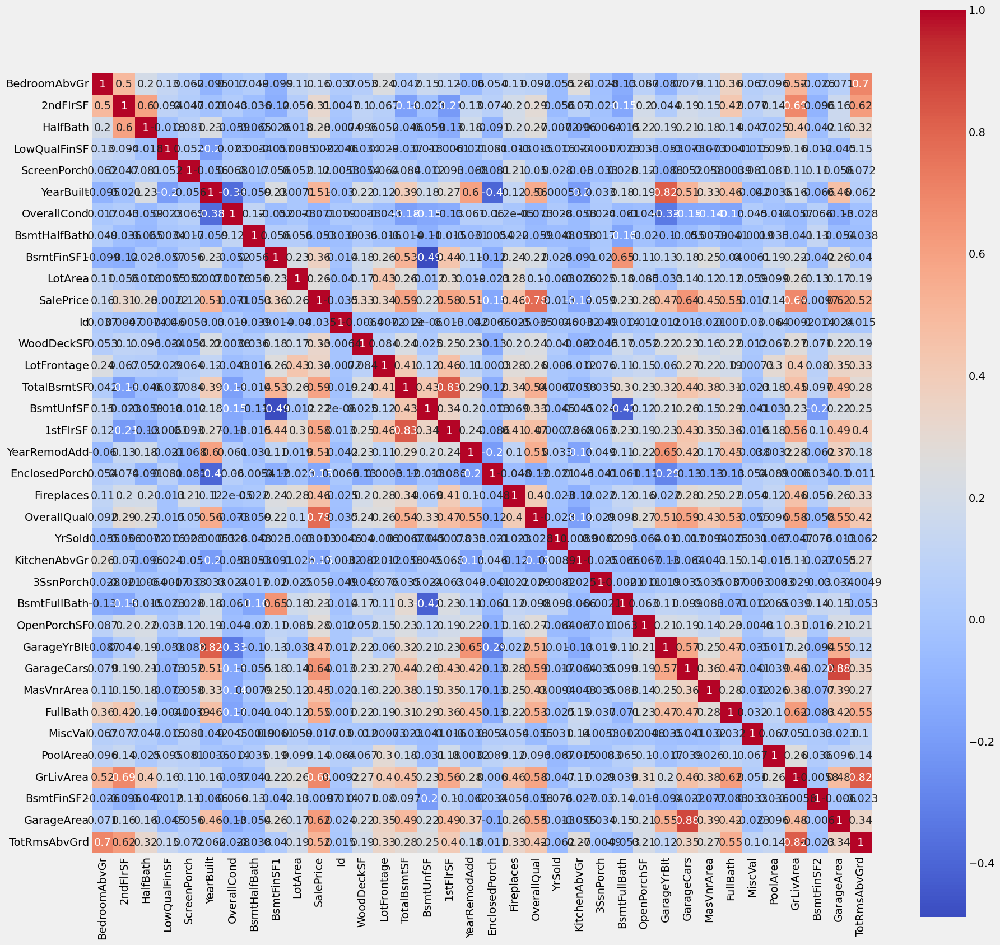

In [ ]:
_, ax = plt.subplots(1,1, figsize=(20, 20))
sns.heatmap(num_corr_martix, cmap='coolwarm', annot=True, square=True, ax=ax)
plt.show()

# Handking Outliers

First identify possible outliers for the continuous numerical columns. For the columns that skewness larger than 1, use the IQR method to identify the outliers; for the skewness less or equal to 1, use the 3 times sigma method.

In [ ]:
train_cleaned = train.copy()

In [ ]:
numerical_columns_no_target = list(set(numerical_columns).difference(['SalePrice']))

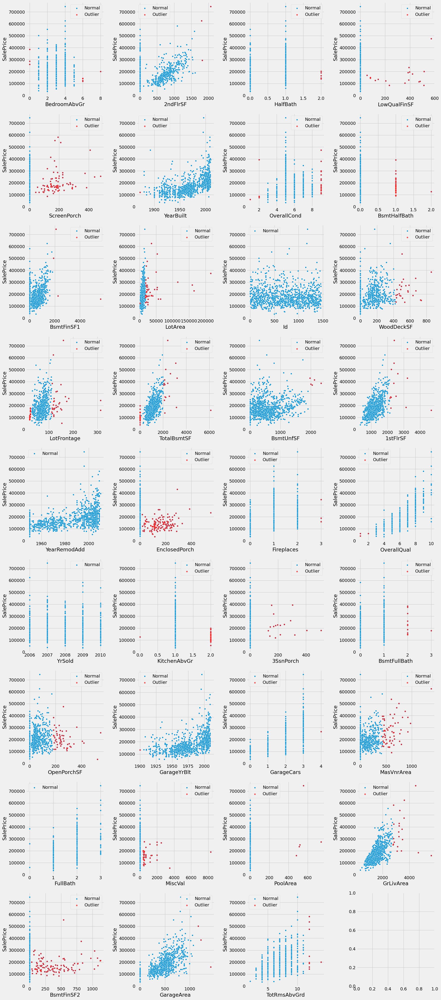

In [ ]:
len_cnc = len(numerical_columns_no_target)
n_rows = int(len_cnc/4) + (1 if len_cnc%4 != 0 else 0)
outlier_idx = {}
_, axes = plt.subplots(n_rows, 4, figsize=(20, 5*n_rows))
for col, ax in zip(numerical_columns_no_target, axes.flatten()):
  series = train_cleaned[col]
  if abs(series.skew()) > 1:
    q1, q3 = series.quantile([0.25, 0.75])
    iqr = q3 - q1
    lower, upper = q1 - 1.5*iqr, q3 + 1.5*iqr
  else:
    mu, sigma = series.mean(), series.std(ddof=0)
    lower, upper = mu - 3*sigma, mu + 3*sigma
  mask_out = (series < lower) | (series > upper)
  outlier_idx[col] = (series.index[mask_out], lower, upper)

  # 3. plot original points
  sns.scatterplot(x=series, y=train_cleaned['SalePrice'], s=20,
                  label='Normal', ax=ax)
  # plot the possible outliers
  sns.scatterplot(x=train_cleaned.loc[mask_out, col],
                  y=train_cleaned['SalePrice'][mask_out],
                  color='red',  alpha=0.7, s=25, label='Outlier',ax=ax)
  ax.set_xlabel(col); ax.set_ylabel('SalePrice')
plt.legend(frameon=False)
plt.tight_layout()
plt.show()

In [ ]:
display(train.loc[(train['OverallCond'] == 2) & (train['SalePrice'] > 300000)][['OverallCond', 'GrLivArea', 'OverallQual', 'SalePrice']])

,OverallCond,GrLivArea,OverallQual,SalePrice
378,2,1856,9,394432


In [ ]:
outliers = {'drop': [], 'winsorize': []}
# MasVnrArea outliers > 1000
outliers['drop'].extend(train_cleaned.loc[train_cleaned['MasVnrArea']> 1000].index.values.tolist())

# GrLivArea outliers > 4000
outliers['drop'].extend(train_cleaned[train_cleaned['GrLivArea']> 4000].index.values.tolist())


# 2ndFlrSF outliers > 1500 and SalePrice almost 300000 -> index 304
# display(train.loc[(train['2ndFlrSF']> 1500) & (train['SalePrice'] < 300000)])
outliers['winsorize'].append(304)

# LotFrontage outliers > 300
outliers['winsorize'].extend(train_cleaned.loc[train_cleaned['LotFrontage']> 300].index.values.tolist())

# GarageArea outliers > 1000 and SalePrice less than 200000 -> index 1298
# display(train_cleaned.loc[(train_cleaned['GarageArea']> 1000) & (train_cleaned['SalePrice'] < 200000)])
outliers['drop'].append(1298)

# OpenPorchSF outliers > 4000 and SalePrice less than 100000 -> index 495
# display(train_cleaned.loc[(train_cleaned['OpenPorchSF']> 400) & (train_cleaned['SalePrice'] < 100000)])
outliers['drop'].append(495)

# BsmtFinSF1 outliers > 4000
outliers['drop'].extend(train_cleaned.loc[train_cleaned['BsmtFinSF1']> 4000].index.values.tolist())


# TotalBsmtSF outliers > 6000
outliers['drop'].extend(train_cleaned.loc[train_cleaned['TotalBsmtSF']> 6000].index.values.tolist())

# MiscVal outliers > 8000
outliers['drop'].extend(train_cleaned[train_cleaned['MiscVal']> 8000].index.values.tolist())

# 1stFlrSF outliers > 4000
outliers['drop'].extend(train_cleaned.loc[train_cleaned['1stFlrSF']> 4000].index.values.tolist())

set(outliers['drop']), len(set(outliers['drop'])), set(outliers['winsorize']), len(set(outliers['winsorize']))

({495, 523, 1169, 1182, 1230, 1298}, 6, {304, 934, 1298}, 3)

In [ ]:
train_cleaned.loc[304,'2ndFlrSF'] = outlier_idx['2ndFlrSF'][2]
train_cleaned.loc[304,'2ndFlrSF']

np.float64(1676.4660356519494)

In [ ]:
train_cleaned.loc[934,'LotFrontage'] = outlier_idx['LotFrontage'][2]
train_cleaned.loc[934,'LotFrontage']


np.float64(111.5)

In [ ]:
train_cleaned.drop(index=list(set(outliers['drop'])), inplace=True)

In [ ]:
train_cleaned

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
135,136,20,RL,80.0,10400,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2008,WD,Normal,174000
1452,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
762,763,60,FV,72.0,8640,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2010,Con,Normal,215200
932,933,20,RL,84.0,11670,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Normal,320000
435,436,60,RL,43.0,10667,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,ConLw,Normal,212000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,1096,20,RL,78.0,9317,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Normal,176432
1130,1131,50,RL,65.0,7804,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,12,2009,WD,Normal,135000
1294,1295,20,RL,60.0,8172,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,115000
860,861,50,RL,55.0,7642,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2007,WD,Normal,189950


# Handling Null Values

In [ ]:
null_count_df = train_cleaned.isnull().sum().sort_values(ascending=False).to_frame().rename(columns={0: 'Null_Count'}).query('Null_Count != 0')
null_count_df['Null percentage'] = null_count_df['Null_Count']/len(train_cleaned)
null_count_df

,Null_Count,Null percentage
PoolQC,1013,0.997047
MiscFeature,977,0.961614
Alley,950,0.935039
Fence,816,0.803150
MasVnrType,587,0.577756
FireplaceQu,486,0.478346
LotFrontage,189,0.186024
GarageQual,53,0.052165
GarageFinish,53,0.052165
GarageType,53,0.052165


Drop the features that null precentage over 90%.

In [ ]:
train_cleaned.drop(columns=['PoolQC', 'MiscFeature', 'Alley'], inplace=True)

In [ ]:
test.drop(columns=['PoolQC', 'MiscFeature', 'Alley'], inplace=True)

For the features that Null percentage less than 1%, we can test whether it mathc the MCAR.

In [ ]:
train_cleaned_dropping_null_less_than_1 = train_cleaned[['MasVnrArea', 'Electrical']].dropna()

In [ ]:
len(train_cleaned_dropping_null_less_than_1)/len(train_cleaned)

0.9960629921259843

In [ ]:
obj_null_less_than_1 = ['Electrical']
# cca_df = pd.DataFrame()
for col in obj_null_less_than_1:
  temp = pd.concat([train_cleaned[col].value_counts()/len(train_cleaned), train_cleaned_dropping_null_less_than_1[col].value_counts()/len(train_cleaned_dropping_null_less_than_1)], axis=1)
  temp.columns = [f'{col} Original', f'{col} CCA']
  display(temp)



,Electrical Original,Electrical CCA
Electrical,,
SBrkr,0.915354,0.916008
FuseA,0.058071,0.058300
FuseF,0.022638,0.022727
FuseP,0.002953,0.002964


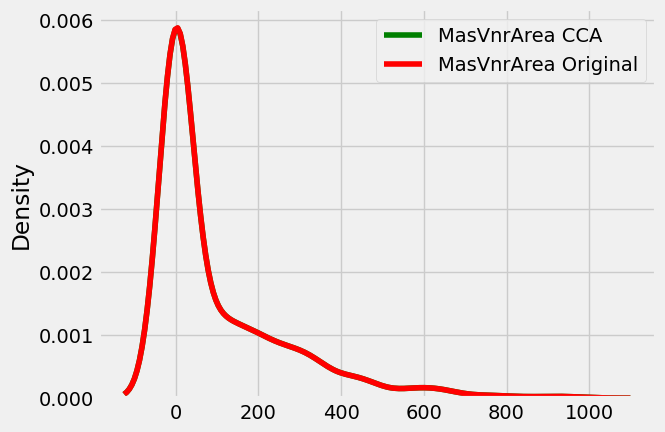

In [ ]:
ax = sns.distplot(x=train_cleaned_dropping_null_less_than_1['MasVnrArea'], color='green', label='MasVnrArea CCA', hist=False)
sns.distplot(x=train_cleaned['MasVnrArea'], color='red', label='MasVnrArea Original', hist=False, ax=ax)
plt.legend()
plt.show()

Basically there are no difference, so it is decided to drop these records.

In [ ]:
train_cleaned = train_cleaned.loc[train_cleaned_dropping_null_less_than_1.index]

Drop the ID column.

In [ ]:
train_cleaned.drop(columns=['Id'], inplace=True)

In [ ]:
train_cleaned.shape

(1012, 77)

In [ ]:
test.drop(columns=['Id'], inplace=True)

In [ ]:
test.shape

(438, 77)

The remain Null columns are `Bsmt` features, `Fence`, `MasVnrType`, `FireplaceQ`, `LotFrontage`, `GarageQual`, `GarageFinish`, `GarageType`, `GarageYrBlt`, `GarageCond`.

In [ ]:
new_null_df = train_cleaned.isnull().sum().to_frame().rename(columns={0: 'Null_Count'}).query('(Null_Count) > 0')
display(new_null_df)
remanin_null_features = new_null_df.index.tolist()
remanin_null_features

,Null_Count
LotFrontage,188
MasVnrType,583
BsmtQual,26
BsmtCond,26
BsmtExposure,26
BsmtFinType1,26
BsmtFinType2,26
FireplaceQu,484
GarageType,53
GarageYrBlt,53


['LotFrontage',
 'MasVnrType',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'Fence']

Here, as I said, the Null value in categorical columns is not error, but means that no this feature. Therefore, it can be just imputed as 'NA' as a category.

In [ ]:
train_cleaned[train_cleaned['MasVnrType'].isnull()][['MasVnrType', 'MasVnrArea']]

,MasVnrType,MasVnrArea
762,NaN,0.0
435,NaN,0.0
1210,NaN,0.0
1118,NaN,0.0
1084,NaN,0.0
...,...,...
1044,NaN,0.0
1095,NaN,0.0
1130,NaN,0.0
1294,NaN,0.0


In [ ]:
train_cleaned_ = train_cleaned.copy()

In [ ]:
train_cleaned_['MasVnrType'] = train_cleaned_['MasVnrType'].fillna('NA')

In [ ]:
train_cleaned_[train_cleaned['GarageType'].isnull()][['GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond', 'GarageArea', 'GarageCars']].shape # They are just the same records that having null value

(53, 7)

In [ ]:
train_cleaned_[['GarageYrBlt', 'GarageArea', 'GarageCars']] = train_cleaned_[['GarageYrBlt', 'GarageArea', 'GarageCars']].fillna(0)
train_cleaned_[['GarageType', 'GarageQual', 'GarageCond', 'GarageFinish']] = train_cleaned_[['GarageType', 'GarageQual', 'GarageCond', 'GarageFinish',]].fillna('NA')

In [ ]:
train_cleaned_[['BsmtCond', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']] = train_cleaned_[['BsmtCond', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']].fillna('NA')

In [ ]:
train_cleaned_['FireplaceQu'] = train_cleaned_['FireplaceQu'].fillna('NA')
train_cleaned_['Fence'] = train_cleaned_['Fence'].fillna('NA')

In [ ]:
Nn = train_cleaned_[train_cleaned_['LotFrontage'].isnull()]['Neighborhood'].unique()
temp = train_cleaned_.groupby('Neighborhood')['LotFrontage'].count()[Nn].to_frame()
display(temp)
Nn_lt_10 = temp[temp['LotFrontage']<10].index.to_list()
Nn_lt_10

,LotFrontage
Neighborhood,
Gilbert,31
NAmes,124
ClearCr,7
CollgCr,90
Sawyer,32
Edwards,70
Mitchel,24
NWAmes,33
OldTown,80


['ClearCr', 'NPkVill', 'Veenker', 'MeadowV']

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
numerical_columns = train_cleaned.select_dtypes(include=['float64', 'int64']).columns.to_list()
extra_one_hot = ['MSSubClass', 'MoSold']
numerical_columns = list(set(numerical_columns).difference(extra_one_hot))
numerical_columns_no_target = list(set(numerical_columns).difference(['SalePrice']))

for nei, sub_index in train_cleaned_.groupby('Neighborhood')['LotFrontage'].groups.items():
  if nei not in Nn_lt_10:
    continue
  print(nei+':')
  display(train_cleaned_.loc[sub_index, 'LotFrontage'])
  k = KNNImputer(n_neighbors=5, weights='distance')
  d= pd.DataFrame(data=k.fit_transform(train_cleaned_.loc[sub_index, numerical_columns_no_target]), columns=k.get_feature_names_out(), index=sub_index)
  display(d['LotFrontage'])


ClearCr:


,LotFrontage
1262,NaN
818,80.0
120,NaN
706,NaN
249,NaN
1065,80.0
457,NaN
1270,NaN
828,NaN
69,81.0


,LotFrontage
1262,84.667402
818,80.000000
120,83.074482
706,81.681942
249,81.936002
1065,80.000000
457,78.941650
1270,83.226784
828,81.966383
69,81.000000


MeadowV:


,LotFrontage
434,21.0
1007,21.0
1068,42.0
357,44.0
75,21.0
1367,41.0
1039,21.0
489,21.0
1038,21.0
1086,NaN


,LotFrontage
434,21.000000
1007,21.000000
1068,42.000000
357,44.000000
75,21.000000
1367,41.000000
1039,21.000000
489,21.000000
1038,21.000000
1086,23.752094


NPkVill:


,LotFrontage
504,24.0
962,24.0
675,24.0
195,24.0
1431,NaN
550,53.0


,LotFrontage
504,24.000000
962,24.000000
675,24.000000
195,24.000000
1431,35.183095
550,53.000000


Veenker:


,LotFrontage
1155,90.0
849,80.0
326,32.0
160,NaN
53,68.0
1253,NaN
400,38.0
1,80.0


,LotFrontage
1155,90.000000
849,80.000000
326,32.000000
160,70.282300
53,68.000000
1253,57.815721
400,38.000000
1,80.000000


The only really missing values column is `LotFrontage`, it can be imputed using median value according the correspondin g group of `Neighborhood`. Here the idea is using the median of its corresponding `Neighborhood` group.

In [ ]:
from sklearn.linear_model import Ridge, Lasso, LinearRegression, ElasticNet, LassoCV, RidgeCV, ElasticNetCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, PowerTransformer, PolynomialFeatures, OrdinalEncoder, OneHotEncoder, FunctionTransformer
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, KFold
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel, RFE, VarianceThreshold, RFECV
from scipy.stats import boxcox
from scipy.special import inv_boxcox
import statsmodels.api as sm
import statsmodels.stats.api as sms

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

class HierarchicalMedianKNNImputer(BaseEstimator, TransformerMixin):
    """
    Step-1  median by (Neighborhood , Street)   if cnt(count)>=min_ns
    Step-2  median by (Neighborhood)            if cnt>=min_n
    Step-3  left-over NaNs -> KNN imputer
    """
    def __init__(self, col='LotFrontage',
                 key1='Neighborhood', key2='Street',
                 min_ns=10, min_n=10,
                 knn_k=5, dataframe=False,
                 drop_key=False, drop_obj=False):
        self.col = col
        self.key1 = key1
        self.key2 = key2
        self.min_ns = min_ns
        self.min_n  = min_n
        self.knn_k  = knn_k
        self.dataframe = dataframe
        self.drop_key = drop_key
        self.drop_obj = drop_obj

        # imputer for other numerical columns
        self.num_imputer = SimpleImputer(strategy='constant', fill_value=0)

    # ---------------- fit -----------------
    def fit(self, X, y=None):
        df = X.copy()

        # impute the other numerical columns first
        self.num_cols_ = df.select_dtypes(include=['float', 'int']).columns
        self.num_imputer.fit(df[self.num_cols_.difference([self.col])])

        # group medians & counts
        grp12 = df.groupby([self.key1, self.key2])[self.col]
        self.med12_ = grp12.median()
        self.cnt12_ = grp12.count()

        grp1 = df.groupby(self.key1)[self.col]
        self.med1_  = grp1.median()
        self.cnt1_  = grp1.count()

        # train local KNN on numeric cols
        self.knn_dict_ = {}
        for neigh, sub_index in df.groupby(self.key1).groups.items():
            if len(sub_index) >= self.knn_k:          # ensure enough neighbours
                imp = KNNImputer(n_neighbors=self.knn_k, weights='distance')
                imp.fit(df.loc[sub_index, self.num_cols_])
                self.knn_dict_[neigh] = imp

        # gloabl KNN imputer for the remain na
        self.knn_global_ = KNNImputer(n_neighbors=self.knn_k, weights='distance')
        self.knn_global_.fit(df[self.num_cols_])

        self.obj_cols_ = (df.select_dtypes(include=['object']).columns.difference([self.key1, self.key2]))
        return self

    # ---------------- transform -----------
    def transform(self, X):
        df = X.copy()

        # impute the other numerical columns first
        df[self.num_cols_.difference([self.col])] = self.num_imputer.transform(df[self.num_cols_.difference([self.col])])

        # level-wise median
        miss = df[self.col].isna()
        if miss.any():
            def _median_rule(row):
                k1, k2 = row[self.key1], row[self.key2]
                if self.cnt1_.get(k1, 0) >= self.min_n:
                    if self.cnt12_.get((k1, k2), 0) >= self.min_ns:
                        return self.med12_[(k1, k2)]
                    return self.med1_[k1]
                return np.nan           # leave for KNN
            df.loc[miss, self.col] = df.loc[miss].apply(_median_rule, axis=1)

        # KNN for the still-missing rows
        rem = df[self.col].isna()

        if rem.any():
            for neigh, sub_idx in df[rem].groupby(self.key1).groups.items():
                imp = self.knn_dict_.get(neigh, self.knn_global_)
                imputed = pd.DataFrame(imp.transform(df.loc[sub_idx, self.num_cols_]),
                          index=sub_idx, columns=imp.get_feature_names_out())
                df.loc[sub_idx, self.num_cols_] = imputed


        if self.drop_key:
            df.drop(columns=[self.key1, self.key2], inplace=True)
        if self.drop_obj:
            df.drop(columns=self.obj_cols_, inplace=True)

        return df if self.dataframe else df.values

    # ------------- feature names ----------
    def get_feature_names_out(self, input_features=None):
        feats = list(input_features)
        if self.drop_key:
            feats = [f for f in feats if f.split('__')[-1] not in (self.key1, self.key2)]
        if self.drop_obj:
            feats = [f for f in feats if f.split('__')[-1] not in self.obj_cols_]
        return np.asarray(feats, dtype=object)

In [ ]:
temp_ = HierarchicalMedianKNNImputer(dataframe=True, drop_key=True, drop_obj=True).fit_transform(train_cleaned[numerical_columns_no_target + ['Neighborhood', 'Street']])
temp_

,BedroomAbvGr,2ndFlrSF,HalfBath,LowQualFinSF,ScreenPorch,YearBuilt,OverallCond,BsmtHalfBath,BsmtFinSF1,LotArea,...,GarageYrBlt,GarageCars,MasVnrArea,FullBath,MiscVal,PoolArea,GrLivArea,BsmtFinSF2,GarageArea,TotRmsAbvGrd
135,3.0,0.0,0.0,0.0,0.0,1970.0,6.0,0.0,0.0,10400.0,...,1970.0,2.0,288.0,2.0,0.0,0.0,1682.0,0.0,530.0,7.0
1452,2.0,0.0,0.0,0.0,0.0,2005.0,5.0,0.0,547.0,3675.0,...,2005.0,2.0,80.0,1.0,0.0,0.0,1072.0,0.0,525.0,5.0
762,3.0,783.0,1.0,0.0,0.0,2009.0,5.0,0.0,24.0,8640.0,...,2009.0,2.0,0.0,2.0,0.0,0.0,1547.0,0.0,614.0,7.0
932,3.0,0.0,0.0,0.0,0.0,2006.0,5.0,0.0,0.0,11670.0,...,2006.0,3.0,302.0,2.0,0.0,0.0,1905.0,0.0,788.0,8.0
435,3.0,834.0,1.0,0.0,0.0,1996.0,6.0,0.0,385.0,10667.0,...,1996.0,2.0,0.0,2.0,0.0,0.0,1661.0,344.0,550.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,3.0,0.0,0.0,0.0,0.0,2006.0,5.0,0.0,24.0,9317.0,...,2006.0,2.0,0.0,2.0,0.0,0.0,1314.0,0.0,440.0,6.0
1130,4.0,653.0,0.0,0.0,0.0,1928.0,3.0,0.0,622.0,7804.0,...,1981.0,2.0,0.0,2.0,0.0,0.0,1981.0,0.0,576.0,7.0
1294,2.0,0.0,0.0,0.0,0.0,1955.0,7.0,0.0,167.0,8172.0,...,1957.0,2.0,0.0,1.0,0.0,0.0,864.0,0.0,572.0,5.0
860,3.0,514.0,1.0,0.0,0.0,1918.0,8.0,0.0,0.0,7642.0,...,1925.0,1.0,0.0,1.0,0.0,0.0,1426.0,0.0,216.0,7.0


In [ ]:
temp_.loc[[160, 1253], 'LotFrontage']

,LotFrontage
160,70.282300
1253,57.815721


# Neighborhood Tier

In [ ]:
def plot_linear_vs_quad(df, y, features, second_order=True, cols=4):
  """
  plot the 1 and 2 order of the regression curve for each given feature and target.

  df : pandas DataFrame, containing features and targets
  y : string, target column name
  features : list of features to be plotted
  second_order : whether plot the second order reggression curve
  cols : number of subplots per row
  """
  n, rows = len(features), math.ceil(len(features)/cols)
  fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*5))
  axes = axes.flatten()

  for i, feat in enumerate(features):
      ax = axes[i]
      try:
        # scatter
        sns.scatterplot(x=df[feat], y=y, s=12, alpha=.6, ax=ax, color='grey')
        # linear
        sns.regplot(x=df[feat], y=y, order=1, scatter=False,
                    ax=ax, color='red', label='deg1')
        # square
        if second_order:
          sns.regplot(x=df[feat], y=y, order=2, scatter=False,
                      ax=ax, color='green', label='deg2')
        ax.set_title(feat, fontsize=9)
        ax.legend(frameon=False, fontsize=6)
      except:
        continue
  for j in range(i+1, rows*cols):
      fig.delaxes(axes[j])

  plt.tight_layout()
  plt.show()

In [ ]:
from sklearn.cluster import KMeans
Neighborhood_stats = (train_cleaned.groupby('Neighborhood')['SalePrice']
           .agg(median='median',
                p25   =lambda x: x.quantile(.25),
                p75   =lambda x: x.quantile(.75),
                p90   =lambda x: x.quantile(.90),
                n     ='size')
           .reset_index())

X = Neighborhood_stats[['median','p75','p25','p90']].values
labels = KMeans(n_clusters=4, random_state=0).fit_predict(MinMaxScaler().fit_transform(X))
Neighborhood_stats['Cluster'] = labels
Neighborhood_stats

,Neighborhood,median,p25,p75,p90,n,Cluster
0,Blmngtn,179870.0,172875.00,208242.5,228300.0,14,2
1,Blueste,124000.0,124000.00,124000.0,124000.0,1,3
2,BrDale,103000.0,91000.00,112250.0,117500.0,12,3
3,BrkSide,119000.0,100000.00,134900.0,180500.0,41,3
4,ClearCr,211000.0,188750.00,248000.0,282000.0,19,2
5,CollgCr,200320.5,163430.00,225425.0,268500.0,108,2
6,Crawfor,195550.0,163625.00,234750.0,296800.0,38,2
7,Edwards,123500.0,102000.00,145900.0,176400.0,77,3
8,Gilbert,184000.0,175500.00,214500.0,240000.0,51,2
9,IDOTRR,108000.0,88250.00,120500.0,138520.0,23,3


In [ ]:
order = Neighborhood_stats.groupby('Cluster')['median'].median().sort_values(ascending=False).index
display(order)
tier_map = {cl:'Tier{}'.format(i+1) for i,cl in enumerate(order)}
display(tier_map)
Neighborhood_stats['Tier'] = Neighborhood_stats['Cluster'].map(tier_map)


Index([1, 2, 0, 3], dtype='int32', name='Cluster')

{1: 'Tier1', 2: 'Tier2', 0: 'Tier3', 3: 'Tier4'}

In [ ]:
Neighborhood_tier_map = {i['Neighborhood']: i['Tier'] for i in Neighborhood_stats[['Neighborhood', 'Tier']].to_dict(orient='records')}
Neighborhood_tier_map

{'Blmngtn': 'Tier2',
 'Blueste': 'Tier4',
 'BrDale': 'Tier4',
 'BrkSide': 'Tier4',
 'ClearCr': 'Tier2',
 'CollgCr': 'Tier2',
 'Crawfor': 'Tier2',
 'Edwards': 'Tier4',
 'Gilbert': 'Tier2',
 'IDOTRR': 'Tier4',
 'MeadowV': 'Tier4',
 'Mitchel': 'Tier3',
 'NAmes': 'Tier3',
 'NPkVill': 'Tier3',
 'NWAmes': 'Tier2',
 'NoRidge': 'Tier1',
 'NridgHt': 'Tier1',
 'OldTown': 'Tier4',
 'SWISU': 'Tier3',
 'Sawyer': 'Tier3',
 'SawyerW': 'Tier2',
 'Somerst': 'Tier2',
 'StoneBr': 'Tier1',
 'Timber': 'Tier2',
 'Veenker': 'Tier1'}

In [ ]:
t= train_cleaned.copy()
Loc_Tier_ordinal_map = {'Tier1': 2, 'Tier2': 1, 'Tier3': 0, 'Tier4': -1}
t['Loc_Tier'] = t['Neighborhood'].map(Neighborhood_tier_map)
t['Loc_Tier'] = t['Loc_Tier'].map(Loc_Tier_ordinal_map)
t[['Neighborhood', 'Loc_Tier']]

,Neighborhood,Loc_Tier
135,NWAmes,1
1452,Edwards,-1
762,Somerst,1
932,Somerst,1
435,CollgCr,1
...,...,...
1095,CollgCr,1
1130,SWISU,0
1294,Edwards,-1
860,Crawfor,1


,SalePrice
Loc_Tier,
-1,118250.0
0,142000.0
1,194000.0
2,290000.0


,count
Loc_Tier,
1,404
0,258
-1,246
2,104


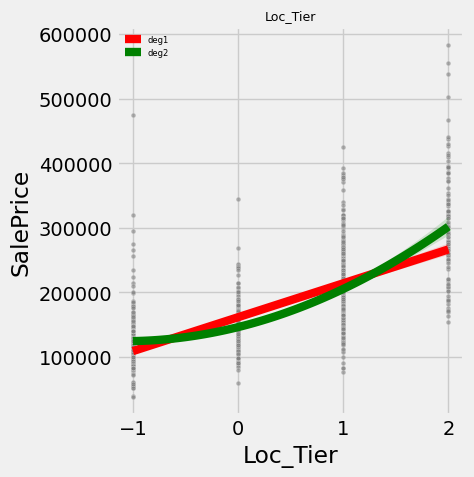

In [ ]:
display(t.groupby('Loc_Tier')['SalePrice'].median())
display(t['Loc_Tier'].value_counts())
plot_linear_vs_quad(t, t['SalePrice'], ['Loc_Tier'], second_order=True)

In [ ]:
def add_Loc_Tier(Neighborhood_tier_map, Loc_Tier_ordinal_map, df):
  df = df.copy()
  df['Loc_Tier'] = df['Neighborhood'].map(Neighborhood_tier_map)
  df['Loc_Tier'] = df['Loc_Tier'].map(Loc_Tier_ordinal_map)
  # df.drop(columns='Neighborhood', inplace=True)
  return df

In [ ]:
train_cleaned = add_Loc_Tier(Neighborhood_tier_map, Loc_Tier_ordinal_map, train_cleaned)

In [ ]:
test = add_Loc_Tier(Neighborhood_tier_map, Loc_Tier_ordinal_map, test)

# Binarization

/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:657: RuntimeWarning: invalid value encountered in divide
  lhs /= scale


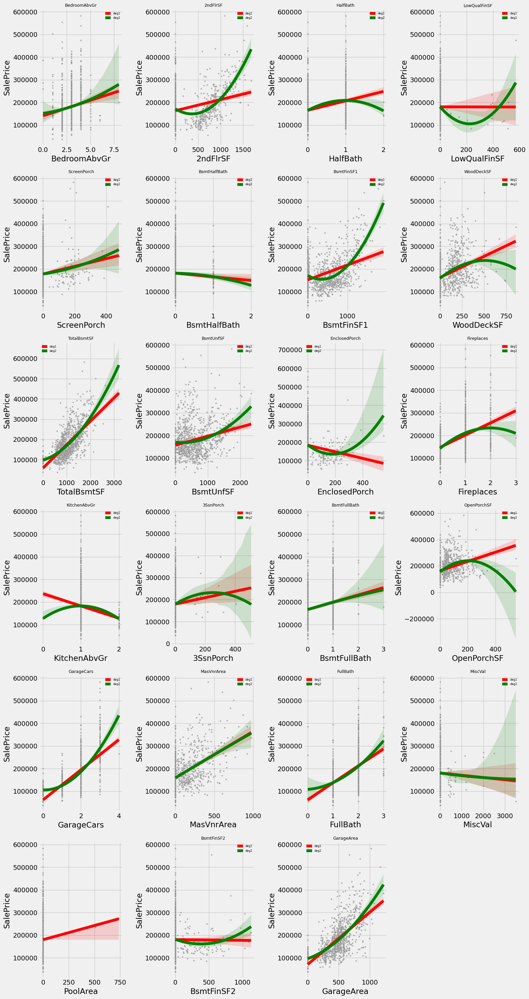

In [ ]:
numerical_columns = train_cleaned.select_dtypes(include=['float64', 'int64']).columns.to_list()
numerical_columns_no_target = list(set(numerical_columns).difference(['SalePrice']))
cols_zero_and_pos = [
    c for c in numerical_columns_no_target
    if (train_cleaned[c].min() == 0) and (train_cleaned[c] > 0).any()
]
plot_linear_vs_quad(train_cleaned, train_cleaned['SalePrice'], cols_zero_and_pos)

In [ ]:
def binarization(df):
  df = df.copy()

  bin_f = ['MiscVal', '3SsnPorch', 'WoodDeckSF', 'BsmtFinSF2', 'LowQualFinSF', 'OpenPorchSF', '2ndFlrSF', 'KitchenAbvGr', 'ScreenPorch', 'EnclosedPorch']
  for bf in bin_f:
    df[f'Has_{bf}'] = (df[bf]>0).astype(int)

  df[f'Has_Bath'] = ((df['FullBath']>0) | (df['HalfBath']>0)).astype(int)
  df[f'Has_BsmtBath'] = ((df['BsmtHalfBath']>0) | (df['BsmtFullBath']>0)).astype(int)
  return df

In [ ]:
train_cleaned = binarization(train_cleaned)

In [ ]:
test = binarization(test)

# Encoding Categorical Columns

In [ ]:
# reset the numerica columns
numerical_columns = train_cleaned.select_dtypes(include=['float64', 'int64']).columns.to_list()
categorical_columns = train_cleaned.select_dtypes(include=['object']).columns.to_list()
extra_one_hot = ['MSSubClass', 'MoSold']
categorical_columns.extend(extra_one_hot)
numerical_columns = list(set(numerical_columns).difference(extra_one_hot))
numerical_columns_no_target = list(set(numerical_columns).difference(['SalePrice']))

In [ ]:
ordinal_categorical_variables = [

    'ExterQual',       # Po < Fa < TA < Gd < Ex
    'ExterCond',       # Po < Fa < TA < Gd < Ex
    'BsmtQual',         # NA < Po < Fa < TA < Gd < Ex
    'BsmtCond',         # NA < Po < Fa < TA < Gd < Ex
    'BsmtExposure',    # NA < No < Mn < Av < Gd
    'BsmtFinType1',    # NA < Unf < LwQ < Rec < BLQ < ALQ < GLQ
    'BsmtFinType2',    # NA < Unf < LwQ < Rec < BLQ < ALQ < GLQ
    'HeatingQC',       #  Po < Fa < TA < Gd < Ex
    'KitchenQual',     #  Po < Fa < TA < Gd < Ex
    'Functional',      #  Sal < Sev < Maj2 < Maj1 < Mod < Min2 < Min1 < Typ
    'FireplaceQu',     #  NA < Po < Fa < TA < Gd < Ex
    'GarageFinish',    #  NA < Unf < RFn < Fin
    'GarageQual',      #  NA < Po < Fa < TA < Gd < Ex
    'GarageCond',      #  NA < Po < Fa < TA < Gd < Ex
    'PavedDrive',      #  N < P < Y
    'Fence'            #  NA < MnWw < GdWo < MnPrv < GdPrv
]

In [ ]:
one_hot_categorical_variables = list(set(categorical_columns).difference(ordinal_categorical_variables))
one_hot_categorical_variables

['GarageType',
 'MoSold',
 'CentralAir',
 'Neighborhood',
 'Electrical',
 'BldgType',
 'LandContour',
 'Foundation',
 'RoofStyle',
 'MSSubClass',
 'SaleType',
 'HouseStyle',
 'Street',
 'LandSlope',
 'Heating',
 'MasVnrType',
 'Exterior2nd',
 'RoofMatl',
 'LotConfig',
 'Exterior1st',
 'Condition2',
 'MSZoning',
 'Condition1',
 'Utilities',
 'SaleCondition',
 'LotShape']

In [ ]:
import math
def plot_two_by_four(
        df,
        cat_cols,
        target="SalePrice",
        palette="Set2",
        strip_alpha=0.6,
        strip_size=3,
        figsize_unit=(20, 5)
    ):

    n_cols = 4
    step = 2
    n_feat = len(cat_cols)
    n_rows = math.ceil(n_feat / 2)

    colors = sns.color_palette(palette, n_feat)


    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_unit[0], figsize_unit[1] * n_rows),
        squeeze=False
    )


    for i in range(0, n_feat, 2):
        row_idx = i // 2


        col1 = cat_cols[i]
        sns.boxplot(
            x=df[target], y=df[col1],
            ax=axes[row_idx, 0],
            orient="h",
            color=colors[i]
        )
        axes[row_idx, 0].set_title(f"{col1} - Boxplot", fontsize=11, fontweight="bold")
        axes[row_idx, 0].set_xlabel(target)

        sns.stripplot(
            x=df[target], y=df[col1],
            ax=axes[row_idx, 1],
            orient="h",
            color=colors[i],
            alpha=strip_alpha,
            size=strip_size
        )
        axes[row_idx, 1].set_title(f"{col1} - Stripplot", fontsize=11, fontweight="bold")
        axes[row_idx, 1].set_xlabel(target)


        if i + 1 < n_feat:
            col2 = cat_cols[i + 1]
            sns.boxplot(
                x=df[target], y=df[col2],
                ax=axes[row_idx, 2],
                orient="h",
                color=colors[i + 1]
            )
            axes[row_idx, 2].set_title(f"{col2} - Boxplot", fontsize=11, fontweight="bold")
            axes[row_idx, 2].set_xlabel(target)

            sns.stripplot(
                x=df[target], y=df[col2],
                ax=axes[row_idx, 3],
                orient="h",
                color=colors[i + 1],
                alpha=strip_alpha,
                size=strip_size
            )
            axes[row_idx, 3].set_title(f"{col2} - Stripplot", fontsize=11, fontweight="bold")
            axes[row_idx, 3].set_xlabel(target)
        else:

            axes[row_idx, 2].set_visible(False)
            axes[row_idx, 3].set_visible(False)

    plt.tight_layout()
    plt.suptitle(
        f"Categorical Variables vs {target} (Boxplot & Stripplot)",
        fontsize=16,
        fontweight="bold",
        y=1.02
    )
    plt.show()

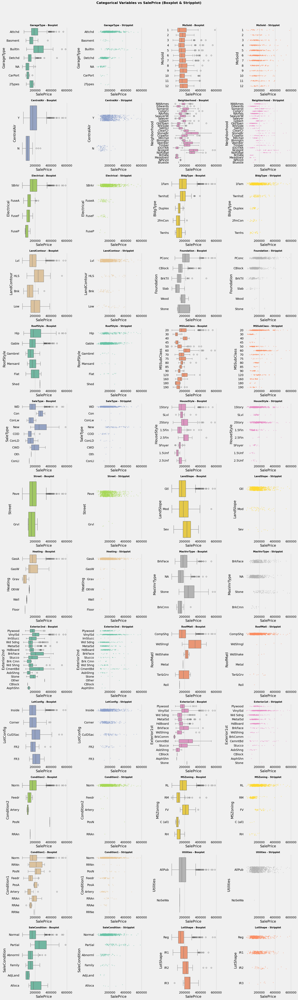

In [ ]:
plot_two_by_four(train_cleaned_, one_hot_categorical_variables)

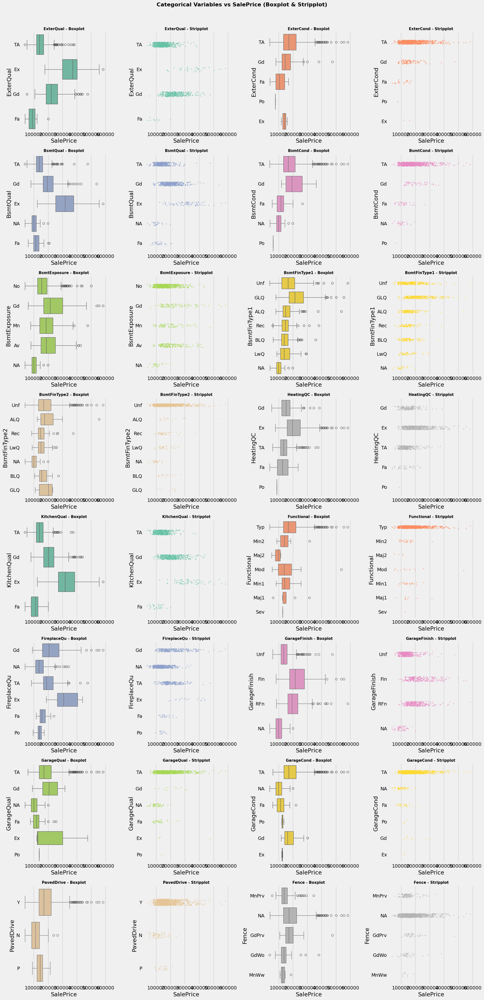

In [ ]:
plot_two_by_four(train_cleaned_, ordinal_categorical_variables)

In [ ]:
for col in ordinal_categorical_variables:
  display(train_cleaned_.groupby(col)['SalePrice'].median().sort_values(ascending=False))

,SalePrice
ExterQual,
Ex,370878.0
Gd,222000.0
TA,140000.0
Fa,89000.0


,SalePrice
ExterCond,
TA,170000.0
Gd,144450.0
Ex,139500.0
Fa,104000.0
Po,76500.0


,SalePrice
BsmtQual,
Ex,318000.0
Gd,193250.0
TA,136700.0
Fa,114000.0
NA,99150.0


,SalePrice
BsmtCond,
Gd,193879.0
TA,167240.0
Fa,117000.0
NA,99150.0
Po,61000.0


,SalePrice
BsmtExposure,
Gd,215000.0
Av,187750.0
Mn,186000.0
No,155000.0
NA,99150.0


,SalePrice
BsmtFinType1,
GLQ,213195.0
Unf,165200.0
ALQ,148500.0
Rec,146625.0
LwQ,139000.0
BLQ,138500.0
NA,99150.0


,SalePrice
BsmtFinType2,
GLQ,203125.0
ALQ,174900.0
Unf,167950.0
BLQ,155000.0
LwQ,149200.0
Rec,145500.0
NA,99150.0


,SalePrice
HeatingQC,
Ex,197000.0
Gd,152500.0
TA,135000.0
Fa,126000.0
Po,87000.0


,SalePrice
KitchenQual,
Ex,318950.0
Gd,202500.0
TA,138943.5
Fa,111750.0


,SalePrice
Functional,
Typ,167370.0
Min1,141500.0
Min2,139600.0
Mod,137900.0
Maj1,130000.0
Sev,129000.0
Maj2,97500.0


,SalePrice
FireplaceQu,
Ex,307500.0
Gd,205950.0
TA,189000.0
Fa,157000.0
Po,139500.0
NA,136500.0


,SalePrice
GarageFinish,
Fin,215000.0
RFn,192500.0
Unf,135000.0
NA,99900.0


,SalePrice
GarageQual,
Gd,206615.0
TA,170000.0
Po,137000.0
Ex,127500.0
Fa,118375.0
NA,99900.0


,SalePrice
GarageCond,
TA,170000.0
Gd,161450.0
Po,124000.0
Ex,124000.0
Fa,112252.0
NA,99900.0


,SalePrice
PavedDrive,
Y,169500.0
P,145000.0
N,112500.0


,SalePrice
Fence,
NA,173000.0
GdPrv,170000.0
MnPrv,139000.0
GdWo,137500.0
MnWw,127450.0


Use the ColumnTransformer and Pipeline to summarize the steps.

In [ ]:
from sklearn import set_config
set_config(transform_output='default')
# ordinal_categories = [
#     ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # ExterQual
#     ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # ExterCond
#     ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # BsmtQual
#     ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # BsmtCond
#     ['NA', 'No', 'Mn', 'Av', 'Gd'],                      # BsmtExposure
#     ['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],     # BsmtFinType1
#     ['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],     # BsmtFinType2
#     ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # HeatingQC
#     ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # KitchenQual
#     ['Sal', 'Sev', 'Maj2', 'Maj1', 'Mod', 'Min2', 'Min1', 'Typ'],  # Functional
#     ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # FireplaceQu
#     ['NA', 'Unf', 'RFn', 'Fin'],                         # GarageFinish
#     ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # GarageQual
#     ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # GarageCond
#     ['N', 'P', 'Y'],                                      # PavedDrive
#     ['NA', 'MnWw', 'GdWo', 'MnPrv', 'GdPrv']             # Fence
# ]

exter_heating_kitchen_cols = ['ExterQual', 'ExterCond', 'HeatingQC', 'KitchenQual']
FireplaceQu_col = ['FireplaceQu']               #
bsmt_qc_cols = ['BsmtQual', 'BsmtCond']
bsmt_expfin_cols = ['BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']
functional_cols = ['Functional']
garage_fin_cols = ['GarageFinish']
garage_qc_cols = ['GarageQual', 'GarageCond']
paved_fence_cols = ['PavedDrive', 'Fence']

ord_Exter_HeatingQC_KitchenQual_categories = [
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # ExterQual
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # ExterCond
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # HeatingQC
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],                       # KitchenQual
]
ord_Exter_HeatingQC_KitchenQual_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_Exter_HeatingQC_KitchenQual_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),
        ('shift', FunctionTransformer(lambda X: X - 2, feature_names_out='one-to-one'))
    ],
)

ord_FireplaceQu_categories = [
    ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # FireplaceQu
]
ord_FireplaceQu_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_FireplaceQu_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),

    ],
)

ord_BsmtQual_BsmtCond_categories = [
    ['Po', 'NA', 'Fa', 'TA', 'Gd', 'Ex'],                # BsmtQual
    ['Po', 'NA', 'Fa', 'TA', 'Gd', 'Ex'],                # BsmtCond
]
ord_BsmtQual_BsmtCond_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_BsmtQual_BsmtCond_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),
        ('shift', FunctionTransformer(lambda X: X - 3, feature_names_out='one-to-one'))
    ],
)

ord_BsmtExposure_BsmtFinType1_BsmtFinType2_categories  = [
    ['NA', 'No', 'Mn', 'Av', 'Gd'],               # BsmtExposure
    ['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],     # BsmtFinType1
    ['NA', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],     # BsmtFinType2
]
ord_BsmtExposure_BsmtFinType1_BsmtFinType2_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_BsmtExposure_BsmtFinType1_BsmtFinType2_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),
        ('shift', FunctionTransformer(lambda X: X - 1, feature_names_out='one-to-one'))
    ],
)

ord_Functional_categories = [
    ['Sal', 'Sev', 'Maj2', 'Maj1', 'Mod', 'Min2', 'Min1', 'Typ']
]
ord_Functional_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_Functional_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),
        ('shift', FunctionTransformer(lambda X: X - 6, feature_names_out='one-to-one'))
    ],
)

ord_GarageFinish_categories  = [
    ['NA', 'Unf', 'RFn', 'Fin'],                         # GarageFinish
]
ord_GarageFinish_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_GarageFinish_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),
        ('shift', FunctionTransformer(lambda X: X - 1, feature_names_out='one-to-one'))
    ],
)
ord_GarageQual_GarageCond_categories  = [
    ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # GarageQual
    ['NA', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],                # GarageCond
]
ord_GarageQual_GarageCond_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_GarageQual_GarageCond_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),
        ('shift', FunctionTransformer(lambda X: X - 3, feature_names_out='one-to-one'))
    ],
)

ord_PavedDrive_Fence_categories  = [
    ['N', 'P', 'Y'],                                  # PavedDrive
    ['NA', 'MnWw', 'GdWo', 'MnPrv', 'GdPrv']                     # Fence
]
ord_PavedDrive_Fence_pipe = Pipeline(
    steps=[
        ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
        ('ord', OrdinalEncoder(
            categories=ord_PavedDrive_Fence_categories,
            handle_unknown='use_encoded_value', unknown_value=-1
        )),
    ],
)

# Comine All the things.
ord_transformer = ColumnTransformer(
    transformers=[
        ('exter_heat_kitchen',  ord_Exter_HeatingQC_KitchenQual_pipe, exter_heating_kitchen_cols),
        ('FireplaceQu', ord_FireplaceQu_pipe, FireplaceQu_col),
        ('bsmt_qc', ord_BsmtQual_BsmtCond_pipe, bsmt_qc_cols),
        ('bsmt_exp_fin', ord_BsmtExposure_BsmtFinType1_BsmtFinType2_pipe, bsmt_expfin_cols),
        ('functional', ord_Functional_pipe, functional_cols),
        ('garage_finish', ord_GarageFinish_pipe, garage_fin_cols),
        ('garage_qc', ord_GarageQual_GarageCond_pipe, garage_qc_cols),
        ('paved_fence', ord_PavedDrive_Fence_pipe, paved_fence_cols)
    ],
    remainder='drop',
    verbose_feature_names_out=False
)

ord_pipe = Pipeline([
    ('encode', ord_transformer)
])

one_hot_pipe = Pipeline([
    ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
    ('one-hot',OneHotEncoder(handle_unknown='ignore', drop=None))
])

num_pipe = Pipeline([
    ('median_impute', HierarchicalMedianKNNImputer(dataframe=True, drop_key=True, drop_obj=True).set_output(transform="pandas")),
    ('pass', 'passthrough')
])

prep = ColumnTransformer([
    ('ord_encode', ord_pipe, ordinal_categorical_variables),
    ('one-hot_encode', one_hot_pipe, one_hot_categorical_variables),
    ('num_prep', num_pipe, numerical_columns_no_target+['Neighborhood', 'Street'])
], remainder='drop')

In [ ]:
train_cleaned_ = pd.DataFrame(data=prep.fit_transform(train_cleaned), columns=[s.split('__')[-1] for s in prep.get_feature_names_out()], index=train_cleaned.index)
train_cleaned_

,ExterQual,ExterCond,HeatingQC,KitchenQual,FireplaceQu,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,...,GarageCars,MasVnrArea,FullBath,MiscVal,PoolArea,Has_ScreenPorch,Has_KitchenAbvGr,BsmtFinSF2,GarageArea,TotRmsAbvGrd
135,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,...,2.0,288.0,2.0,0.0,0.0,0.0,1.0,0.0,530.0,7.0
1452,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,5.0,0.0,...,2.0,80.0,1.0,0.0,0.0,0.0,1.0,0.0,525.0,5.0
762,0.0,0.0,2.0,1.0,0.0,1.0,0.0,1.0,5.0,0.0,...,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,614.0,7.0
932,2.0,0.0,2.0,2.0,4.0,2.0,1.0,0.0,0.0,0.0,...,3.0,302.0,2.0,0.0,0.0,0.0,1.0,0.0,788.0,8.0
435,1.0,0.0,2.0,1.0,3.0,1.0,0.0,2.0,5.0,4.0,...,2.0,0.0,2.0,0.0,0.0,0.0,1.0,344.0,550.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,1.0,0.0,1.0,1.0,4.0,1.0,0.0,0.0,5.0,0.0,...,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,440.0,6.0
1130,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,3.0,0.0,...,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,576.0,7.0
1294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,2.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,572.0,5.0
860,1.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,216.0,7.0


In [ ]:
display(temp_.loc[[160, 1253], 'LotFrontage'])
train_cleaned_.loc[[160, 1253], 'LotFrontage']

,LotFrontage
160,70.282300
1253,57.815721


,LotFrontage
160,70.282288
1253,57.815722


# Log Transformation

In [ ]:
t = train_cleaned_.copy()
t['SalePrice'] = train_cleaned['SalePrice']
t_skew_df = t[numerical_columns_no_target].skew().sort_values(ascending=False).to_frame().reset_index().rename(columns={0: 'skewness', 'index': 'feature'}).query('abs(skewness) > 1')
t_corr_martix = t[numerical_columns_no_target+['SalePrice']].corr()
t[numerical_columns_no_target] = np.log1p(t[numerical_columns_no_target])
log1p_t_corr_martix = t[numerical_columns_no_target+['SalePrice']].corr()

def fill(row):
    row['feature_y_corr'] = t_corr_martix['SalePrice'][row['feature']]
    row['log1p_feature_skewness'] = (t[row['feature']]).skew()
    row['log1p_feature_feature_y_corr'] = log1p_t_corr_martix['SalePrice'][row['feature']]
    row['Higher'] = abs(row['log1p_feature_feature_y_corr']) > abs(row['feature_y_corr'])
    return row
t_skew_df = t_skew_df.apply(fill, axis=1)
t_skew_df[t_skew_df['Higher'] == True]

/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: divide by zero encountered in log1p
  result = func(self.values, **kwargs)


,feature,skewness,feature_y_corr,log1p_feature_skewness,log1p_feature_feature_y_corr,Higher
1,LotArea,12.105548,0.264557,-0.057982,0.403919,True
2,3SsnPorch,9.808284,0.063735,7.590613,0.073504,True
3,MiscVal,9.392233,-0.029293,4.878752,-0.046662,True
4,LowQualFinSF,9.054705,-0.000784,7.292787,-0.025735,True
8,BsmtFinSF2,4.336751,-0.006762,2.618472,-0.040392,True
12,EnclosedPorch,3.290279,-0.147327,2.217336,-0.199811,True
16,OpenPorchSF,2.112436,0.311656,-0.061589,0.428863,True
18,WoodDeckSF,1.606808,0.331229,0.182219,0.344167,True


In [ ]:
t = train_cleaned_.copy()
t['SalePrice'] = train_cleaned['SalePrice']
t_skew_df = t[numerical_columns_no_target].skew().sort_values(ascending=False).to_frame().reset_index().rename(columns={0: 'skewness', 'index': 'feature'}).query('abs(skewness) > 1')
t_corr_martix = t[numerical_columns_no_target+['SalePrice']].corr()
t[numerical_columns_no_target] = PowerTransformer(standardize=False).fit_transform(t[numerical_columns_no_target])
yeo_t_corr_martix = t[numerical_columns_no_target+['SalePrice']].corr()

def fill(row):
    row['feature_y_corr'] = t_corr_martix['SalePrice'][row['feature']]
    row['yeo_feature_skewness'] = (t[row['feature']]).skew()
    row['yeo_feature_feature_y_corr'] = yeo_t_corr_martix['SalePrice'][row['feature']]
    row['Higher'] = abs(row['yeo_feature_feature_y_corr']) > abs(row['feature_y_corr'])
    return row
t_skew_df = t_skew_df.apply(fill, axis=1)
t_skew_df[t_skew_df['Higher'] == True]

/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:188: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:199: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
/usr/local/lib/python3.11/dist-packages/pandas/core/nanops.py:1260: RuntimeWarning: overflow encountered in multiply
  adjusted3 = adjusted2 * adjusted
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:52: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/usr/local/lib/python3.11/dist-packages/pandas/core/nanops.py:1272: RuntimeWarning: overflow encountered in scalar power
  result = (count * (count - 1) ** 0.5 / (count - 2)) * (m3 / m2**1.5)


,feature,skewness,feature_y_corr,yeo_feature_skewness,yeo_feature_feature_y_corr,Higher
1,LotArea,12.105548,0.264557,0.011410,0.404299,True
2,3SsnPorch,9.808284,0.063735,7.530908,0.074076,True
3,MiscVal,9.392233,-0.029293,4.801784,-0.049006,True
4,LowQualFinSF,9.054705,-0.000784,7.101531,-0.031314,True
8,BsmtFinSF2,4.336751,-0.006762,2.518085,-0.044857,True
12,EnclosedPorch,3.290279,-0.147327,2.147126,-0.208135,True
13,Has_ScreenPorch,2.981048,0.101710,2.981048,0.101710,True
15,Has_EnclosedPorch,2.147112,-0.208156,2.147112,-0.208156,True
16,OpenPorchSF,2.112436,0.311656,-0.038459,0.428459,True
18,WoodDeckSF,1.606808,0.331229,0.157711,0.340974,True


Basically we can see applying Log Transformation to the LotArea, OpenPorchSF and WoodDeckSF is the best opion.

In [ ]:
train_cleaned_[['LotArea', 'OpenPorchSF', 'WoodDeckSF']] = np.log1p(train_cleaned_[['LotArea', 'OpenPorchSF', 'WoodDeckSF']] )

In [ ]:
def log_transform(df):
  df = df.copy()
  df.columns = [s.split('__')[-1] for s in df.columns.to_list()]
  for col in ['LotArea', 'OpenPorchSF', 'WoodDeckSF']:
    if col in df.columns:
      df[col] = np.log1p(df[col])

  return df

# Dropping MoSold columns

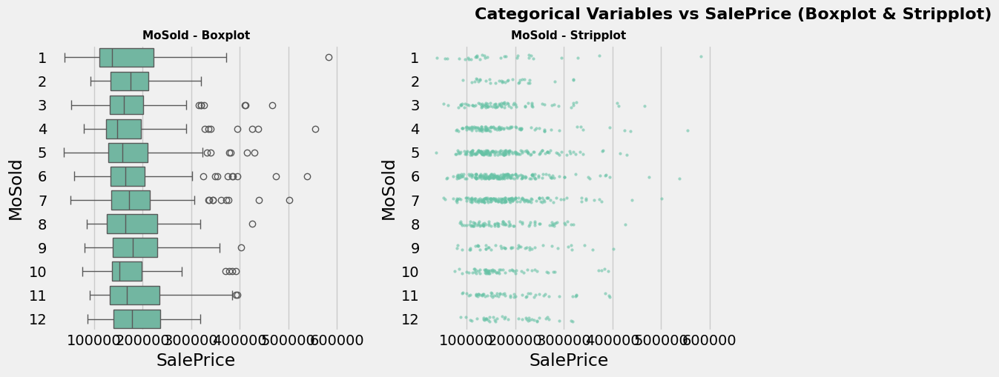

In [ ]:
plot_two_by_four(train_cleaned, ['MoSold'])

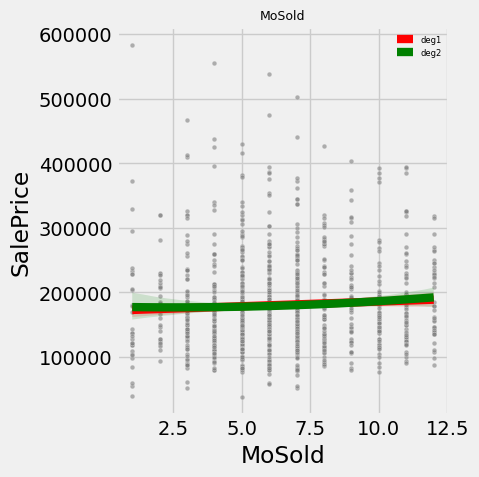

In [ ]:
plot_linear_vs_quad(train_cleaned, train_cleaned['SalePrice'], ['MoSold'])

In [ ]:
def get_MoSold_cols():

    season_map = {
        'SpringSold': [1, 2, 3],
        'SummerSold': [4, 5, 6],
        'AutumnSold': [7, 8, 9],
        'WinterSold': [10, 11, 12],
    }


    cols_to_drop=[]
    for new_col, months in season_map.items():

        cols = [f'MoSold_{m}' for m in months]

        cols_to_drop.extend(cols)


    return cols_to_drop

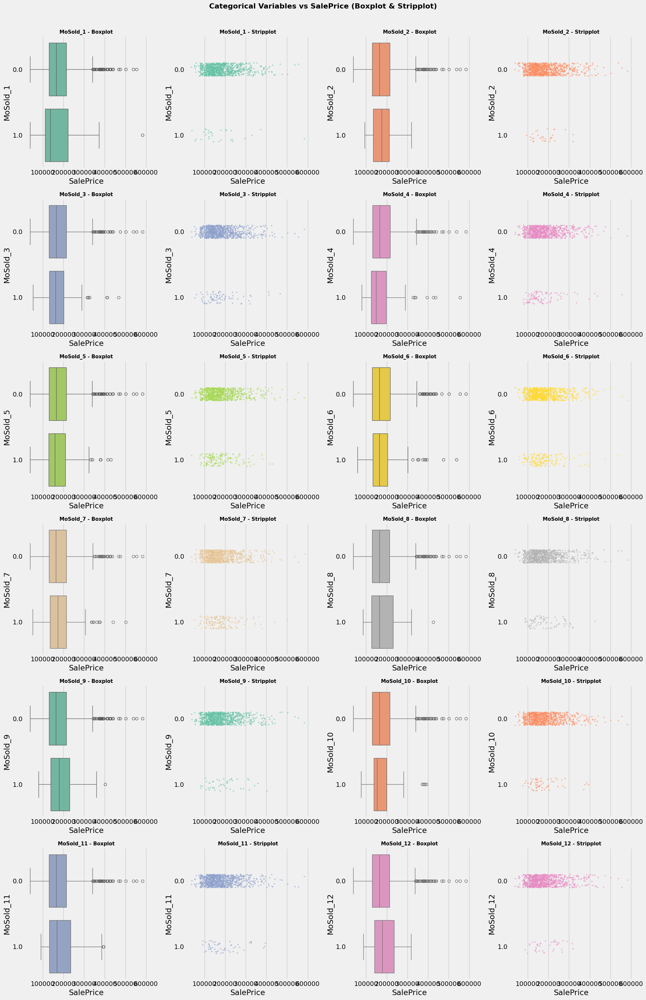

In [ ]:
t = train_cleaned_.copy()
t['SalePrice'] = train_cleaned['SalePrice']
plot_two_by_four(t, get_MoSold_cols())
t.drop(columns=['SalePrice'], inplace=True)

Basically we can see the columns MoSold does not have sigificant effect in target variables, so it is better to drop it first.

In [ ]:
train_cleaned_.drop(columns=get_MoSold_cols(), inplace=True)
train_cleaned.drop(columns='MoSold', inplace=True)
test.drop(columns='MoSold', inplace=True)

In [ ]:
one_hot_categorical_variables.remove('MoSold')

# TotalPorchDeckSF

In [ ]:
outdoor_cols = {"WoodDeckSF", "OpenPorchSF", "ScreenPorch", "3SsnPorch", "EnclosedPorch"}

Here, for the WoodDeckSF and OpenPorchSF, it is needed to get the original (non-transformed) scale

In [ ]:
t = train_cleaned_.copy()
t[['WoodDeckSF', 'OpenPorchSF']] = np.expm1(t[['WoodDeckSF', 'OpenPorchSF']] )

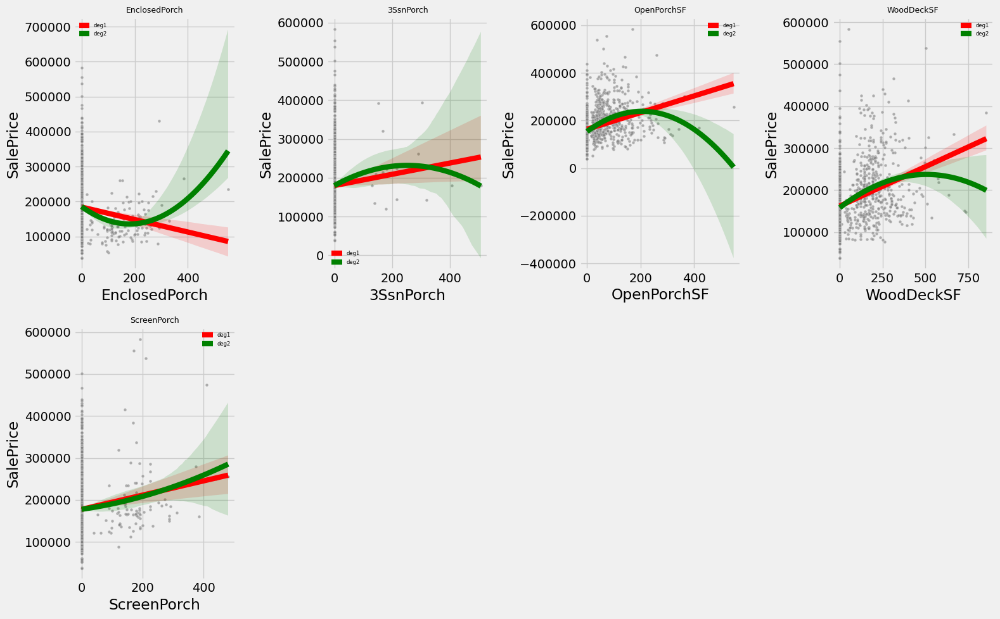

In [ ]:
plot_linear_vs_quad(t, train_cleaned['SalePrice'], list(outdoor_cols))

In [ ]:
t["TotalPorchDeckSF"] = t[list(outdoor_cols)].sum(axis=1)

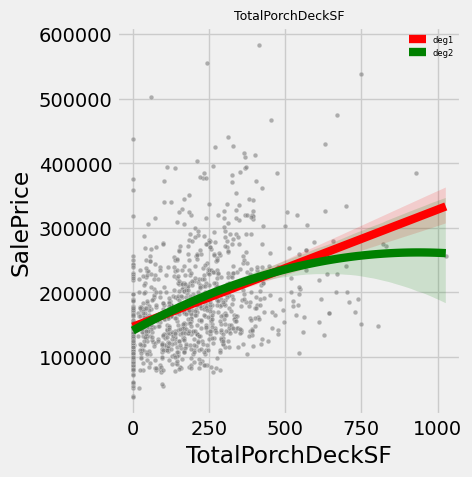

In [ ]:
plot_linear_vs_quad(t, train_cleaned['SalePrice'], ['TotalPorchDeckSF'])

In [ ]:
t['SalePrice'] = train_cleaned['SalePrice']
t[t["TotalPorchDeckSF"] < 400]['SalePrice'].median()

160000.0

In [ ]:
print(t[t["TotalPorchDeckSF"] >= 400]['SalePrice'].median())
t.drop(columns='SalePrice', inplace=True)

203400.0


In [ ]:
def add_TotalPorchDeckSF_features(df):
  df = df.copy()
  outdoor_cols = {"WoodDeckSF", "OpenPorchSF", "ScreenPorch", "3SsnPorch", "EnclosedPorch"}
  if outdoor_cols.issubset(df.columns):
    df[['WoodDeckSF', 'OpenPorchSF']] = np.expm1(df[['WoodDeckSF', 'OpenPorchSF']])
    df["TotalPorchDeckSF"] = df[list(outdoor_cols)].sum(axis=1)
    df[['WoodDeckSF', 'OpenPorchSF']] = np.log1p(df[['WoodDeckSF', 'OpenPorchSF']])

  return df

In [ ]:
train_cleaned_ = add_TotalPorchDeckSF_features(train_cleaned_)

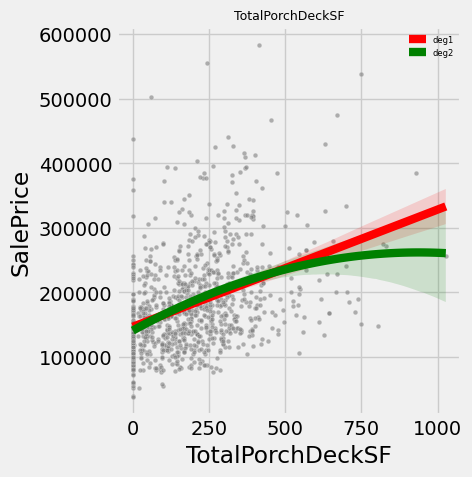

In [ ]:
plot_linear_vs_quad(train_cleaned_, train_cleaned['SalePrice'], ['TotalPorchDeckSF'])

# Luxury Features

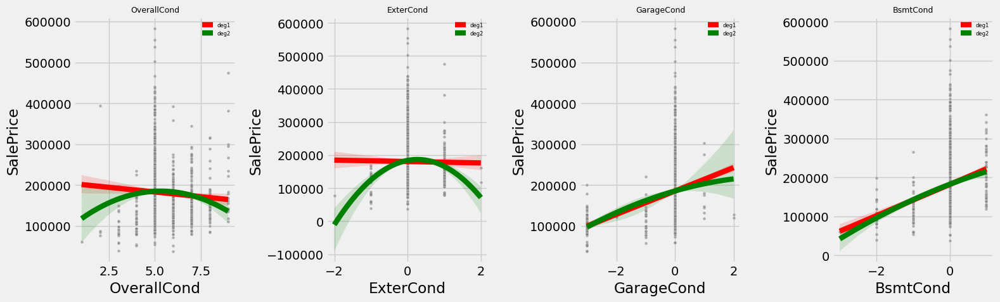

In [ ]:
plot_linear_vs_quad(train_cleaned_, train_cleaned['SalePrice'], ['OverallCond','ExterCond','GarageCond','BsmtCond'])

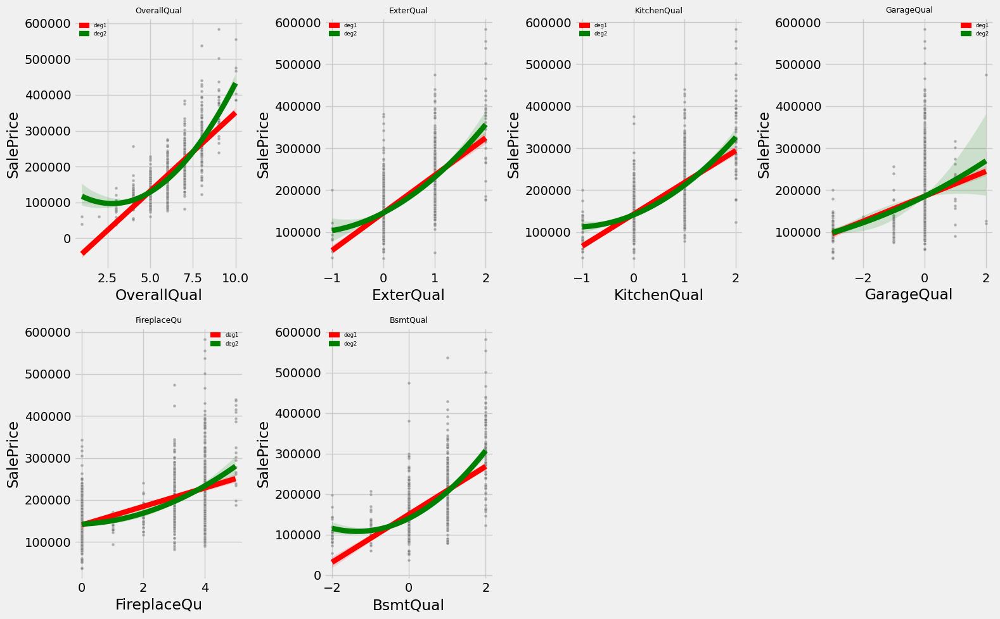

In [ ]:
plot_linear_vs_quad(train_cleaned_, train_cleaned['SalePrice'], ['OverallQual', 'ExterQual','KitchenQual','GarageQual','FireplaceQu','BsmtQual'])

In [ ]:
def add_luxury_features(df):
    # size related
    df['Luxury_BigHouse']  = (df['GrLivArea']   >= 3000).astype(int)
    df['Luxury_BigBsmt']   = (df['TotalBsmtSF'] >= 1500).astype(int)
    df['Luxury_Garage3up'] = (df['GarageCars']  >= 3   ).astype(int)

    # quality related
    df['Luxury_HighQual'] = (
        (df['OverallQual'] >= 8) &
        (df['ExterQual']) >= 1).astype(int)
    df['Luxury_Kitchen']  = (df['KitchenQual'] >= 1 ).astype(int)
    df['Luxury_Exterior'] = df[['Exterior1st_VinylSd', 'Exterior1st_CemntBd']].max(axis=1)

    # outdoor / amenity related
    df['Luxury_Pool'] = (df['PoolArea'] > 0).astype(int)

    df['Luxury_LargePorch'] = (df['TotalPorchDeckSF'] >= 400).astype(int)

    def add_luxury_score(df):
      df = df.copy()

      def mm(s):
          s = s.astype(float)
          rng = s.max() - s.min()
          return ((s - s.min()) / (1+rng))
      def pct(s):
          return s.rank(pct=True)

      # quality block (0~1)
      qu_f = ['OverallQual', 'ExterQual','KitchenQual','GarageQual','FireplaceQu','BsmtQual']
      qual_score = (df[qu_f]/10).mean(axis=1)

      # condition block (0~1)
      cond_f = ['OverallCond','ExterCond','GarageCond','BsmtCond']
      cond_score = (df[cond_f]/10).mean(axis=1)

      # size block (0~1)
      size_parts = []
      size_f = ['GrLivArea','TotalBsmtSF','GarageArea','MasVnrArea']
      for c in size_f:
          size_parts.append(pct(df[c]))
      size_score = pd.concat(size_parts, axis=1).mean(axis=1)

      # weighted composite
      LuxuryScore = (0.7*qual_score +
                    0.1*cond_score +
                    0.2*size_score)

      df['LuxuryScore']   = LuxuryScore
      LuxuryScore = LuxuryScore - LuxuryScore.mean()
      df['LuxuryScore^2'] = LuxuryScore**2 # center the LuxuryScore avoid the collinearity issue

      return df

    df = add_luxury_score(df)

    return df

In [ ]:
train_cleaned_ = add_luxury_features(train_cleaned_)

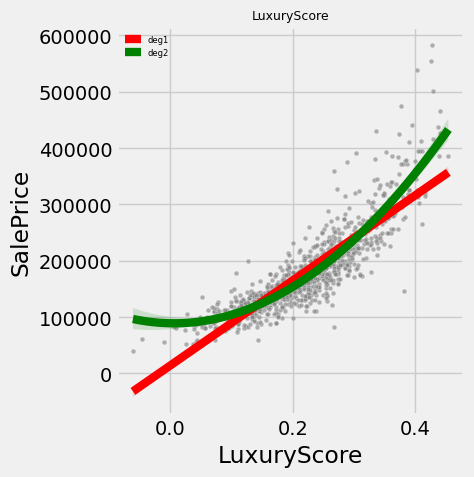

0.870555505004583 0.3134708417663281


In [ ]:
train_cleaned_['SalePrice'] = train_cleaned['SalePrice']
plot_linear_vs_quad(train_cleaned_, train_cleaned_['SalePrice'], ['LuxuryScore'], second_order=True)
print(train_cleaned_['LuxuryScore'].corr(train_cleaned_['SalePrice']), train_cleaned_['LuxuryScore^2'].corr(train_cleaned_['SalePrice']))
train_cleaned_.drop(columns='SalePrice', inplace=True)

# Age Features

Since YearBuilt in the training set only covers 2006–2010 and has limited information, this field is going to be deleted and then converted into a  feature called “Age”. In actual prediction scenarios, the age of a house (and the "Years since last renovation") is more valuable than the specific year of construction (or renovation).

In [ ]:
train_cleaned_['House_Age'] = train_cleaned_['YrSold'] - train_cleaned_['YearBuilt']
train_cleaned_['House_Age_RemodAdd'] = train_cleaned_['YrSold'] - train_cleaned_['YearRemodAdd']

Also add the GarageAge, as some GarageYrBlt is 0 (no Garage), so we need to map them to 0

In [ ]:
train_cleaned_['Garage_Age'] = train_cleaned_['YrSold'] - train_cleaned_['GarageYrBlt']
train_cleaned_.loc[train_cleaned_['GarageYrBlt']==0, 'Garage_Age'] = 0
train_cleaned_['Garage_Age']

,Garage_Age
135,38.0
1452,1.0
762,1.0
932,1.0
435,13.0
...,...
1095,1.0
1130,28.0
1294,49.0
860,82.0


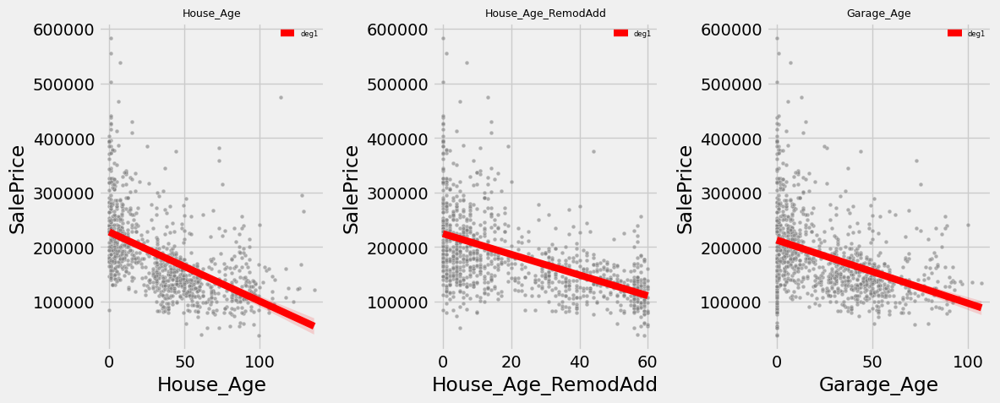

In [ ]:
plot_linear_vs_quad(train_cleaned_, train_cleaned['SalePrice'], ['House_Age', 'House_Age_RemodAdd', 'Garage_Age'], second_order=False)

In [ ]:
def add_Age(df):
  df = df.copy()

  if {'YrSold', 'YearBuilt', 'GarageYrBlt'}.issubset(df.columns):
    df['House_Age'] = df['YrSold'] - df['YearBuilt']
    df['House_Age_RemodAdd'] = df['YrSold'] - df['YearRemodAdd']

    df['Garage_Age'] = df['YrSold'] - df['GarageYrBlt']
    df.loc[df['GarageYrBlt']==0, 'Garage_Age'] = 0

  return df

We have GarageType_NA to aviod confusing 'no Garage' with "Garage age 0"

# Bath Features

In [ ]:
def add_Bath(df):
  df = df.copy()
  df['AboveGradeBaths'] = df['FullBath'] + 0.5 * df['HalfBath']
  df['BathsPer1000GrLiv'] = df['AboveGradeBaths'] / (df['GrLivArea'] / 1000.0)

  df['BsmtBaths'] = df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']

  return df

In [ ]:
train_cleaned_ = add_Bath(train_cleaned_)

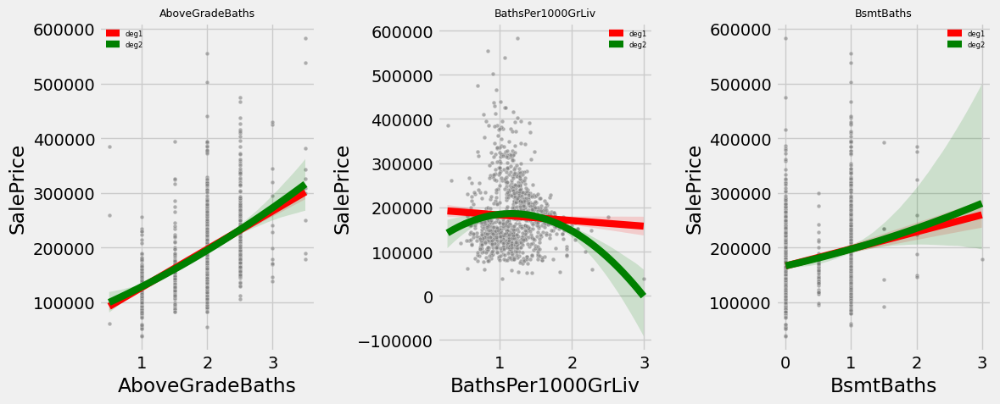

In [ ]:
plot_linear_vs_quad(train_cleaned_, train_cleaned['SalePrice'], ['AboveGradeBaths', 'BathsPer1000GrLiv', 'BsmtBaths', ], second_order=True)

In [ ]:
X_train, y_train= train_cleaned.drop(columns='SalePrice'), train_cleaned['SalePrice']

In [ ]:
X_test, y_test = test.drop(columns='SalePrice'), test['SalePrice']

In [ ]:
kf=KFold(n_splits=5, shuffle=True, random_state=0)

# Drop the zero or near-zero variance one-hot encoded columns.

In [ ]:
class CustomVarianceFilter(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.0, only_one_hot=True):
        self.threshold = threshold
        self.only_one_hot = only_one_hot

    def fit(self, X, y=None):
        X = X.copy()
        X.columns = [s.split('__')[-1] for s in X.columns.to_list()]

        if self.only_one_hot:
            self.one_hot_cols_ = X.columns[X.nunique() == 2]
            self.non_one_hot_cols_ = X.columns.difference(self.one_hot_cols_, sort=False)
            self.vt_ = VarianceThreshold(self.threshold).fit(X[self.one_hot_cols_])
            self.keep_mask_ = self.vt_.get_support()
            self.kept_one_hot_cols_ = self.one_hot_cols_[self.keep_mask_]

            self.out_cols_ = list(self.non_one_hot_cols_) + list(self.kept_one_hot_cols_)
        else:
            self.vt_ = VarianceThreshold(self.threshold).fit(X.to_numpy())
            self.keep_mask_ = self.vt_.get_support()
            self.out_cols_ = list(X.columns[self.keep_mask_])
        return self

    def transform(self, X):
        X = X.copy()
        X.columns = [s.split('__')[-1] for s in X.columns.to_list()]

        if self.only_one_hot:
            oh = X.loc[:, self.one_hot_cols_]
            rest = X.drop(columns=self.one_hot_cols_)
            oh = oh.loc[:, self.kept_one_hot_cols_]
            out = pd.concat([rest, oh], axis=1)
            return out.loc[:, self.out_cols_]
        else:
            return X.loc[:, self.out_cols_]

    def get_feature_names_out(self, input_features=None):
        return np.asarray(self.out_cols_, dtype=object)

In [ ]:
c = CustomVarianceFilter(1e-3)
train_cleaned_ = c.fit_transform(train_cleaned_)
train_cleaned_

,ExterQual,ExterCond,HeatingQC,KitchenQual,FireplaceQu,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,...,Has_EnclosedPorch,Has_ScreenPorch,Luxury_BigHouse,Luxury_BigBsmt,Luxury_Garage3up,Luxury_HighQual,Luxury_Kitchen,Luxury_Exterior,Luxury_Pool,Luxury_LargePorch
135,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0,0,0,0.0,0,0
1452,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,5.0,0.0,...,0.0,0.0,0,0,0,0,0,1.0,0,0
762,0.0,0.0,2.0,1.0,0.0,1.0,0.0,1.0,5.0,0.0,...,0.0,0.0,0,0,0,0,1,1.0,0,0
932,2.0,0.0,2.0,2.0,4.0,2.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0,1,1,1,1,1.0,0,0
435,1.0,0.0,2.0,1.0,3.0,1.0,0.0,2.0,5.0,4.0,...,0.0,0.0,0,0,0,0,1,1.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,1.0,0.0,1.0,1.0,4.0,1.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0,0,0,0,1,1.0,0,0
1130,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0,0,0,0,1,0.0,0,1
1294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0,0,0,0,0,0.0,0,0
860,1.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0,0,1,0.0,0,0


# Check the collinearity features.

In [ ]:
def pair_corr_features(corr_martix, pair_corr_threshold=0.8 ):
  c = corr_martix.drop(columns='SalePrice')
  pair_corr_df = (c.abs().where(np.triu(np.ones(c.abs().shape), k=1)
                    .astype(np.bool))
                    .stack()
                    .sort_values(ascending=False)).reset_index().rename(columns={'level_0':'v1', 'level_1':'v2', 0:'pair_corr'})


  pair_corr_df

  def fill_target_corr(row):
    row['v1_y_corr'] = corr_martix['SalePrice'][row['v1']]
    row['v2_y_corr'] = corr_martix['SalePrice'][row['v2']]
    return row

  pair_corr_df = pair_corr_df.apply(fill_target_corr, axis=1)
  # display(pair_corr_df)
  pair_corr_df_larger_threshold = pair_corr_df[abs(pair_corr_df['pair_corr'])>pair_corr_threshold]

  def fill_drop(row):
    if abs(row['v1_y_corr']) > abs(row['v2_y_corr']):
      row['drop'] = row['v2']
    else:
      row['drop'] = row['v1']
    return row

  pair_corr_df_larger_threshold = pair_corr_df_larger_threshold.apply(fill_drop, axis=1)

  drop_features = pair_corr_df_larger_threshold['drop'].unique().tolist()

  return pair_corr_df, pair_corr_df_larger_threshold, drop_features


In [ ]:
def check_pair(transformed_X_train, y_train, check=True, threshold=0.8):
  transformed_X_train_plus_target = transformed_X_train.copy()
  transformed_X_train_plus_target['SalePrice'] = y_train
  d, dt, f = pair_corr_features(transformed_X_train_plus_target.corr(), threshold)
  if check:
    display(dt)
  return d, dt, f

In [ ]:
_, _, _ = check_pair(train_cleaned_, y_train, threshold=0.8)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,BldgType_Duplex,MSSubClass_90,1.000000,-0.125094,-0.125094,BldgType_Duplex
1,CentralAir_N,CentralAir_Y,1.000000,-0.272688,0.272688,CentralAir_Y
2,Street_Grvl,Street_Pave,1.000000,-0.016364,0.016364,Street_Pave
3,YearBuilt,House_Age,0.999067,0.524427,-0.523963,House_Age
4,GarageYrBlt,GarageType_NA,0.998502,0.273312,-0.247903,GarageType_NA
5,YearRemodAdd,House_Age_RemodAdd,0.997952,0.527631,-0.527702,YearRemodAdd
6,SaleType_New,SaleCondition_Partial,0.993350,0.370036,0.370634,SaleType_New
7,WoodDeckSF,Has_WoodDeckSF,0.988153,0.344167,0.324151,Has_WoodDeckSF
8,PoolArea,Luxury_Pool,0.984490,0.054586,0.053430,Luxury_Pool
9,BldgType_2fmCon,MSSubClass_190,0.978450,-0.113135,-0.107728,MSSubClass_190


# Handling Collinearity Features

We can see many encoded features are similar and collinearity, we can merge them instead of dropping one of them. (Further features engineering)

In [ ]:
transformed_non_standardlize_X_train = train_cleaned_.copy()

In [ ]:
transformed_non_standardlize_X_train

,ExterQual,ExterCond,HeatingQC,KitchenQual,FireplaceQu,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,...,Has_EnclosedPorch,Has_ScreenPorch,Luxury_BigHouse,Luxury_BigBsmt,Luxury_Garage3up,Luxury_HighQual,Luxury_Kitchen,Luxury_Exterior,Luxury_Pool,Luxury_LargePorch
135,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0,0,0,0.0,0,0
1452,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,5.0,0.0,...,0.0,0.0,0,0,0,0,0,1.0,0,0
762,0.0,0.0,2.0,1.0,0.0,1.0,0.0,1.0,5.0,0.0,...,0.0,0.0,0,0,0,0,1,1.0,0,0
932,2.0,0.0,2.0,2.0,4.0,2.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0,1,1,1,1,1.0,0,0
435,1.0,0.0,2.0,1.0,3.0,1.0,0.0,2.0,5.0,4.0,...,0.0,0.0,0,0,0,0,1,1.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,1.0,0.0,1.0,1.0,4.0,1.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0,0,0,0,1,1.0,0,0
1130,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0,0,0,0,1,0.0,0,1
1294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0,0,0,0,0,0.0,0,0
860,1.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0,0,0,0,1,0.0,0,0


# Exterior features

In [ ]:
display(data[data.columns[data.columns.str.startswith('Exterior')]]['Exterior1st'].unique())
display(data[data.columns[data.columns.str.startswith('Exterior')]]['Exterior2nd'].unique())

def combine_Exterior(X):
    X_ = X.copy()
    # fix typos
    rename_map = {
        'Exterior2nd_Brk Cmn':'Exterior2nd_BrkComn',
        'Exterior2nd_Wd Shng':'Exterior2nd_WdShing',
        'Exterior2nd_CmentBd':'Exterior2nd_CemntBd',
        'Exterior1st_BrkComm':'Exterior1st_BrkComn'
    }
    X_.rename(columns={k:v for k,v in rename_map.items() if k in X_.columns}, inplace=True)

    e1 = [c.split('_',1)[1] for c in X_.columns if c.startswith('Exterior1st_')]
    e2 = [c.split('_',1)[1] for c in X_.columns if c.startswith('Exterior2nd_')]
    mats = set(e1).union(e2)
    # backfill missing dummy columns
    miss1 = ['Exterior1st_'+m for m in mats if 'Exterior1st_'+m not in X_.columns]
    miss2 = ['Exterior2nd_'+m for m in mats if 'Exterior2nd_'+m not in X_.columns]
    for cols in (miss1, miss2):
        if cols: X_[cols] = 0
    for m in mats:
        X_[f'Exterior_contains_{m}'] = X_[[f'Exterior1st_{m}', f'Exterior2nd_{m}']].max(axis=1)
        X_.drop(columns=[f'Exterior1st_{m}', f'Exterior2nd_{m}'], inplace=True, errors='ignore')
    return X_

transformed_non_standardlize_X_train = combine_Exterior(transformed_non_standardlize_X_train)
transformed_non_standardlize_X_train

array(['VinylSd', 'MetalSd', 'Wd Sdng', 'HdBoard', 'BrkFace', 'WdShing',
       'CemntBd', 'Plywood', 'AsbShng', 'Stucco', 'BrkComm', 'AsphShn',
       'Stone', 'ImStucc', 'CBlock'], dtype=object)

array(['VinylSd', 'MetalSd', 'Wd Shng', 'HdBoard', 'Plywood', 'Wd Sdng',
       'CmentBd', 'BrkFace', 'Stucco', 'AsbShng', 'Brk Cmn', 'ImStucc',
       'AsphShn', 'Stone', 'Other', 'CBlock'], dtype=object)

,ExterQual,ExterCond,HeatingQC,KitchenQual,FireplaceQu,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,...,Exterior_contains_Wd Sdng,Exterior_contains_MetalSd,Exterior_contains_Plywood,Exterior_contains_Stucco,Exterior_contains_Stone,Exterior_contains_BrkFace,Exterior_contains_AsbShng,Exterior_contains_VinylSd,Exterior_contains_AsphShn,Exterior_contains_WdShing
135,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1452,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
762,0.0,0.0,2.0,1.0,0.0,1.0,0.0,1.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
932,2.0,0.0,2.0,2.0,4.0,2.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
435,1.0,0.0,2.0,1.0,3.0,1.0,0.0,2.0,5.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,1.0,0.0,1.0,1.0,4.0,1.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1130,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,3.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
860,1.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Some one-hot encoded features have vary similar meaning so they have high correlation with each other, so we can also combine them.

In [ ]:
# max

merge_map = pd.DataFrame([
    ('BldgType_Duplex', 'MSSubClass_90', 'BldgType_Duplex_or_MSSubClass_90'),
    ('SaleType_New', 'SaleCondition_Partial', 'Sale_is_New'),
    ('BldgType_2fmCon', 'MSSubClass_190', 'BldgType_2fmCon_or_MSSub190'),
    ('MSSubClass_50', 'HouseStyle_1.5Fin', 'MSSubClass_50_or_HouseStyle_1.5Fin'),
    ('HouseStyle_1.5Unf',	'MSSubClass_45', 'HouseStyle_1.5Unf_or_MSSubClass_45'),
    ('MSSubClass_80', 'HouseStyle_SLvl', 'MSSub80_or_HouseStyle_SLvl'),
    ('Neighborhood_Somerst', 'MSZoning_FV', 'Neighborhood_Somerset_or_MSZoning_FV'),
    ('HouseStyle_2Story',	'2ndFlrSF', '2ndFlrSF_'),
    ('MSSubClass_20', 'HouseStyle_1Story', 'MSSubClass_20_or_HouseStyle_1Story'),
    ('MSSubClass_120', 'BldgType_TwnhsE', 'MSSubClass_120_or_BldgType_TwnhsE'),
    ('MSSubClass_85',	'HouseStyle_SFoyer', 'MSSubClass_85_or_HouseStyle_SFoyer')
], columns=['v1', 'v2', 'new'])


def combine_pairs(df, mapping, ):

    df = df.copy()
    for _, row in mapping.iterrows():
        c1, c2, new = row

        if c1 not in df.columns or c2 not in df.columns:
            continue
        df[new] = df[[c1, c2]].max(axis=1)
        df.drop(columns=[c1, c2], inplace=True)
    return df



transformed_non_standardlize_X_train = combine_pairs(transformed_non_standardlize_X_train, merge_map)
# transformed_non_standardlize_X_train = drop_GarageType_NA(transformed_non_standardlize_X_train)


In [ ]:
_, _, _ = check_pair(transformed_non_standardlize_X_train, y_train, threshold=0.75)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,CentralAir_N,CentralAir_Y,1.000000,-0.272688,0.272688,CentralAir_Y
1,Street_Grvl,Street_Pave,1.000000,-0.016364,0.016364,Street_Pave
2,YearBuilt,House_Age,0.999067,0.524427,-0.523963,House_Age
3,GarageYrBlt,GarageType_NA,0.998502,0.273312,-0.247903,GarageType_NA
4,YearRemodAdd,House_Age_RemodAdd,0.997952,0.527631,-0.527702,YearRemodAdd
5,WoodDeckSF,Has_WoodDeckSF,0.988153,0.344167,0.324151,Has_WoodDeckSF
6,PoolArea,Luxury_Pool,0.984490,0.054586,0.053430,Luxury_Pool
7,BsmtFullBath,BsmtBaths,0.972334,0.223852,0.213907,BsmtBaths
8,OpenPorchSF,Has_OpenPorchSF,0.968866,0.428863,0.415464,Has_OpenPorchSF
9,GarageQual,GarageCond,0.956307,0.282043,0.269839,GarageCond


In [ ]:
transformed_non_standardlize_X_train.drop(columns=['CentralAir_N', 'Street_Grvl', 'Has_WoodDeckSF', 'Luxury_Pool', 'BsmtBaths', 'Has_OpenPorchSF', 'GarageCond', 'Has_BsmtBath',
                          'FullBath', 'Exterior_contains_VinylSd', '3SsnPorch', 'Has_2ndFlrSF', 'Has_ScreenPorch', 'Luxury_Kitchen', 'GarageArea', 'EnclosedPorch', 'LowQualFinSF', 'Has_BsmtBath',
                          'MSSubClass_20_or_HouseStyle_1Story', 'Fireplaces', 'BsmtFinType2', 'OverallQual', 'BsmtFinSF2', 'SaleType_WD', 'MiscVal'
                          ], inplace=True)

In [ ]:
_, _, _ = check_pair(transformed_non_standardlize_X_train, y_train, threshold=0.75)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,YearBuilt,House_Age,0.999067,0.524427,-0.523963,House_Age
1,GarageYrBlt,GarageType_NA,0.998502,0.273312,-0.247903,GarageType_NA
2,YearRemodAdd,House_Age_RemodAdd,0.997952,0.527631,-0.527702,YearRemodAdd
3,GarageQual,GarageYrBlt,0.943155,0.282043,0.273312,GarageYrBlt
4,GarageQual,GarageType_NA,0.939214,0.282043,-0.247903,GarageType_NA
5,RoofStyle_Gable,RoofStyle_Hip,0.929122,-0.212145,0.221825,RoofStyle_Gable
6,LotShape_IR1,LotShape_Reg,0.919160,0.193628,-0.245800,LotShape_IR1
7,LandSlope_Gtl,LandSlope_Mod,0.913369,-0.076316,0.057449,LandSlope_Mod
8,RoofStyle_Flat,RoofMatl_Tar&Grv,0.903632,0.020780,0.015281,RoofMatl_Tar&Grv
9,GrLivArea,TotRmsAbvGrd,0.831772,0.709101,0.524688,TotRmsAbvGrd


For the Age features, as we said, in actual prediction scenarios, the age (and the "Years since last renovation") is more valuable than the specific year of construction (or renovation), so it is decided to drop the correspond YearBuilt (YearRemodAdd) and GarageYrBlt.

In [ ]:
transformed_non_standardlize_X_train.drop(columns=['YearBuilt', 'YrSold', 'YearRemodAdd', 'GarageYrBlt'], inplace=True)

Here, for the feature GrLivArea and TotRmsAbvGrd, they are highly correlated because their measurement are high related, which means the living area square feet Above grade (ground) and the total rooms above grade (does not include bathrooms) respectively.

So we can add a new feature Area_per_RmsAbvGrd that calculate the are per room and dropping the TotRmsAbvGrd feature.

In [ ]:
transformed_non_standardlize_X_train['Area_per_RmsAbvGrd'] = transformed_non_standardlize_X_train['GrLivArea'] / (transformed_non_standardlize_X_train['TotRmsAbvGrd'] + transformed_non_standardlize_X_train['BedroomAbvGr'])

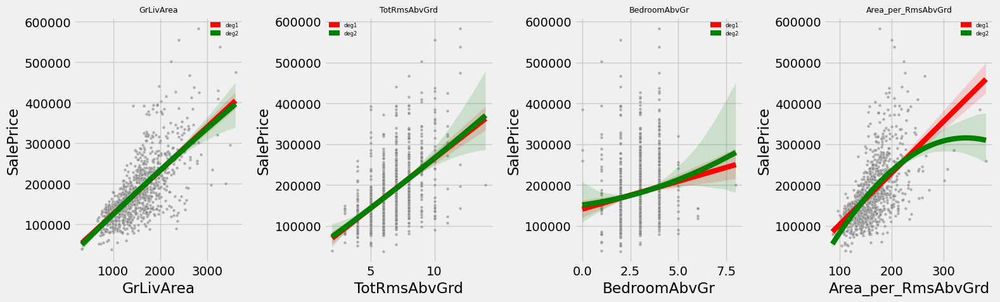

In [ ]:
plot_linear_vs_quad(transformed_non_standardlize_X_train, y_train, ['GrLivArea', 'TotRmsAbvGrd', 'BedroomAbvGr', 'Area_per_RmsAbvGrd', ])

In [ ]:
transformed_non_standardlize_X_train.drop(columns='TotRmsAbvGrd', inplace=True)

In [ ]:
_, _, _ = check_pair(transformed_non_standardlize_X_train, y_train)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,GarageQual,GarageType_NA,0.939214,0.282043,-0.247903,GarageType_NA
1,RoofStyle_Gable,RoofStyle_Hip,0.929122,-0.212145,0.221825,RoofStyle_Gable
2,LotShape_IR1,LotShape_Reg,0.919160,0.193628,-0.245800,LotShape_IR1
3,LandSlope_Gtl,LandSlope_Mod,0.913369,-0.076316,0.057449,LandSlope_Mod
4,RoofStyle_Flat,RoofMatl_Tar&Grv,0.903632,0.020780,0.015281,RoofMatl_Tar&Grv
5,MSZoning_RL,MSZoning_RM,0.823681,0.248604,-0.303317,MSZoning_RL
6,Electrical_FuseA,Electrical_SBrkr,0.821694,-0.178082,0.239443,Electrical_FuseA
7,MasVnrType_BrkFace,MasVnrType_NA,0.807262,0.182280,-0.362386,MasVnrType_BrkFace
8,TotalBsmtSF,1stFlrSF,0.801575,0.639329,0.615603,1stFlrSF


We see the new feature does not have collinearity problem to the original feature GrLivArea.

The noticeable features are TotalBsmtSF	and 1stFlrSF. Before we give to Lasso to select, it is better to add some features that can retain some information.

In [ ]:
t = transformed_non_standardlize_X_train.copy()
t['TotalBsmtSF_exceed_1stFlrSF'] = t['TotalBsmtSF'] - t['1stFlrSF']

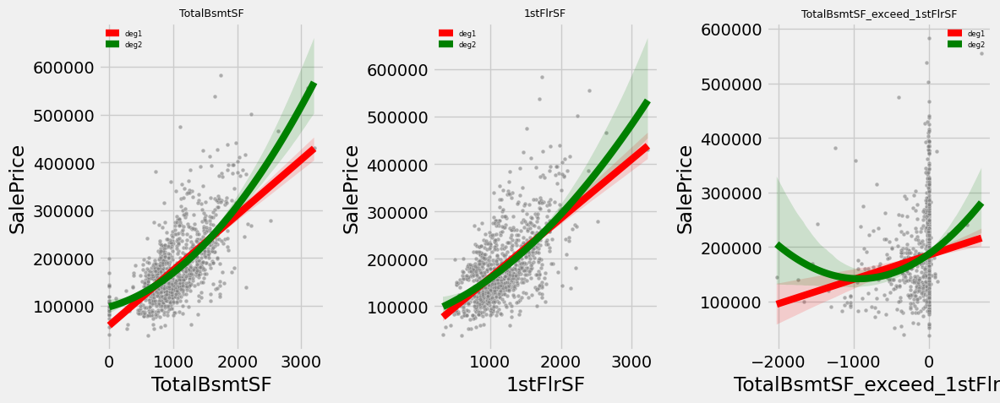

In [ ]:
plot_linear_vs_quad(t, y_train, ['TotalBsmtSF', '1stFlrSF', 'TotalBsmtSF_exceed_1stFlrSF'])

In [ ]:
t['TotalBsmtSF_exceed_1stFlrSF^2'] = (t['TotalBsmtSF_exceed_1stFlrSF'])** 2

In [ ]:
_, _, _ = check_pair(t, y_train, threshold=0.75)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,GarageQual,GarageType_NA,0.939214,0.282043,-0.247903,GarageType_NA
1,RoofStyle_Gable,RoofStyle_Hip,0.929122,-0.212145,0.221825,RoofStyle_Gable
2,LotShape_IR1,LotShape_Reg,0.919160,0.193628,-0.245800,LotShape_IR1
3,LandSlope_Gtl,LandSlope_Mod,0.913369,-0.076316,0.057449,LandSlope_Mod
4,RoofStyle_Flat,RoofMatl_Tar&Grv,0.903632,0.020780,0.015281,RoofMatl_Tar&Grv
5,TotalBsmtSF_exceed_1stFlrSF,TotalBsmtSF_exceed_1stFlrSF^2,0.876494,0.149542,-0.083478,TotalBsmtSF_exceed_1stFlrSF^2
6,MSZoning_RL,MSZoning_RM,0.823681,0.248604,-0.303317,MSZoning_RL
7,Electrical_FuseA,Electrical_SBrkr,0.821694,-0.178082,0.239443,Electrical_FuseA
8,MasVnrType_BrkFace,MasVnrType_NA,0.807262,0.182280,-0.362386,MasVnrType_BrkFace
9,TotalBsmtSF,1stFlrSF,0.801575,0.639329,0.615603,1stFlrSF


In [ ]:
transformed_non_standardlize_X_train['TotalBsmtSF_exceed_1stFlrSF'] = transformed_non_standardlize_X_train['TotalBsmtSF'] - transformed_non_standardlize_X_train['1stFlrSF']
transformed_non_standardlize_X_train['TotalBsmtSF_exceed_1stFlrSF^2'] = (transformed_non_standardlize_X_train['TotalBsmtSF_exceed_1stFlrSF'])** 2
transformed_non_standardlize_X_train.drop(columns='1stFlrSF', inplace=True)

In [ ]:
# transformed_non_standardlize_X_train = add_location_related_features(transformed_non_standardlize_X_train)
_, _, _ = check_pair(transformed_non_standardlize_X_train, y_train, threshold=0.75)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,GarageQual,GarageType_NA,0.939214,0.282043,-0.247903,GarageType_NA
1,RoofStyle_Gable,RoofStyle_Hip,0.929122,-0.212145,0.221825,RoofStyle_Gable
2,LotShape_IR1,LotShape_Reg,0.919160,0.193628,-0.245800,LotShape_IR1
3,LandSlope_Gtl,LandSlope_Mod,0.913369,-0.076316,0.057449,LandSlope_Mod
4,RoofStyle_Flat,RoofMatl_Tar&Grv,0.903632,0.020780,0.015281,RoofMatl_Tar&Grv
5,TotalBsmtSF_exceed_1stFlrSF,TotalBsmtSF_exceed_1stFlrSF^2,0.876494,0.149542,-0.083478,TotalBsmtSF_exceed_1stFlrSF^2
6,MSZoning_RL,MSZoning_RM,0.823681,0.248604,-0.303317,MSZoning_RL
7,Electrical_FuseA,Electrical_SBrkr,0.821694,-0.178082,0.239443,Electrical_FuseA
8,MasVnrType_BrkFace,MasVnrType_NA,0.807262,0.182280,-0.362386,MasVnrType_BrkFace
9,Foundation_CBlock,Foundation_PConc,0.773849,-0.333595,0.489416,Foundation_CBlock


For the remain collinearity features, we can just apply lasso to fit and select the features.

In [ ]:
transformed_non_standardlize_X_train

,ExterQual,ExterCond,HeatingQC,KitchenQual,FireplaceQu,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,Functional,...,MSSubClass_50_or_HouseStyle_1.5Fin,HouseStyle_1.5Unf_or_MSSubClass_45,MSSub80_or_HouseStyle_SLvl,Neighborhood_Somerset_or_MSZoning_FV,2ndFlrSF_,MSSubClass_120_or_BldgType_TwnhsE,MSSubClass_85_or_HouseStyle_SFoyer,Area_per_RmsAbvGrd,TotalBsmtSF_exceed_1stFlrSF,TotalBsmtSF_exceed_1stFlrSF^2
135,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,168.200000,-378.0,142884.0
1452,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,5.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,153.142857,-525.0,275625.0
762,0.0,0.0,2.0,1.0,0.0,1.0,0.0,1.0,5.0,1.0,...,0.0,0.0,0.0,1.0,783.0,0.0,0.0,154.700000,-8.0,64.0
932,2.0,0.0,2.0,2.0,4.0,2.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,173.181818,0.0,0.0
435,1.0,0.0,2.0,1.0,3.0,1.0,0.0,2.0,5.0,1.0,...,0.0,0.0,0.0,0.0,834.0,0.0,0.0,184.555556,-28.0,784.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,1.0,0.0,1.0,1.0,4.0,1.0,0.0,0.0,5.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,146.000000,0.0,0.0
1130,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,3.0,-1.0,...,1.0,0.0,0.0,0.0,653.0,0.0,0.0,180.090909,-206.0,42436.0
1294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,123.428571,0.0,0.0
860,1.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,514.0,0.0,0.0,142.600000,0.0,0.0


Summarize the steps as a function.

In [ ]:
def collinearityFeatureEngineering(df):

    df = df.copy()

    # -------- pairwise max mapping --------
    merge_map = pd.DataFrame([
        ('BldgType_Duplex', 'MSSubClass_90',   'BldgType_Duplex_or_MSSubClass_90'),
        ('SaleType_New',    'SaleCondition_Partial', 'Sale_is_New'),
        ('BldgType_2fmCon', 'MSSubClass_190',  'BldgType_2fmCon_or_MSSub190'),
        ('MSSubClass_50',   'HouseStyle_1.5Fin','MSSubClass_50_or_HouseStyle_1.5Fin'),
        ('HouseStyle_1.5Unf','MSSubClass_45',  'HouseStyle_1.5Unf_or_MSSubClass_45'),
        ('MSSubClass_80',   'HouseStyle_SLvl', 'MSSub80_or_HouseStyle_SLvl'),
        ('Neighborhood_Somerst','MSZoning_FV','Neighborhood_Somerset_or_MSZoning_FV'),
        ('HouseStyle_2Story','2ndFlrSF',       '2ndFlrSF_'),
        ('MSSubClass_20',   'HouseStyle_1Story','MSSubClass_20_or_HouseStyle_1Story'),
        ('MSSubClass_120',  'BldgType_TwnhsE', 'MSSubClass_120_or_BldgType_TwnhsE'),
        ('MSSubClass_85',   'HouseStyle_SFoyer','MSSubClass_85_or_HouseStyle_SFoyer'),
    ], columns=['v1','v2','new'])

    def combine_pairs(X, mapping):
        X = X.copy()
        to_drop = set()
        for _, (c1, c2, new) in mapping.iterrows():
            if c1 in X.columns and c2 in X.columns:
                X[new] = X[[c1, c2]].max(axis=1)
                to_drop.update([c1, c2])
        if to_drop:
            X.drop(columns=list(to_drop), inplace=True)
        return X

    def combine_Exterior(X):
        X_ = X.copy()
        # fix typos
        rename_map = {
            'Exterior2nd_Brk Cmn':'Exterior2nd_BrkComn',
            'Exterior2nd_Wd Shng':'Exterior2nd_WdShing',
            'Exterior2nd_CmentBd':'Exterior2nd_CemntBd',
            'Exterior1st_BrkComm':'Exterior1st_BrkComn'
        }
        X_.rename(columns={k:v for k,v in rename_map.items() if k in X_.columns}, inplace=True)

        e1 = [c.split('_',1)[1] for c in X_.columns if c.startswith('Exterior1st_')]
        e2 = [c.split('_',1)[1] for c in X_.columns if c.startswith('Exterior2nd_')]
        mats = set(e1).union(e2)
        # backfill missing dummy columns
        miss1 = ['Exterior1st_'+m for m in mats if 'Exterior1st_'+m not in X_.columns]
        miss2 = ['Exterior2nd_'+m for m in mats if 'Exterior2nd_'+m not in X_.columns]
        for cols in (miss1, miss2):
            if cols: X_[cols] = 0
        for m in mats:
            X_[f'Exterior_contains_{m}'] = X_[[f'Exterior1st_{m}', f'Exterior2nd_{m}']].max(axis=1)
            X_.drop(columns=[f'Exterior1st_{m}', f'Exterior2nd_{m}'], inplace=True, errors='ignore')
        return X_

    def drop_Neighborhood(df):
        df = df.copy()

        Neighborhood_cols = df.columns[df.columns.str.startswith('Neighborhood')]
        df.drop(columns=Neighborhood_cols, inplace=True)

        return df

    # -------- run transforms --------
    # df = drop_Neighborhood(df)
    df = combine_Exterior(df)
    df = combine_pairs(df, merge_map)

    # simple drops
    for col in ['CentralAir_N', 'Street_Grvl', 'Has_WoodDeckSF', 'Luxury_Pool', 'BsmtBaths', 'Has_OpenPorchSF', 'GarageCond', 'Has_BsmtBath',
            'FullBath', 'Exterior_contains_VinylSd', '3SsnPorch', 'Has_2ndFlrSF', 'Has_ScreenPorch', 'Luxury_Kitchen', 'GarageArea', 'EnclosedPorch', 'LowQualFinSF', 'Has_BsmtBath',
            'MSSubClass_20_or_HouseStyle_1Story', 'Fireplaces', 'BsmtFinType2', 'OverallQual', 'BsmtFinSF2', 'SaleType_WD', 'MiscVal', 'YearBuilt', 'YrSold', 'YearRemodAdd', 'GarageYrBlt']:
        if col in df.columns:
            df.drop(columns=[col], inplace=True)

    # ratios / composites
    if 'GrLivArea' in df.columns and 'TotRmsAbvGrd' in df.columns and 'BedroomAbvGr' in df.columns:
        df['Area_per_RmsAbvGrd'] = df['GrLivArea'] / (df['TotRmsAbvGrd']+ df['BedroomAbvGr'])
        df.drop(columns=['TotRmsAbvGrd'], inplace=True)

    # if {'GarageArea','GarageCars', 'GarageQual'}.issubset(df.columns):
    #     df['GarageArea GarageCars'] = df['GarageArea'] * df['GarageCars']
    #     df['GarageArea_per_GarageCars'] = df['GarageArea']/df['GarageCars']
    #     df.loc[df['GarageCars'] == 0, 'GarageArea_per_GarageCars'] = 0
    #     df['GarageQual GarageArea'] = df['GarageQual'] * df['GarageArea']
    #     df.drop(columns=['GarageArea', 'GarageCars'], inplace=True)

    if {'TotalBsmtSF','1stFlrSF'}.issubset(df.columns):
       df['TotalBsmtSF_exceed_1stFlrSF'] = df['TotalBsmtSF'] - df['1stFlrSF']
       df['TotalBsmtSF_exceed_1stFlrSF^2'] = df['TotalBsmtSF_exceed_1stFlrSF']**2
       df.drop(columns=['1stFlrSF'], inplace=True)

    # def add_location_related_features(df):
    #   df = df.copy()
    #   location_related_features = ['LotFrontage', 'LotArea', 'LotShape', 'LandContour', 'LandSlope', 'LotConfig', 'Street', 'Alley', 'Utilities', 'PavedDrive', 'MSZoning', 'Condition1', 'Condition2']

    #   if 'Loc_Tier' not in df.columns:
    #     return df

    #   center_Loc_Tier = df['Loc_Tier'] - df['Loc_Tier'].mean()
    #   for lrf in location_related_features:
    #     for lrf_ in df.columns[df.columns.str.startswith(f'{lrf}_')]:
    #       center_lrf_ = df[lrf_] - df[lrf_].mean()
    #       df[f'Loc_Tier {lrf_}'] = center_Loc_Tier * center_lrf_

    #   return df

    # df = add_location_related_features(df)

    return df

In [ ]:
collinearityFeatureEngineering(train_cleaned_)

,ExterQual,ExterCond,HeatingQC,KitchenQual,FireplaceQu,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,Functional,...,MSSubClass_50_or_HouseStyle_1.5Fin,HouseStyle_1.5Unf_or_MSSubClass_45,MSSub80_or_HouseStyle_SLvl,Neighborhood_Somerset_or_MSZoning_FV,2ndFlrSF_,MSSubClass_120_or_BldgType_TwnhsE,MSSubClass_85_or_HouseStyle_SFoyer,Area_per_RmsAbvGrd,TotalBsmtSF_exceed_1stFlrSF,TotalBsmtSF_exceed_1stFlrSF^2
135,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,168.200000,-378.0,142884.0
1452,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.0,5.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,153.142857,-525.0,275625.0
762,0.0,0.0,2.0,1.0,0.0,1.0,0.0,1.0,5.0,1.0,...,0.0,0.0,0.0,1.0,783.0,0.0,0.0,154.700000,-8.0,64.0
932,2.0,0.0,2.0,2.0,4.0,2.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,173.181818,0.0,0.0
435,1.0,0.0,2.0,1.0,3.0,1.0,0.0,2.0,5.0,1.0,...,0.0,0.0,0.0,0.0,834.0,0.0,0.0,184.555556,-28.0,784.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,1.0,0.0,1.0,1.0,4.0,1.0,0.0,0.0,5.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,146.000000,0.0,0.0
1130,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,3.0,-1.0,...,1.0,0.0,0.0,0.0,653.0,0.0,0.0,180.090909,-206.0,42436.0
1294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,123.428571,0.0,0.0
860,1.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,514.0,0.0,0.0,142.600000,0.0,0.0


Use the ColumnTransformer and Pipeline to summarize the steps.

In [ ]:
class CustomNumAndOrdScaler(BaseEstimator, TransformerMixin):

    def __init__(self, dataframe=False):
        self.scale = StandardScaler()
        self.dataframe=dataframe

    # ---------- FIT ----------
    def fit(self, X, y=None):
        binary_mask     = X.apply(lambda s: s.nunique() == 2)  # True = one-hot
        self.num_ord_cols    = X.columns[~binary_mask].tolist()
        self.scale.fit(X[self.num_ord_cols])
        return self

    # ---------- TRANSFORM ----
    def transform(self, X, ):
        X = X.copy()
        X_ = self.scale.transform(X[self.num_ord_cols])
        X[self.num_ord_cols] = X_
        self.X = X
        if self.dataframe:
          return X
        return X.values

    def get_feature_names_out(self, input_features=None):
        return np.asarray(self.X.columns, dtype=object)




# Model Training

In [ ]:
from sklearn import set_config
set_config(transform_output="pandas")
ord_pipe = Pipeline([
    ('encode', ord_transformer)
])

one_hot_pipe = Pipeline([
    ('impute', SimpleImputer(strategy='constant', fill_value='NA')),
    ('one-hot',OneHotEncoder(handle_unknown='ignore', drop=None, sparse_output=False))
])

num_pipe = Pipeline([
    ('median_impute', HierarchicalMedianKNNImputer(dataframe=True, drop_key=True, drop_obj=True).set_output(transform="pandas")),
    ('pass', 'passthrough')
])

prep = ColumnTransformer([
    ('ord_encode', ord_pipe, ordinal_categorical_variables),
    ('one-hot_encode', one_hot_pipe, one_hot_categorical_variables),
    ('num_prep', num_pipe, numerical_columns_no_target+['Neighborhood', 'Street'])
], remainder='drop')

model = Pipeline([
    ('prep', prep),
    ('log_tranform', FunctionTransformer(log_transform)),
    ('add_TotalPorchDeckSF_features', FunctionTransformer(add_TotalPorchDeckSF_features)),
    ('add_luxury_features', FunctionTransformer(add_luxury_features)),
    ('add_Age', FunctionTransformer(add_Age)),
    ('add_Bath', FunctionTransformer(add_Bath)),
    ('low_var', CustomVarianceFilter(1e-3,)),
    ('collinearityFeaturesEnigneering', FunctionTransformer(collinearityFeatureEngineering)),
    ('scale', CustomNumAndOrdScaler(dataframe=True)),
    ('model', Lasso(alpha=149.71710484090306, max_iter=10000))
    # ('model', LassoCV(n_alphas=100, n_jobs=-1, cv=kf, random_state=0, max_iter=10000))
    # ('model', Lasso(alpha=19.405182526608304, max_iter=10000))
])


# model.fit(X_train, y_train)
# model.named_steps['model'].alpha_
# x = model.fit_transform(X_train)
# x

In [ ]:
def plot_residuals(model_name, model_y_pred,  y_test, baseline_name='baseline', baseline_model_pred=None, baseline_model_y_test=None):
    # 预测 & 残差
    resid   = y_test - model_y_pred
    std_res = resid / np.std(resid, ddof=1)          # ★ 标准化残差

    # 4 个子图
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    axes = axes.flatten()

    # (0) 残差 vs 预测
    sns.residplot(x=model_y_pred, y=resid, lowess=True, ax=axes[0],
                  scatter_kws={'alpha':.45,'color':'tab:green'},
                  line_kws={'color':'tab:green','lw':2,
                            'label':f'{model_name}'})

    # (1) 标准化残差 vs 预测
    sns.scatterplot(x=model_y_pred, y=std_res, ax=axes[1],
                    color='tab:green', alpha=.45, label=model_name)
    axes[1].axhline(0, ls='--', c='k', lw=.8)
    axes[1].set_yticks([i for i in range(-6, 7, 1)])
    axes[1].set_xlabel('prediction')
    axes[1].set_ylabel('std residual')
    axes[1].set_title('Std-residuals vs prediction')

    # (2) QQ-plot
    (osm, osr), (slope, inter, _) = stats.probplot(resid, fit=True)
    axes[2].scatter(osm, osr, alpha=.4, color='tab:green',
                    label=f'{model_name} resid')
    x_ref = np.linspace(osm.min(), osm.max(), 100)
    axes[2].plot(x_ref, slope*x_ref + inter, color='k', ls='--', lw=1)
    axes[2].set_title('QQ-plot')

    # (3) 预测 vs 真实
    sns.scatterplot(x=model_y_pred, y=y_test, ax=axes[3],
                    color='tab:green', alpha=.5, label=model_name)
    axes[3].set_xlabel('prediction')
    axes[3].set_ylabel('ground truth')

    # baseline（可选）
    if baseline_model_pred is not None:
        resid_b  = y_test - baseline_model_pred
        std_res_b = resid_b / np.std(resid_b, ddof=1)

        sns.residplot(x=baseline_model_pred, y=resid_b, lowess=True, ax=axes[0],
                      scatter_kws={'alpha':.45,'color':'tab:blue'},
                      line_kws={'color':'tab:blue','lw':2,
                                'label':f'{baseline_name}'})

        sns.scatterplot(x=baseline_model_pred, y=std_res_b, ax=axes[1],
                        color='tab:blue', alpha=.45, label=baseline_name)

        (osm_b, osr_b) = stats.probplot(resid_b, fit=False)
        axes[2].scatter(osm_b, osr_b, alpha=.4, color='tab:blue',
                        label=f'{baseline_name} resid')

        sns.scatterplot(x=baseline_model_pred, y=y_test, ax=axes[3],
                        color='tab:blue', alpha=.5, label=baseline_name)

    # (0) 图轴标题补充
    axes[0].set_xlabel('prediction')
    axes[0].set_ylabel('residual')
    axes[0].set_title('Residuals vs prediction')

    # 调整 legend
    for ax in axes:
        h,l = ax.get_legend_handles_labels()
        if h: ax.legend(h, l, frameon=False)

    plt.tight_layout()
    plt.show()

In [ ]:
def model_training(model, model_name, X_train, y_train, cv, baseline_name='baseline', baseline_model_pred=None, baseline_model_y_test=None, plot_coefficients=True, plot_res=True):
  model.fit(X_train, y_train)
  try:
    print('best alpha', model.alpha_)
    print('best l1 ratio', model.l1_ratio_)
  except:
    pass
  print('training score', model.score(X_train, y_train))
  cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2', n_jobs=-1)
  print('cv score (mean, std, scores)', np.mean(cv_scores), np.std(cv_scores), cv_scores)
  if isinstance(model, Pipeline):
    model_coef = model.named_steps['model'].coef_
  else:
    model_coef = model.coef_
  if len(model_coef) != len(X_train.columns):
    selected_features = np.array(model[-2].get_feature_names_out())[model_coef!=0]
  else:
    selected_features = np.array(X_train.columns)[model_coef != 0]
  if plot_coefficients:
    fig, ax = plt.subplots(figsize=(16, 20))
    rank_idx = np.argsort(model_coef[model_coef!= 0])
    ax.barh(selected_features[rank_idx], model_coef[model_coef!= 0][rank_idx])
    ax.set_title(f'{model_name} coefficients')
    plt.show()

  if plot_res:
    cv_pred = cross_val_predict(model, X_train, y_train, cv=kf, n_jobs=-1)
    if baseline_model_pred is not None:
      plot_residuals(model_name, cv_pred, y_train, baseline_model_pred=baseline_model_pred, baseline_model_y_test=baseline_model_y_test)
    else:
      plot_residuals(model_name, cv_pred, y_train)

  return selected_features.tolist(), rank_idx

training score 0.9295369320659603
cv score (mean, std, scores) 0.9109885256979334 0.015711025362789368 [0.89354984 0.9137899  0.93879721 0.89882786 0.90997782]


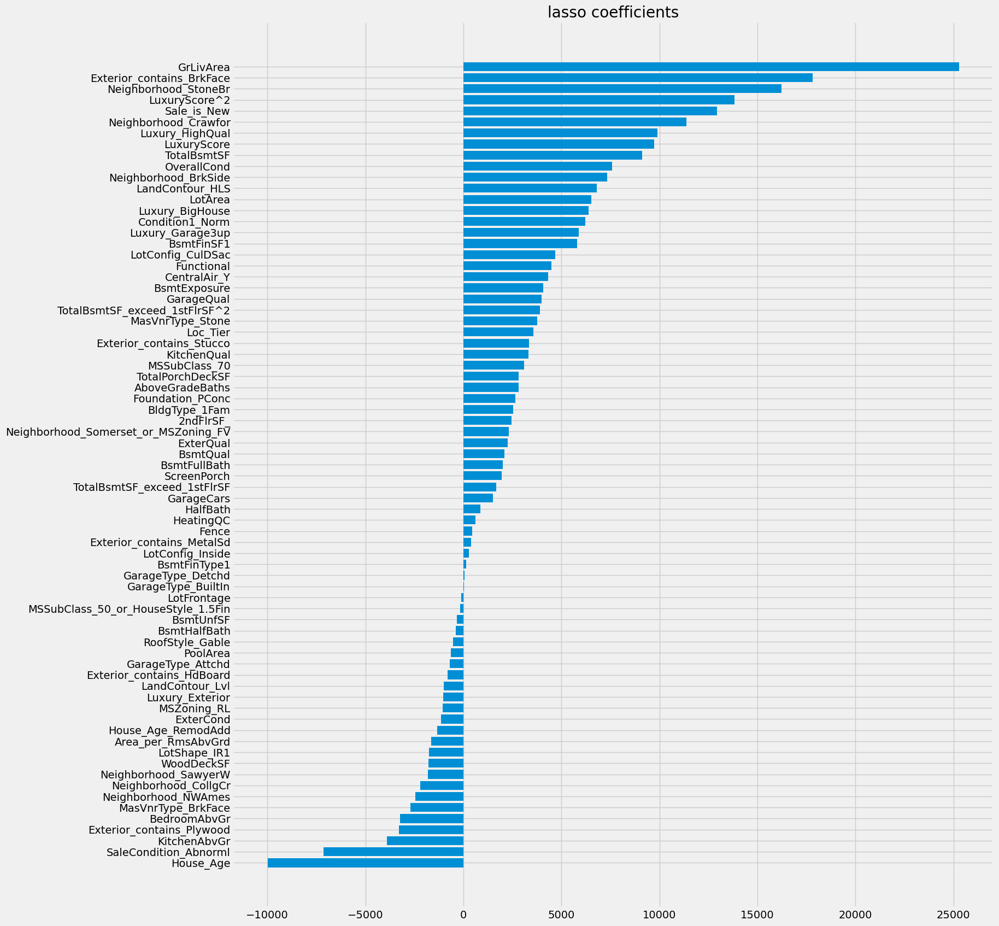

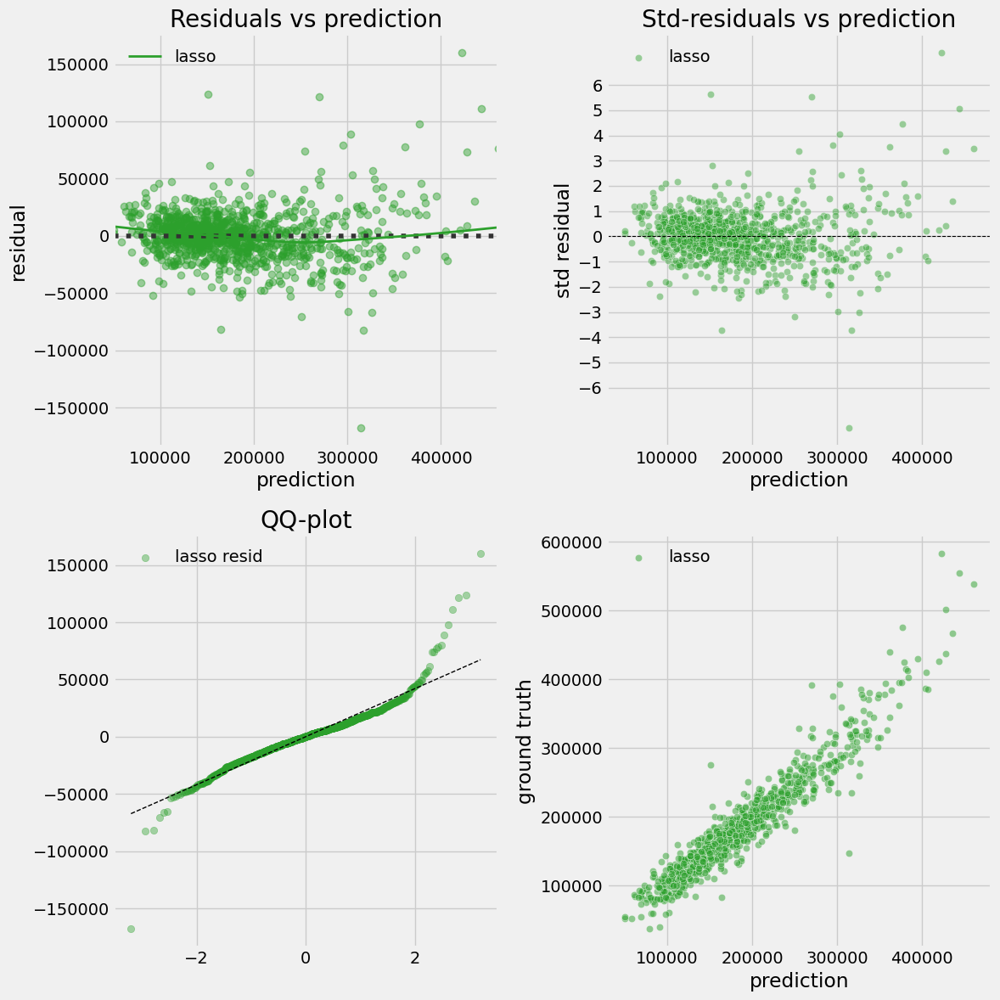

In [ ]:
from sklearn.base import clone
model_ = clone(model)

s, r = model_training(model_, 'lasso', X_train, y_train, cv=kf)

In [ ]:
[s_ for s_ in s if s_.startswith('Garage')]

['GarageQual',
 'GarageCars',
 'GarageType_Attchd',
 'GarageType_BuiltIn',
 'GarageType_Detchd']

In [ ]:
len(s)

73

In [ ]:
[s_ for s_ in s if s_.startswith('Luxury')]

['LuxuryScore',
 'LuxuryScore^2',
 'Luxury_BigHouse',
 'Luxury_Garage3up',
 'Luxury_HighQual',
 'Luxury_Exterior']

We can see there is a Systematic curve in the residuals plot, which means it is needed to make our model more complex. but we can first applying lasso bootstrap to select the important features beforing adding interaction and square term,

Using Pipeline to summarize the steps

In [ ]:
from sklearn.utils import resample
from joblib import Parallel, delayed

class BootLassoSelector(BaseEstimator, TransformerMixin):
    """
    run the bootstrap_lasso，keep the features that its freq > freq_threshold
    """
    def __init__(self, base_lasso=Lasso(alpha=1.0, max_iter=10000),
                 n_bootstraps=200, freq_threshold=0.85, span_threshold=0.8,
                 cd=False, cd_level=-1, cz_given_selected=False, rel_width=False, random_state=0, scale_only_NumOrd=True, scaled=True):
        self.base_lasso      = base_lasso
        self.n_bootstraps    = n_bootstraps
        self.freq_threshold  = freq_threshold
        self.span_threshold = span_threshold
        self.cd = cd
        self.cd_level = cd_level
        self.cz_given_selected = cz_given_selected
        self.rel_width = rel_width
        self.random_state = random_state
        self.scaler = StandardScaler()
        self.scale_only_NumOrd = scale_only_NumOrd
        self.scaled = scaled

    # ---------- FIT ----------
    def fit(self, X, y):
       # scale the num and ord columns
       X = X.copy()

       if self.scale_only_NumOrd:
        binary_mask     = X.apply(lambda s: s.nunique() == 2)  # True = one-hot
        self.num_ord_cols    = X.columns[~binary_mask].tolist()
        X[self.num_ord_cols] = self.scaler.fit_transform(X[self.num_ord_cols])
       else:
        X = pd.DataFrame(data=self.scaler.fit_transform(X), columns=self.scaler.get_feature_names_out(), index=X.index)

       coef, summary = self.bootstrap_lasso(X, y, self.base_lasso, self.n_bootstraps, random_state=self.random_state, cd=self.cd, cd_level=self.cd_level, cz_given_selected=self.cz_given_selected, rel_width=self.rel_width)

       s_need = summary[summary['freq']>=self.freq_threshold]

       if self.cd:
        s_need = s_need[(s_need[f"cross_zero{self.cd_level}"]!=True)]
       if self.rel_width:
        s_need = s_need[(s_need["rel_width"]<=self.span_threshold)]

       self.selected_cols_ = s_need['feature'].values.tolist()

       self.summary = summary
       return self

    # ---------- TRANSFORM ----------
    def transform(self, X):
        X = X.copy()
        if self.scaled:
          if self.scale_only_NumOrd:
            X[self.num_ord_cols] = self.scaler.transform(X[self.num_ord_cols])
          else:
            X = pd.DataFrame(data=self.scaler.transform(X), columns=self.scaler.get_feature_names_out(), index=X.index)

        return X.loc[:, self.selected_cols_] # pandas DataFrame


    def get_feature_names_out(self, input_features=None):
        return self.selected_cols_


    def bootstrap_lasso(self,
                    X, y,
                    base_lasso_model=Lasso(max_iter=10000),
                    n_bootstraps=100,
                    random_state=0,
                    cd=False,
                    cd_level=-1,
                    cz_given_selected = False,
                    rel_width=False,
                    n_jobs=-1,
                    backend='loky',
                    ):

        base_model = clone(base_lasso_model)
        is_pipe    = isinstance(base_model, Pipeline)

        if is_pipe:
            base_model.fit(X, y)
            p = len(base_model[-2].get_feature_names_out())
        else:
            p = X.shape[1]

        rng   = np.random.RandomState(random_state)
        seeds = rng.randint(1e9, size=n_bootstraps)

        def _fit_one(seed):
            """
            Internal function: draw a bootstrap sample → fit → return coefficient vector

            """
            X_b, y_b = resample(X, y, replace=True, random_state=int(seed))
            mdl      = clone(base_model)
            mdl.fit(X_b, y_b)
            if is_pipe:
                return mdl.named_steps["model"].coef_
            return mdl.coef_

        coef_list = Parallel(n_jobs=n_jobs,
                            backend=backend,
                            verbose=0)(
                      delayed(_fit_one)(s) for s in seeds)

        coef_mat = np.vstack(coef_list)

        freq        = (coef_mat != 0).mean(axis=0)
        mean_coef   = coef_mat.mean(axis=0)
        median_coef = np.median(coef_mat, axis=0)
        min_coef    = coef_mat.min(axis=0)
        max_coef    = coef_mat.max(axis=0)

        summary = pd.DataFrame({
            "feature"    : X.columns if isinstance(X, pd.DataFrame) else np.arange(p),
            "freq"       : freq,
            "mean_coef"  : mean_coef,
            "median_coef": median_coef,
            "min_coef"   : min_coef,
            "max_coef"   : max_coef,
        })

        if cd:
            assert cd_level > 0, "when cd=True, cd_level has to > 0"
            if cz_given_selected:
              nz_coef_mat   = coef_mat.copy()
              nz_coef_mat[nz_coef_mat == 0] = np.nan

              lower_cd = np.nanpercentile(nz_coef_mat, (1-cd_level)/2, axis=0)
              upper_cd = np.nanpercentile(nz_coef_mat, (cd_level+(1-cd_level)/2), axis=0)

            else:
              lower_cd = np.percentile(coef_mat, (1 - cd_level) / 2,  axis=0)
              upper_cd = np.percentile(coef_mat, cd_level + (1 - cd_level) / 2, axis=0)

            cross_zero = lower_cd * upper_cd < 0
            summary[f"lower{cd_level}"]     = lower_cd
            summary[f"upper{cd_level}"]     = upper_cd
            summary[f"cross_zero{cd_level}"] = cross_zero
            if rel_width:
              summary["rel_width"] = (summary[f"upper{cd_level}"] - summary[f"lower{cd_level}"]).abs() / summary["mean_coef"].abs()

        summary = summary.sort_values("freq", ascending=False)
        return coef_mat, summary

In [ ]:
lasso_boot_model_ = clone(model_[:-2])
    # ('scale', CustomNumAndOrdScaler(dataframe=True)),
lasso_boot_model_.steps.append(('bootstrap_select', BootLassoSelector(Lasso(alpha=model_.named_steps['model'].alpha, max_iter=10000), n_bootstraps=2000, freq_threshold=0.75, random_state=0, scaled=True,
                                    )))
# lasso_boot_model_.steps.append(('model', LassoCV(n_alphas=100, n_jobs=-1, cv=kf, random_state=0, max_iter=10000)))
# lasso_boot_model_.steps.append(('model', Lasso(alpha=18.097338171194686)))
lasso_boot_model_.steps.append(('model', Lasso(alpha=64.8089606551154)))

# lasso_boot_model_.fit(X_train, y_train)
# lasso_boot_model_.named_steps['model'].alpha_
# transformd_X_train = lasso_boot_model_.fit_transform(X_train, y_train)

training score 0.9280017323625663
cv score (mean, std, scores) 0.9095070871344468 0.015757257998612252 [0.8922244  0.91371417 0.93654375 0.89557572 0.90947739]


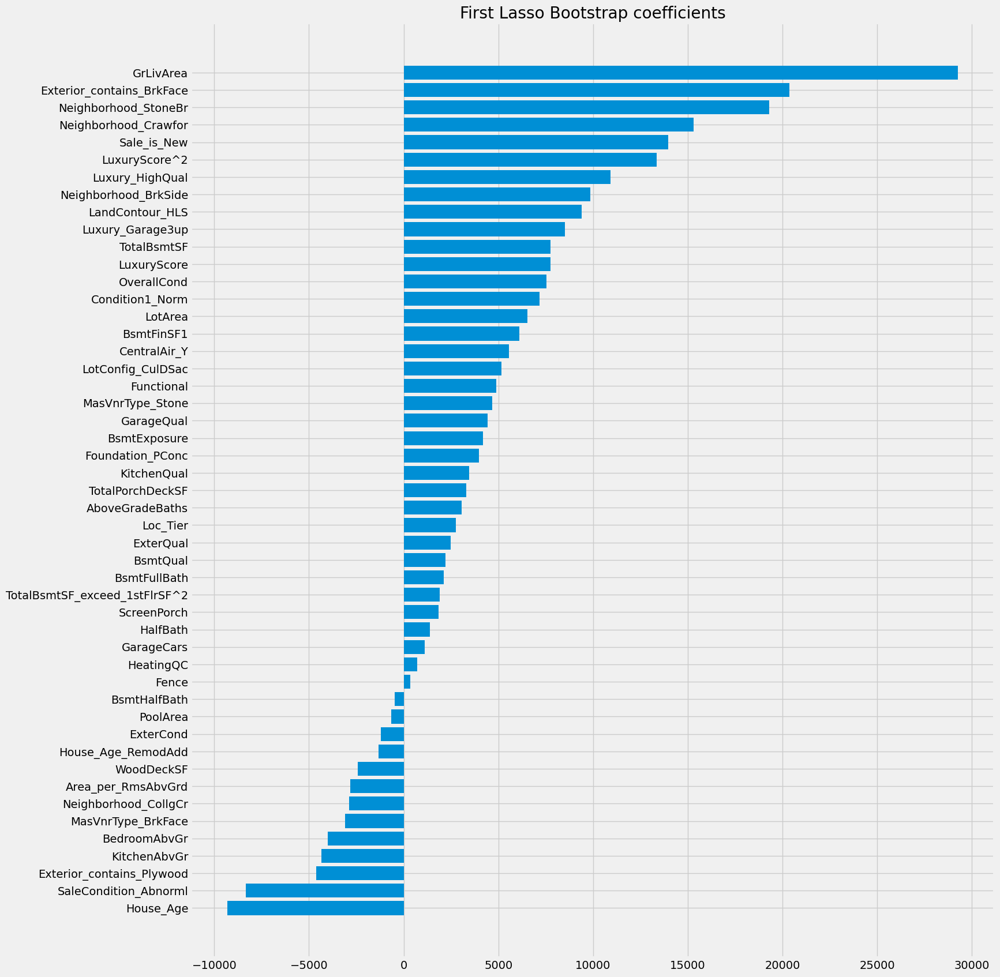

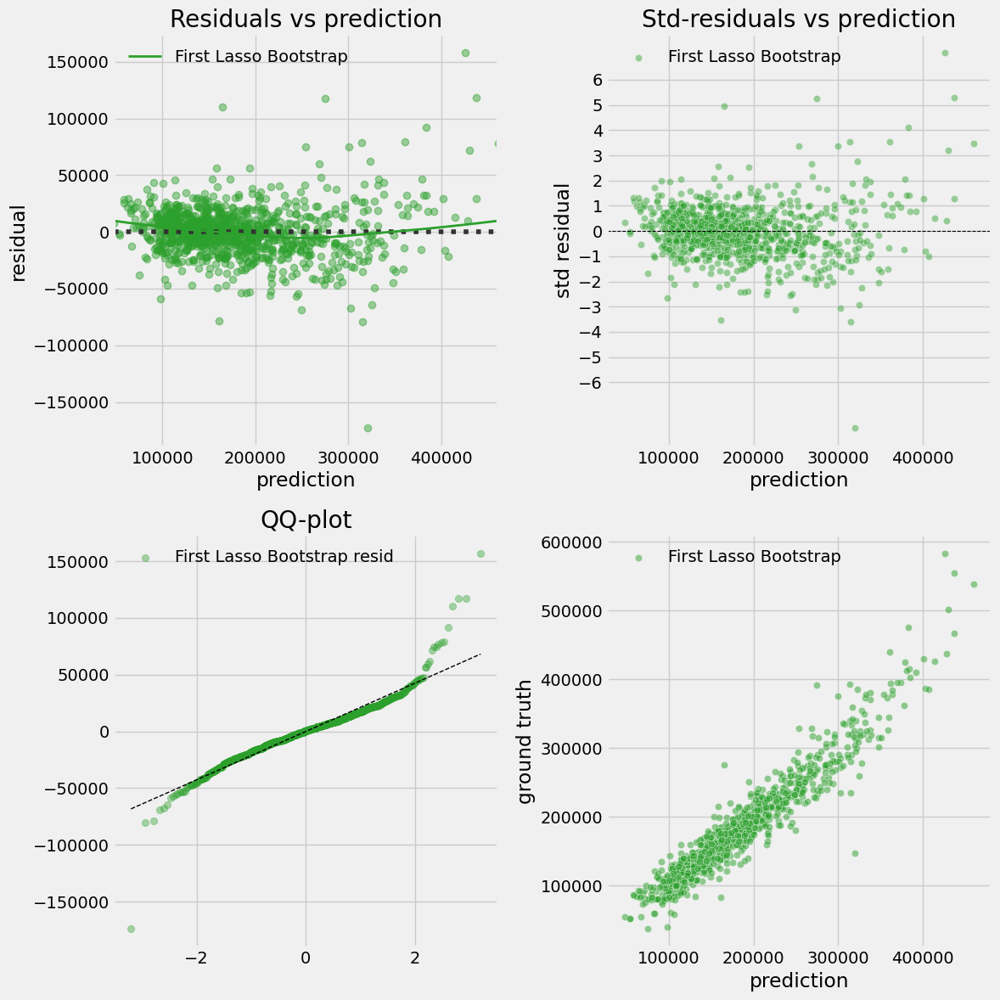

In [ ]:
ls, rs = model_training(lasso_boot_model_, 'First Lasso Bootstrap', X_train, y_train, cv=kf)

In [ ]:
lasso_boot_model_.named_steps['bootstrap_select'].get_feature_names_out(), len(lasso_boot_model_.named_steps['bootstrap_select'].get_feature_names_out())

(['GarageQual',
  'Functional',
  'BsmtExposure',
  'TotalBsmtSF',
  'GrLivArea',
  'LotArea',
  'OverallCond',
  'KitchenAbvGr',
  'House_Age',
  'LuxuryScore^2',
  'Exterior_contains_BrkFace',
  'Sale_is_New',
  'Condition1_Norm',
  'Loc_Tier',
  'KitchenQual',
  'LuxuryScore',
  'Luxury_HighQual',
  'BsmtFinSF1',
  'BsmtFullBath',
  'Neighborhood_BrkSide',
  'TotalPorchDeckSF',
  'SaleCondition_Abnorml',
  'BedroomAbvGr',
  'ScreenPorch',
  'ExterCond',
  'TotalBsmtSF_exceed_1stFlrSF^2',
  'Neighborhood_Crawfor',
  'AboveGradeBaths',
  'WoodDeckSF',
  'ExterQual',
  'Neighborhood_StoneBr',
  'GarageCars',
  'Exterior_contains_Plywood',
  'BsmtQual',
  'Luxury_Garage3up',
  'LotConfig_CulDSac',
  'House_Age_RemodAdd',
  'CentralAir_Y',
  'MasVnrType_BrkFace',
  'PoolArea',
  'Fence',
  'HalfBath',
  'Foundation_PConc',
  'HeatingQC',
  'Neighborhood_CollgCr',
  'BsmtHalfBath',
  'LandContour_HLS',
  'MasVnrType_Stone',
  'Area_per_RmsAbvGrd'],
 49)

In [ ]:
l_ = clone(lasso_boot_model_[:-1])
l_.set_params(bootstrap_select__scaled=False)
transformd_X_train = l_.fit_transform(X_train, y_train)
transformd_X_train

,GarageQual,Functional,BsmtExposure,TotalBsmtSF,GrLivArea,LotArea,OverallCond,KitchenAbvGr,House_Age,LuxuryScore^2,...,PoolArea,Fence,HalfBath,Foundation_PConc,HeatingQC,Neighborhood_CollgCr,BsmtHalfBath,LandContour_HLS,MasVnrType_Stone,Area_per_RmsAbvGrd
135,0.0,1.0,0.0,1304.0,1682.0,9.249657,6.0,1.0,38.0,0.004938,...,0.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,168.200000
1452,0.0,1.0,3.0,547.0,1072.0,8.209580,5.0,1.0,1.0,0.003953,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,153.142857
762,0.0,1.0,1.0,756.0,1547.0,9.064274,5.0,1.0,1.0,0.000103,...,0.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,154.700000
932,0.0,1.0,0.0,1905.0,1905.0,9.364862,5.0,1.0,1.0,0.038179,...,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,173.181818
435,0.0,1.0,2.0,799.0,1661.0,9.275004,6.0,1.0,13.0,0.001673,...,0.0,0.0,1.0,1.0,2.0,1.0,0.0,0.0,0.0,184.555556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.0,1.0,0.0,1314.0,1314.0,9.139703,5.0,1.0,1.0,0.001227,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,146.000000
1130,0.0,-1.0,0.0,1122.0,1981.0,8.962520,3.0,1.0,81.0,0.000036,...,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,180.090909
1294,0.0,1.0,0.0,864.0,864.0,9.008591,7.0,1.0,51.0,0.005434,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,123.428571
860,0.0,1.0,0.0,912.0,1426.0,8.941545,8.0,1.0,89.0,0.000164,...,0.0,4.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,142.600000


Try adding the polynomial term with only the features that selected after lasso bootstrap. First plot the reg plot with one and two order for each numerical and ordinarl features.

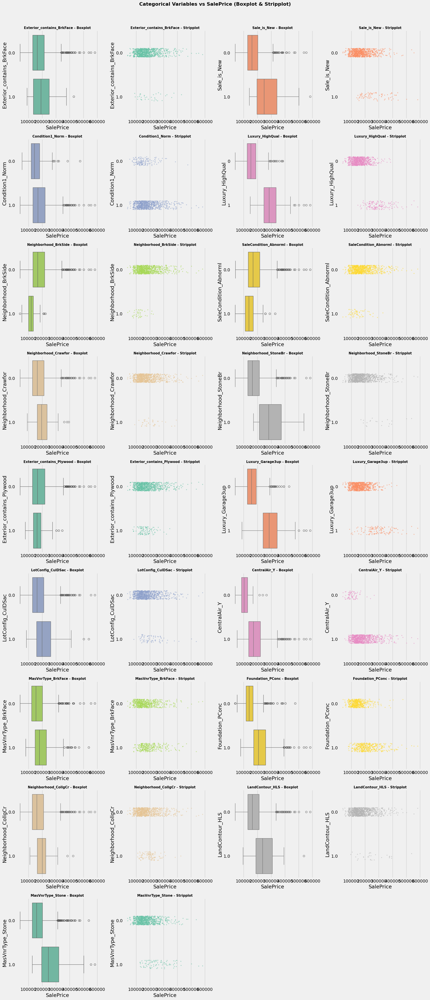

In [ ]:
transformd_X_train['SalePrice'] = y_train
binary_mask     = transformd_X_train.apply(lambda s: s.nunique() == 2)  # True = one-hot
plot_two_by_four(transformd_X_train, transformd_X_train.columns[binary_mask].tolist())
transformd_X_train.drop(columns='SalePrice', inplace=True)

/usr/local/lib/python3.11/dist-packages/numpy/lib/_polynomial_impl.py:657: RuntimeWarning: invalid value encountered in divide
  lhs /= scale


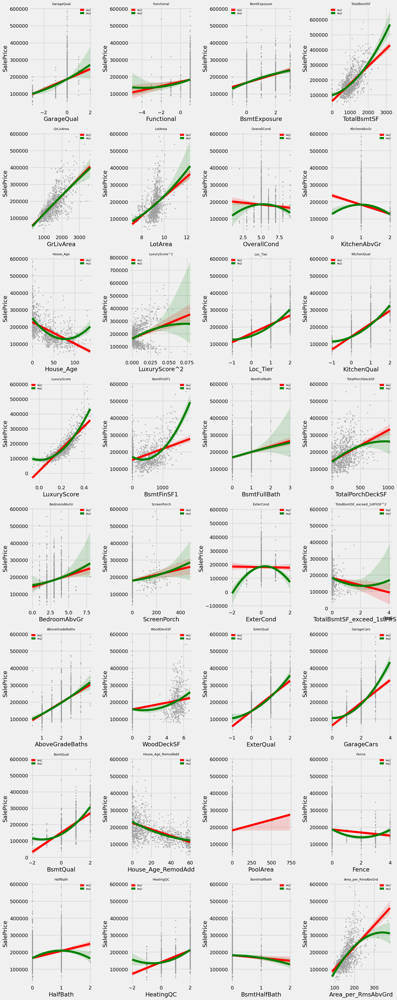

In [ ]:
binary_mask     = transformd_X_train.apply(lambda s: s.nunique() == 2)
num_ord_cols    = transformd_X_train.columns[~binary_mask].tolist()
plot_linear_vs_quad(transformd_X_train, y_train, num_ord_cols)


In [ ]:
transformd_X_train_ = transformd_X_train.copy()

In [ ]:
square_featuers = ['TotalBsmtSF', 'GrLivArea']
for sf in square_featuers:
  center_sf = transformd_X_train_[sf] - transformd_X_train_[sf].mean() # center to avoid the collinearity issue
  transformd_X_train_[f'{sf}^2'] = center_sf**2
# _, _, _ = check_pair(transformd_X_train_, y_train)

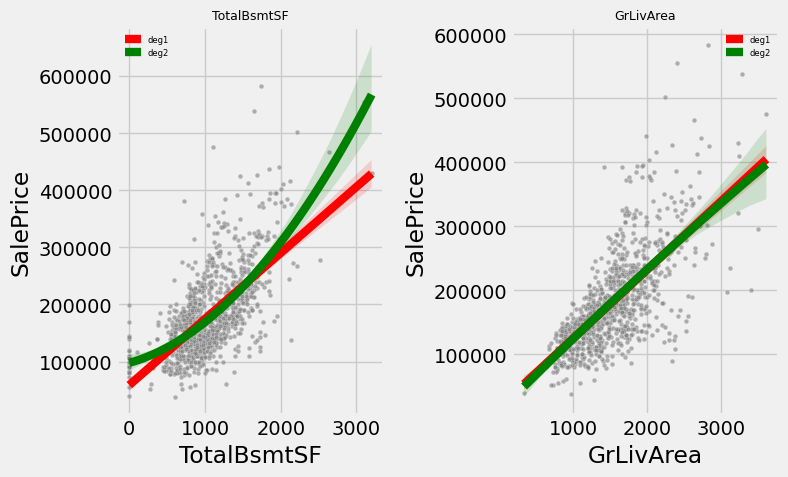

In [ ]:
plot_linear_vs_quad(transformd_X_train_, y_train, ['TotalBsmtSF', 'GrLivArea'], second_order=True)

In [ ]:
center_BsmtQual = transformd_X_train_['BsmtQual'] - transformd_X_train_['BsmtQual'].mean()
center_TotalBsmtSF = transformd_X_train_['TotalBsmtSF'] - transformd_X_train_['TotalBsmtSF'].mean()
transformd_X_train_['BsmtQual TotalBsmtSF'] = transformd_X_train_[['BsmtQual', 'TotalBsmtSF']].prod(axis=1)

In [ ]:
center_Loc_Tier = transformd_X_train_['Loc_Tier'] - transformd_X_train_['Loc_Tier'].mean()
center_HeatingQC = transformd_X_train_['HeatingQC'] - transformd_X_train_['HeatingQC'].mean()
transformd_X_train_['Loc_Tier HeatingQC'] = transformd_X_train_[['Loc_Tier', 'HeatingQC']].prod(axis=1)

In [ ]:
center_GrLivArea = transformd_X_train_['GrLivArea'] - transformd_X_train_['GrLivArea'].mean()
transformd_X_train_['Luxury_HighQual GrLivArea'] = transformd_X_train_[['Luxury_HighQual', 'GrLivArea']].prod(axis=1)

In [ ]:
transformd_X_train_['KitchenAbvGr KitchenQual'] = transformd_X_train_[['KitchenAbvGr', 'KitchenQual']].prod(axis=1)

In [ ]:
center_Loc_Tier = transformd_X_train_['Loc_Tier'] - transformd_X_train_['Loc_Tier'].mean()
transformd_X_train_['Loc_Tier LandContour_HLS'] = center_Loc_Tier * transformd_X_train_['LandContour_HLS']

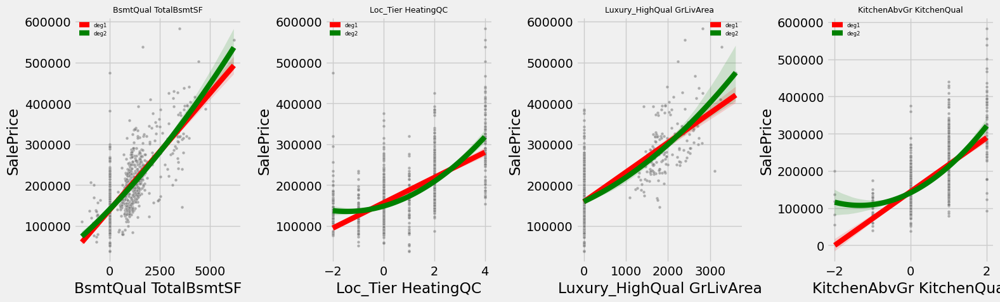

In [ ]:
plot_linear_vs_quad(transformd_X_train_, y_train, ['BsmtQual TotalBsmtSF', 'Loc_Tier HeatingQC', 'Luxury_HighQual GrLivArea', 'KitchenAbvGr KitchenQual'], second_order=True)

In [ ]:
transformd_X_train_['BsmtQual TotalBsmtSF'] = center_BsmtQual * center_TotalBsmtSF
transformd_X_train_['Loc_Tier HeatingQC'] = center_Loc_Tier * center_HeatingQC
transformd_X_train_['Luxury_HighQual GrLivArea'] = center_GrLivArea * transformd_X_train_['Luxury_HighQual']

In [ ]:
_,_,_ = check_pair(transformd_X_train_, y_train, threshold=0.7)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,KitchenQual,KitchenAbvGr KitchenQual,0.992569,0.669882,0.655808,KitchenAbvGr KitchenQual
1,LuxuryScore,GarageCars,0.749528,0.870556,0.650448,GarageCars
2,LuxuryScore,ExterQual,0.708822,0.870556,0.680900,ExterQual
3,KitchenQual,ExterQual,0.708194,0.669882,0.680900,KitchenQual
4,KitchenQual,LuxuryScore,0.702826,0.669882,0.870556,KitchenQual
5,LandContour_HLS,Loc_Tier LandContour_HLS,0.702000,0.166328,0.214689,LandContour_HLS


In [ ]:
transformd_X_train_.drop(columns=['KitchenQual', 'KitchenAbvGr', 'GarageCars'], inplace=True)

In [ ]:
transformd_X_train_['Has_PorchDeck'] = (transformd_X_train_['TotalPorchDeckSF']>0).astype(int)

In [ ]:
_,_,_ = check_pair(transformd_X_train_, y_train, threshold=0.7)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,LuxuryScore,ExterQual,0.708822,0.870556,0.680900,ExterQual
1,LandContour_HLS,Loc_Tier LandContour_HLS,0.702000,0.166328,0.214689,LandContour_HLS


For the House_Age_RemodAdd, due to the similar measurement with the House_Age, it is better to discretizate the House_Age_RemodAdd features into 'Remod_Old', 'Remod_Mid' and 'Remod_Recent'.

In [ ]:
t = transformd_X_train_.copy()

In [ ]:
def remod_bins(df, drop=True):
    if 'House_Age_RemodAdd' not in df.columns:
      return df
    df = df.copy()
    df['Remod_Recent'] = (df['House_Age_RemodAdd'] <= 5).astype(int)
    df['Remod_Mid']    = ((df['House_Age_RemodAdd'] > 5) & (df['House_Age_RemodAdd'] <= 15)).astype(int)
    df['Remod_Old']= (df['House_Age_RemodAdd'] > 15).astype(int)

    if drop:
      return df.drop(columns=['House_Age_RemodAdd'])
    else:
      return df

t = remod_bins(transformd_X_train_, drop=False)

In [ ]:
t['SalePrice'] = y_train
t['Remod'] = t['House_Age_RemodAdd']
t.loc[t['House_Age_RemodAdd'] <= 5, 'Remod'] = 'Remod_Recent'
t.loc[(t['House_Age_RemodAdd'] > 5) & (t['House_Age_RemodAdd'] <= 15), 'Remod'] = 'Remod_Mid'
t.loc[t['House_Age_RemodAdd'] > 15, 'Remod'] = 'Remod_Old'
t['Remod']

,Remod
135,Remod_Old
1452,Remod_Recent
762,Remod_Recent
932,Remod_Recent
435,Remod_Mid
...,...
1095,Remod_Recent
1130,Remod_Old
1294,Remod_Old
860,Remod_Mid


In [ ]:
display(t.groupby('Remod')['SalePrice'].median())
display(t.groupby('Remod')['SalePrice'].mean())

,SalePrice
Remod,
Remod_Mid,191500.0
Remod_Old,138887.0
Remod_Recent,206000.0


,SalePrice
Remod,
Remod_Mid,203784.939130
Remod_Old,143786.189409
Remod_Recent,223613.288660


In [ ]:
t.drop(columns=['SalePrice','Remod'], inplace=True)
_,_,_ = check_pair(t, y_train, threshold=0.75)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,House_Age_RemodAdd,Remod_Old,0.878699,-0.527702,-0.477144,Remod_Old


In [ ]:
transformd_X_train_ = remod_bins(transformd_X_train_, drop=True)

In [ ]:
transformd_X_train_

,GarageQual,Functional,BsmtExposure,TotalBsmtSF,GrLivArea,LotArea,OverallCond,House_Age,LuxuryScore^2,Exterior_contains_BrkFace,...,GrLivArea^2,BsmtQual TotalBsmtSF,Loc_Tier HeatingQC,Luxury_HighQual GrLivArea,KitchenAbvGr KitchenQual,Loc_Tier LandContour_HLS,Has_PorchDeck,Remod_Recent,Remod_Mid,Remod_Old
135,0.0,1.0,0.0,1304.0,1682.0,9.249657,6.0,38.0,0.004938,0.0,...,27455.376612,-128.398118,-0.088939,0.00000,0.0,0.0,1,0,0,1
1452,0.0,1.0,3.0,547.0,1072.0,8.209580,5.0,1.0,0.003953,0.0,...,197405.475426,-248.114521,0.189717,-0.00000,0.0,-0.0,1,1,0,0
762,0.0,1.0,1.0,756.0,1547.0,9.064274,5.0,1.0,0.000103,0.0,...,942.283727,-145.266695,0.549401,0.00000,1.0,0.0,1,1,0,0
932,0.0,1.0,0.0,1905.0,1905.0,9.364862,5.0,1.0,0.038179,0.0,...,151085.078193,1273.949708,0.549401,388.69664,2.0,0.0,1,1,0,0
435,0.0,1.0,2.0,799.0,1661.0,9.275004,6.0,13.0,0.001673,0.0,...,20937.117719,-124.106616,0.549401,0.00000,1.0,0.0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.0,1.0,0.0,1314.0,1314.0,9.139703,5.0,1.0,0.001227,0.0,...,40926.649339,129.322238,-0.088939,-0.00000,1.0,0.0,1,1,0,0
1130,0.0,-1.0,0.0,1122.0,1981.0,8.962520,3.0,81.0,0.000036,0.0,...,215942.967521,-35.959383,0.412049,0.00000,1.0,-0.0,1,0,0,1
1294,0.0,1.0,0.0,864.0,864.0,9.008591,7.0,51.0,0.005434,0.0,...,425499.673055,95.080143,1.551378,-0.00000,0.0,-0.0,0,0,0,1
860,0.0,1.0,0.0,912.0,1426.0,8.941545,8.0,89.0,0.000164,0.0,...,8154.696770,70.700696,-0.088939,-0.00000,1.0,0.0,1,0,1,0


Similarily, the remain collinearity features just give lasso to select.

# Final Model Evaluation - Lasso

In [ ]:
def advanced_feature_engineering(df: pd.DataFrame):
    df = df.copy()

    if {"House_Age_RemodAdd"}.issubset(df.columns):
        df["Remod_Recent"] = (df["House_Age_RemodAdd"] <= 5).astype(int)
        df["Remod_Mid"] = (
            (df["House_Age_RemodAdd"] > 5) & (df["House_Age_RemodAdd"] <= 15)
        ).astype(int)
        df["Remod_Old"] = (df["House_Age_RemodAdd"] >= 15).astype(int)
        df.drop(columns=["House_Age_RemodAdd"], inplace=True)


    if {'BsmtQual', 'TotalBsmtSF'}.issubset(df.columns):
      center_BsmtQual = df['BsmtQual'] - df['BsmtQual'].mean()
      center_TotalBsmtSF = df['TotalBsmtSF'] - df['TotalBsmtSF'].mean()
      df['BsmtQual TotalBsmtSF'] = center_BsmtQual * center_TotalBsmtSF

    if {'KitchenQual', 'KitchenAbvGr'}.issubset(df.columns):
      df['KitchenAbvGr KitchenQual'] = df[['KitchenAbvGr', 'KitchenQual']].prod(axis=1)
      df.drop(columns=['KitchenAbvGr', 'KitchenQual'], inplace=True)

    if {'Loc_Tier', 'HeatingQC'}.issubset(df.columns):
      center_Loc_Tier = df['Loc_Tier'] - df['Loc_Tier'].mean()
      center_HeatingQC = df['HeatingQC'] - df['HeatingQC'].mean()
      df['Loc_Tier HeatingQC'] = center_Loc_Tier * center_HeatingQC

    if {'Luxury_HighQual', 'GrLivArea'}.issubset(df.columns):
      center_GrLivArea = df['GrLivArea'] - df['GrLivArea'].mean()
      df['Luxury_HighQual GrLivArea'] = center_GrLivArea * df['Luxury_HighQual']

    if {'TotalPorchDeckSF'}.issubset(df.columns):
      df['Has_PorchDeck'] = (df['TotalPorchDeckSF']>0).astype(int)

    if {'GarageCars'}.issubset(df.columns):
      df.drop(columns='GarageCars', inplace=True)

    if {'WoodDeckSF'}.issubset(df.columns):
      df.drop(columns='WoodDeckSF', inplace=True)

    square_features = {'TotalBsmtSF', 'GrLivArea'}
    if square_features.issubset(df.columns):
      for sf in square_features:
        df[sf] = df[sf] - df[sf].mean() # center to avoid the collinearity issue
        df[f'{sf}^2'] = df[sf]**2

    return df

In [ ]:
advanced_feature_engineering(transformd_X_train)

,GarageQual,Functional,BsmtExposure,TotalBsmtSF,GrLivArea,LotArea,OverallCond,House_Age,LuxuryScore^2,Exterior_contains_BrkFace,...,Remod_Recent,Remod_Mid,Remod_Old,BsmtQual TotalBsmtSF,KitchenAbvGr KitchenQual,Loc_Tier HeatingQC,Luxury_HighQual GrLivArea,Has_PorchDeck,GrLivArea^2,TotalBsmtSF^2
135,0.0,1.0,0.0,252.799407,165.69664,9.249657,6.0,38.0,0.004938,0.0,...,0,0,1,-128.398118,0.0,-0.088939,0.00000,1,27455.376612,63907.540238
1452,0.0,1.0,3.0,-504.200593,-444.30336,8.209580,5.0,1.0,0.003953,0.0,...,1,0,0,-248.114521,0.0,0.189717,-0.00000,1,197405.475426,254218.237866
762,0.0,1.0,1.0,-295.200593,30.69664,9.064274,5.0,1.0,0.000103,0.0,...,1,0,0,-145.266695,1.0,0.549401,0.00000,1,942.283727,87143.390040
932,0.0,1.0,0.0,853.799407,388.69664,9.364862,5.0,1.0,0.038179,0.0,...,1,0,0,1273.949708,2.0,0.549401,388.69664,1,151085.078193,728973.427589
435,0.0,1.0,2.0,-252.200593,144.69664,9.275004,6.0,13.0,0.001673,0.0,...,0,1,0,-124.106616,1.0,0.549401,0.00000,1,20937.117719,63605.139052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.0,1.0,0.0,262.799407,-202.30336,9.139703,5.0,1.0,0.001227,0.0,...,1,0,0,129.322238,1.0,-0.088939,-0.00000,1,40926.649339,69063.528380
1130,0.0,-1.0,0.0,70.799407,464.69664,8.962520,3.0,81.0,0.000036,0.0,...,0,0,1,-35.959383,1.0,0.412049,0.00000,1,215942.967521,5012.556048
1294,0.0,1.0,0.0,-187.200593,-652.30336,9.008591,7.0,51.0,0.005434,0.0,...,0,0,1,95.080143,0.0,1.551378,-0.00000,0,425499.673055,35044.061977
860,0.0,1.0,0.0,-139.200593,-90.30336,8.941545,8.0,89.0,0.000164,0.0,...,0,1,0,70.700696,1.0,-0.088939,-0.00000,1,8154.696770,19376.805060


In [ ]:
lasso_boot_model_ = Pipeline([
    ('prep', prep),
    ('log_tranform', FunctionTransformer(log_transform)),
    ('add_TotalPorchDeckSF_features', FunctionTransformer(add_TotalPorchDeckSF_features)),
    ('add_luxury_features', FunctionTransformer(add_luxury_features)),
    ('add_Age', FunctionTransformer(add_Age)),
    ('add_Bath', FunctionTransformer(add_Bath)),
    ('low_var', CustomVarianceFilter(1e-3,)),
    ('collinearityFeaturesEnigneering', FunctionTransformer(collinearityFeatureEngineering)),

    ('bootstrap_select', BootLassoSelector(Lasso(alpha=model_.named_steps['model'].alpha, max_iter=10000), n_bootstraps=2000, freq_threshold=0.75, random_state=0, scaled=False)),

    ('advance_features_engineering', FunctionTransformer(advanced_feature_engineering)),
    ('scale', CustomNumAndOrdScaler(dataframe=True)),
    ('model', LassoCV(n_alphas=100, n_jobs=-1, cv=kf, random_state=0, max_iter=10000))


])

lasso_boot_model_.fit(X_train, y_train)
lasso_boot_model_.named_steps['model'].alpha_
# advanced_feature_engineering(transformd_X_train).columns.difference(lasso_boot_model_.fit_transform(X_train, y_train).columns)

np.float64(64.8089606551154)

In [ ]:
p = clone(lasso_boot_model_[:-1])
p.steps.append(('bootstrap_select2', BootLassoSelector(Lasso(alpha=lasso_boot_model_.named_steps['model'].alpha_, max_iter=10000), n_bootstraps=2000, freq_threshold=0.9, random_state=0, scaled=True,
                               scale_only_NumOrd=True, cd=False, cd_level=0.95, cz_given_selected=True, rel_width=False)))
transformed_X_train = p.fit_transform(X_train, y_train)
base_est = LinearRegression()
param_grid = {
    'rfe__n_features_to_select': [i for i in range(5, len(p[-1].get_feature_names_out())+1)]
}

grid_pipe = Pipeline([
    ('rfe',  RFE(estimator=base_est, step=1)),
    ('model', base_est)
])

grid = GridSearchCV(
        grid_pipe,
        param_grid=param_grid,
        cv=kf,
        scoring='r2',
        n_jobs=-1
)
grid.fit(transformed_X_train, y_train)

best_k = grid.best_params_['rfe__n_features_to_select']
best_score = grid.best_score_
best_k, best_score

(44, np.float64(0.9143654724675278))

In [ ]:
p.named_steps['bootstrap_select2'].get_feature_names_out(), len(p.named_steps['bootstrap_select2'].get_feature_names_out())

(['Functional',
  'BsmtExposure',
  'GrLivArea',
  'TotalBsmtSF',
  'LotArea',
  'OverallCond',
  'Sale_is_New',
  'House_Age',
  'LuxuryScore^2',
  'Exterior_contains_BrkFace',
  'LuxuryScore',
  'Condition1_Norm',
  'BsmtFinSF1',
  'BsmtQual',
  'BsmtQual TotalBsmtSF',
  'Luxury_HighQual GrLivArea',
  'Neighborhood_Crawfor',
  'HalfBath',
  'Neighborhood_BrkSide',
  'ScreenPorch',
  'GrLivArea^2',
  'GarageQual',
  'ExterCond',
  'Neighborhood_StoneBr',
  'KitchenAbvGr KitchenQual',
  'SaleCondition_Abnorml',
  'BsmtFullBath',
  'Luxury_Garage3up',
  'Neighborhood_CollgCr',
  'Loc_Tier',
  'MasVnrType_BrkFace',
  'CentralAir_Y',
  'TotalPorchDeckSF',
  'BedroomAbvGr',
  'Foundation_PConc',
  'AboveGradeBaths',
  'ExterQual',
  'LotConfig_CulDSac',
  'Fence',
  'HeatingQC',
  'TotalBsmtSF_exceed_1stFlrSF^2',
  'MasVnrType_Stone',
  'LandContour_HLS',
  'TotalBsmtSF^2',
  'Loc_Tier HeatingQC',
  'PoolArea',
  'BsmtHalfBath',
  'Exterior_contains_Plywood'],
 48)

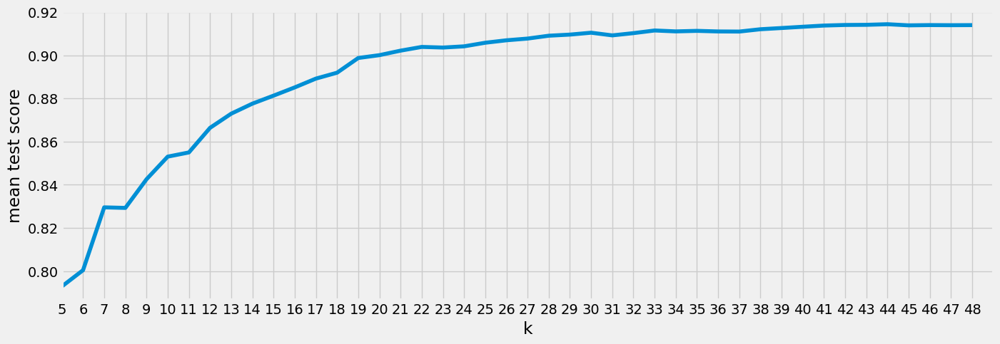

In [ ]:
scores = grid.cv_results_['mean_test_score']
plt.figure(figsize=(15,5))
plt.plot(param_grid['rfe__n_features_to_select'], scores, )
plt.xlabel("k")
plt.ylabel("mean test score")
plt.xlim((5, param_grid['rfe__n_features_to_select'][-1]+1))
plt.xticks(np.arange(5, param_grid['rfe__n_features_to_select'][-1]+1, 1))
plt.show()


In [ ]:
rfe_ = RFE(LinearRegression(), n_features_to_select=42)
rfe_.fit(transformed_X_train, y_train)
rfe_.get_feature_names_out()

array(['Functional', 'BsmtExposure', 'GrLivArea', 'TotalBsmtSF',
       'LotArea', 'OverallCond', 'Sale_is_New', 'House_Age',
       'LuxuryScore^2', 'Exterior_contains_BrkFace', 'LuxuryScore',
       'Condition1_Norm', 'BsmtFinSF1', 'BsmtQual',
       'BsmtQual TotalBsmtSF', 'Luxury_HighQual GrLivArea',
       'Neighborhood_Crawfor', 'HalfBath', 'Neighborhood_BrkSide',
       'ScreenPorch', 'GrLivArea^2', 'GarageQual', 'ExterCond',
       'Neighborhood_StoneBr', 'KitchenAbvGr KitchenQual',
       'SaleCondition_Abnorml', 'BsmtFullBath', 'Luxury_Garage3up',
       'Neighborhood_CollgCr', 'Loc_Tier', 'MasVnrType_BrkFace',
       'CentralAir_Y', 'TotalPorchDeckSF', 'BedroomAbvGr',
       'Foundation_PConc', 'AboveGradeBaths', 'ExterQual',
       'LotConfig_CulDSac', 'HeatingQC', 'MasVnrType_Stone',
       'LandContour_HLS', 'Exterior_contains_Plywood'], dtype=object)

# Dropping Features

In [ ]:
class CustomDropper(BaseEstimator, TransformerMixin):

    def __init__(self, drop_cols:list):
        self.drop_cols = drop_cols

    # ---------- FIT ----------
    def fit(self, X, y=None):
        return self

    # ---------- TRANSFORM ----
    def transform(self, X, ):
        X = X.copy()
        if set(self.drop_cols).issubset(X.columns):
          X.drop(columns=self.drop_cols, inplace=True)

        self.X = X
        return X

    def get_feature_names_out(self, input_features=None):
        return np.asarray(self.X.columns, dtype=object)




In [ ]:
lasso_boot_model1_ = clone(p)
lasso_boot_model1_.steps.append(('rfe', RFE(LinearRegression(), n_features_to_select=42)))
# lasso_boot_model_.steps.append(('model', LassoCV(n_alphas=100, n_jobs=-1, cv=kf, random_state=0, max_iter=10000)))
lasso_boot_model1_.steps.append(('model',  Lasso(alpha=64.8089606551154)))
print('no drop:', np.mean(cross_val_score(lasso_boot_model1_, X_train, y_train, cv=kf, scoring='r2', n_jobs=-1)))


no drop: 0.911537099790379


In [ ]:
from itertools import combinations
features_drop = [
    'ExterCond',
    'Neighborhood_CollgCr',
    'Loc_Tier',
    'TotalPorchDeckSF',
    'LandContour_HLS',
    'Exterior_contains_Plywood',
]


def score_after_drop(drop_cols):
    pipe = clone(p)
    pipe.steps.append(('rfe', RFE(LinearRegression(), n_features_to_select=42)))
    pipe.steps.append(('drop', CustomDropper(drop_cols=drop_cols)))
    pipe.steps.append(('model', Lasso(alpha=64.8089606551154)))
    cv = cross_val_score(pipe, X_train, y_train, cv=kf, scoring='r2', n_jobs=-1).mean()
    return (tuple(drop_cols), cv)


pairs = list(combinations(features_drop, 2))
res_pairs = []
for cols in pairs:
  res_pairs.append(score_after_drop(list(cols)))


In [ ]:
no_drop_df = pd.DataFrame(data=[['no drop', 0.911537099790379]], columns=['drop_cols','cv'])
no_drop_df

,drop_cols,cv
0,no drop,0.911537


In [ ]:
# df_pairs = pd.DataFrame(res_pairs, columns=['drop_cols','cv']).sort_values('cv', ascending=False)
pairs = [
    {'drop_cols': ('Loc_Tier', 'TotalPorchDeckSF'), 'cv': 0.912142},
    {'drop_cols': ('TotalPorchDeckSF', 'Exterior_contains_Plywood'), 'cv': 0.911923},
    {'drop_cols': ('Loc_Tier', 'Exterior_contains_Plywood'), 'cv': 0.911892},
    {'drop_cols': ('Neighborhood_CollgCr', 'TotalPorchDeckSF'), 'cv': 0.911846},
    {'drop_cols': ('ExterCond', 'Neighborhood_CollgCr'), 'cv': 0.911779},
    {'drop_cols': ('Neighborhood_CollgCr', 'LandContour_HLS'), 'cv': 0.911646},
    {'drop_cols': ('Loc_Tier', 'LandContour_HLS'), 'cv': 0.911629},
    {'drop_cols': ('ExterCond', 'Loc_Tier'), 'cv': 0.911625},
    {'drop_cols': ('Neighborhood_CollgCr', 'Loc_Tier'), 'cv': 0.911616},
    {'drop_cols': ('ExterCond', 'Exterior_contains_Plywood'), 'cv': 0.911537},
    {'drop_cols': ('LandContour_HLS', 'Exterior_contains_Plywood'), 'cv': 0.911537},
    {'drop_cols': ('Neighborhood_CollgCr', 'Exterior_contains_Plywood'), 'cv': 0.911458},
    {'drop_cols': ('ExterCond', 'TotalPorchDeckSF'), 'cv': 0.911454},
    {'drop_cols': ('TotalPorchDeckSF', 'LandContour_HLS'), 'cv': 0.911435},
    {'drop_cols': ('ExterCond', 'LandContour_HLS'), 'cv': 0.911435},
]

df_pairs = pd.DataFrame(pairs)

df = pd.concat([no_drop_df, df_pairs], axis=0, ignore_index=True)
df

,drop_cols,cv
0,no drop,0.911537
1,"(Loc_Tier, TotalPorchDeckSF)",0.912142
2,"(TotalPorchDeckSF, Exterior_contains_Plywood)",0.911923
3,"(Loc_Tier, Exterior_contains_Plywood)",0.911892
4,"(Neighborhood_CollgCr, TotalPorchDeckSF)",0.911846
5,"(ExterCond, Neighborhood_CollgCr)",0.911779
6,"(Neighborhood_CollgCr, LandContour_HLS)",0.911646
7,"(Loc_Tier, LandContour_HLS)",0.911629
8,"(ExterCond, Loc_Tier)",0.911625
9,"(Neighborhood_CollgCr, Loc_Tier)",0.911616


In [ ]:
lasso_boot_model2_ = clone(p)
lasso_boot_model2_.steps.append(('rfe', RFE(LinearRegression(), n_features_to_select=42)))
lasso_boot_model2_.steps.append(('drop_cols1', CustomDropper(drop_cols=['Neighborhood_CollgCr', 'LandContour_HLS'])))
for f in r:
  lasso_boot_model2_.steps.append(('drop_cols2', CustomDropper(drop_cols=[f])))
  # lasso_boot_model2_.steps.append(('model', LassoCV(n_alphas=100, n_jobs=-1, cv=kf, random_state=0, max_iter=10000)))
  lasso_boot_model2_.steps.append(('model',  Lasso(alpha=64.8089606551154)))
  print(f'drop {f}:', np.mean(cross_val_score(lasso_boot_model2_, X_train, y_train, cv=kf, scoring='r2', n_jobs=-1)))
  lasso_boot_model2_ = clone(lasso_boot_model2_[:-2])

# lasso_boot_model2_.fit(X_train, y_train)
# lasso_boot_model2_.named_steps['model'].alpha_
# lasso_boot_model_.fit_transform(X_train, y_train)

drop Neighborhood_Crawfor: 0.9102208553277291
drop BsmtFinSF1: 0.9091641497400623
drop BedroomAbvGr: 0.9114165153792643
drop LotConfig_CulDSac: 0.9115422249051577
drop GrLivArea: 0.9026398855088417
drop Condition1_Norm: 0.9107837823475771
drop BsmtQual TotalBsmtSF: 0.9102977554747514
drop House_Age: 0.9090361689012451
drop HalfBath: 0.9108976337013974
drop BsmtFullBath: 0.9113712699400672
drop LuxuryScore: 0.9087826819473491
drop Neighborhood_StoneBr: 0.9096185221357074
drop Luxury_Garage3up: 0.9116156101105164
drop Loc_Tier: 0.9118010030375354
drop Foundation_PConc: 0.9113661519089676
drop SaleCondition_Abnorml: 0.9111229016169855
drop ExterCond: 0.9116637628970041
drop KitchenAbvGr KitchenQual: 0.9107522222399791
drop GarageQual: 0.911387621062396
drop OverallCond: 0.9057467591965906
drop Exterior_contains_Plywood: 0.9118294172617469
drop BsmtExposure: 0.9096848853344977
drop Luxury_HighQual GrLivArea: 0.9092708183762748
drop ExterQual: 0.9114987438820281
drop BsmtQual: 0.90972681608

In [ ]:
lasso_boot_model_ = clone(p)
lasso_boot_model_.steps.append(('rfe', RFE(LinearRegression(), n_features_to_select=42)))
lasso_boot_model_.steps.append(('drop_cols', CustomDropper(drop_cols=['LandContour_HLS', 'Neighborhood_CollgCr', 'Exterior_contains_Plywood', 'LotConfig_CulDSac', 'ExterCond', 'MasVnrType_BrkFace', 'BsmtFullBath'])))
lasso_boot_model_.steps.append(('model',  Lasso(alpha=64.8089606551154)))

In [ ]:
np.mean(cross_val_score(lasso_boot_model_, X_train, y_train, cv=kf, scoring='r2', n_jobs=-1))

np.float64(0.9111953879374856)

training score 0.9272800433593764
cv score (mean, std, scores) 0.9111953879374856 0.016222525105504235 [0.90567117 0.9140819  0.93283149 0.88397033 0.91942204]


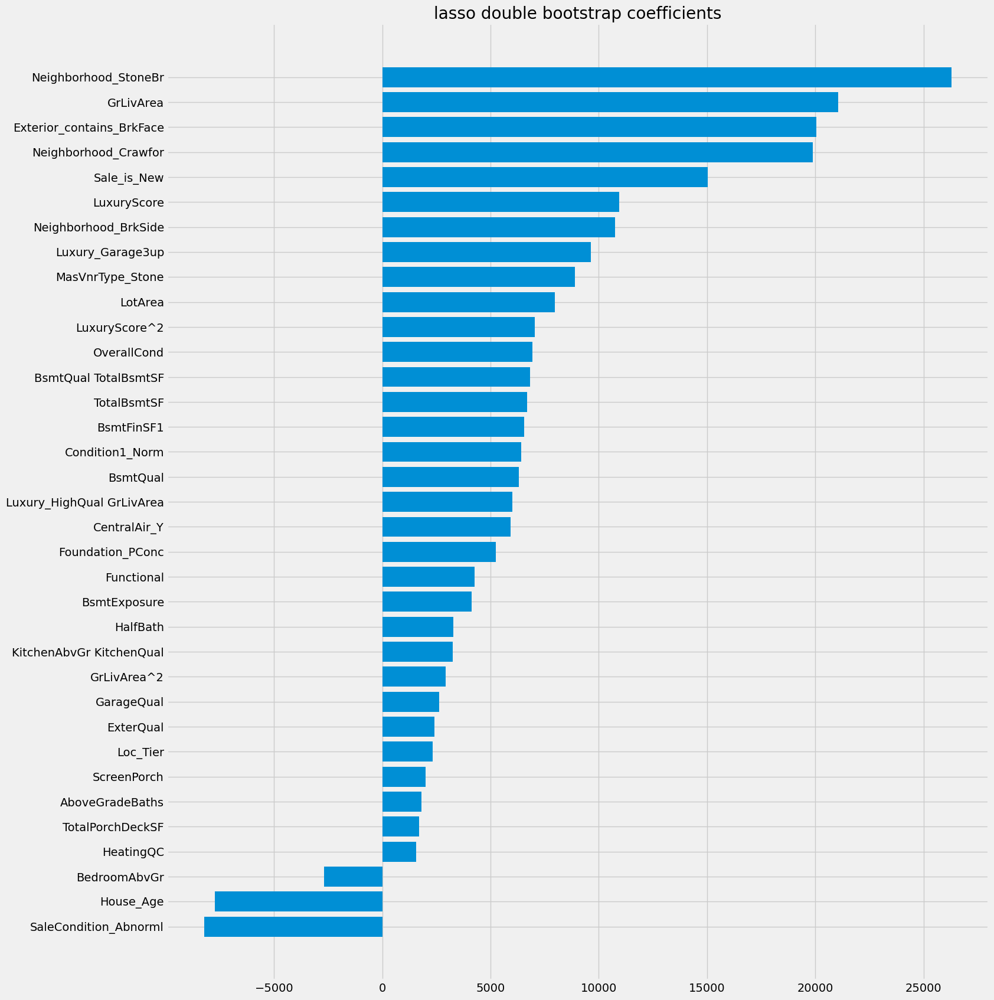

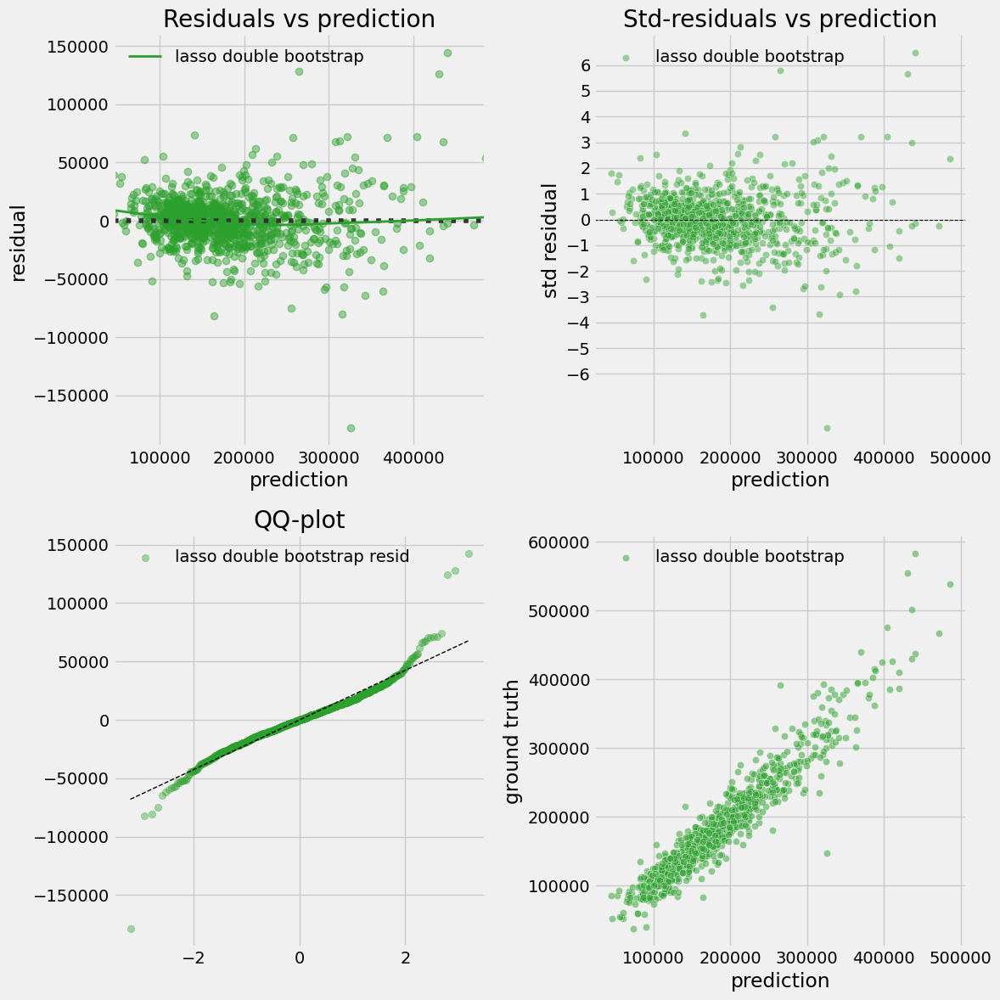

In [ ]:
s, r = model_training(lasso_boot_model_, 'lasso double bootstrap', X_train, y_train, cv=kf, plot_res=True)

In [ ]:
len(lasso_boot_model_[-2].get_feature_names_out()), len(s)

(35, 35)

In [ ]:
lasso_boot_model_.score(X_test, y_test)

0.922113370050915

# Final Model Evaluation - Ridge

Here for the ridge model, the best alpha is 0, so it is just the same as OLS model.

In [ ]:
ridge_boot_model_ = clone(lasso_boot_model_)

ridge_boot_model_.set_params(model=RidgeCV(alphas=(0, 1.0, 10), cv=kf, scoring='r2',))


ridge_boot_model_.fit(X_train, y_train)
ridge_boot_model_.named_steps['model'].alpha_

np.float64(1.0)

# Final Model Evaluation - ElasticNet

Here it is found that the best model got by ElasticNetCV is just the same as Lasso, so we do not do any further plotting.

In [ ]:
elasticnet_boot_model_ = clone(lasso_boot_model_)
elasticnet_boot_model_.set_params(model=ElasticNetCV(n_alphas=100, l1_ratio=np.arange(0.1, 1.1, 0.1), cv=kf, n_jobs=-1, random_state=0))

elasticnet_boot_model_.fit(X_train, y_train)
elasticnet_boot_model_.named_steps['model'].l1_ratio_

np.float64(1.0)

# Final Model Evaluation - OLS

In [ ]:
ols_boot_model_ = clone(lasso_boot_model_)
ols_boot_model_.set_params(model=LinearRegression())

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('ord_encode',
                                                  Pipeline(steps=[('encode',
                                                                   ColumnTransformer(transformers=[('exter_heat_kitchen',
                                                                                                    Pipeline(steps=[('impute',
                                                                                                                     SimpleImputer(fill_value='NA',
                                                                                                                                   strategy='constant')),
                                                                                                                    ('ord',
                                                                                                                     OrdinalEncoder(categories=[['Po',
                                                                                                                                                 'Fa',
                                                                                                                                                 'TA',
                                                                                                                                                 'Gd',
                                                                                                                                                 'Ex'],
                                                                                                                                                ['Po',
                                                                                                                                                 'Fa',
                                                                                                                                                 'TA',
                                                                                                                                                 'Gd',
                                                                                                                                                 'Ex'],
                                                                                                                                                ['Po',
                                                                                                                                                 'Fa',
                                                                                                                                                 'TA',
                                                                                                                                                 'Gd',
                                                                                                                                                 'Ex'],
                                                                                                                                                ['Po',
                                                                                                                                                 '...
                                   cd_level=0.95, cz_given_selected=True,
                                   freq_threshold=0.9, n_bootstraps=2000)),
                ('rfe',
                 RFE(estimator=LinearRegression(), n_features_to_select=42)),
                ('drop_cols',
                 CustomDropper(drop_cols=['LandContour_HLS',
                                          'Neighborhood_CollgCr',
                                          'Exterior_contains_Plywood',
                                          'LotConfig_CulDSac', 'ExterCond',
                                  

training score 0.9274655592180807
cv score (mean, std, scores) 0.9101911105644259 0.015849801350805406 [0.9059834  0.91263284 0.93119744 0.88316328 0.9179786 ]


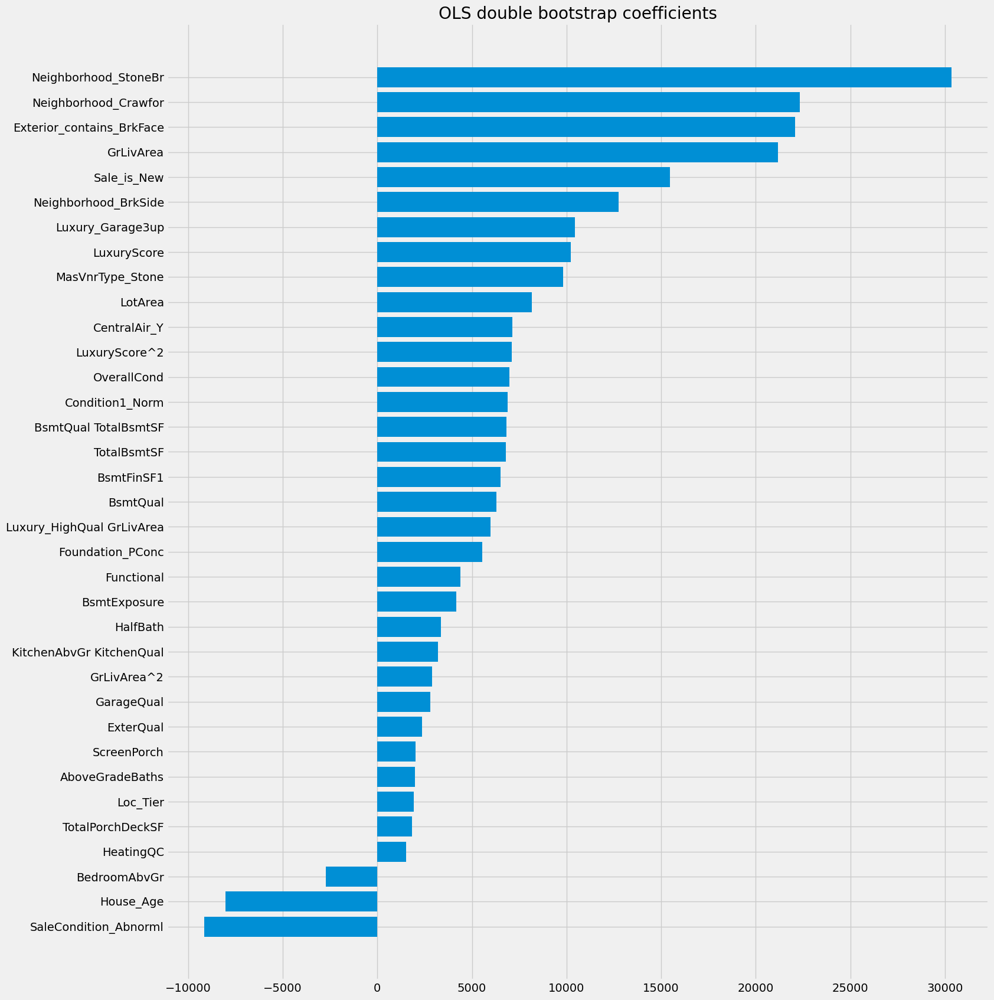

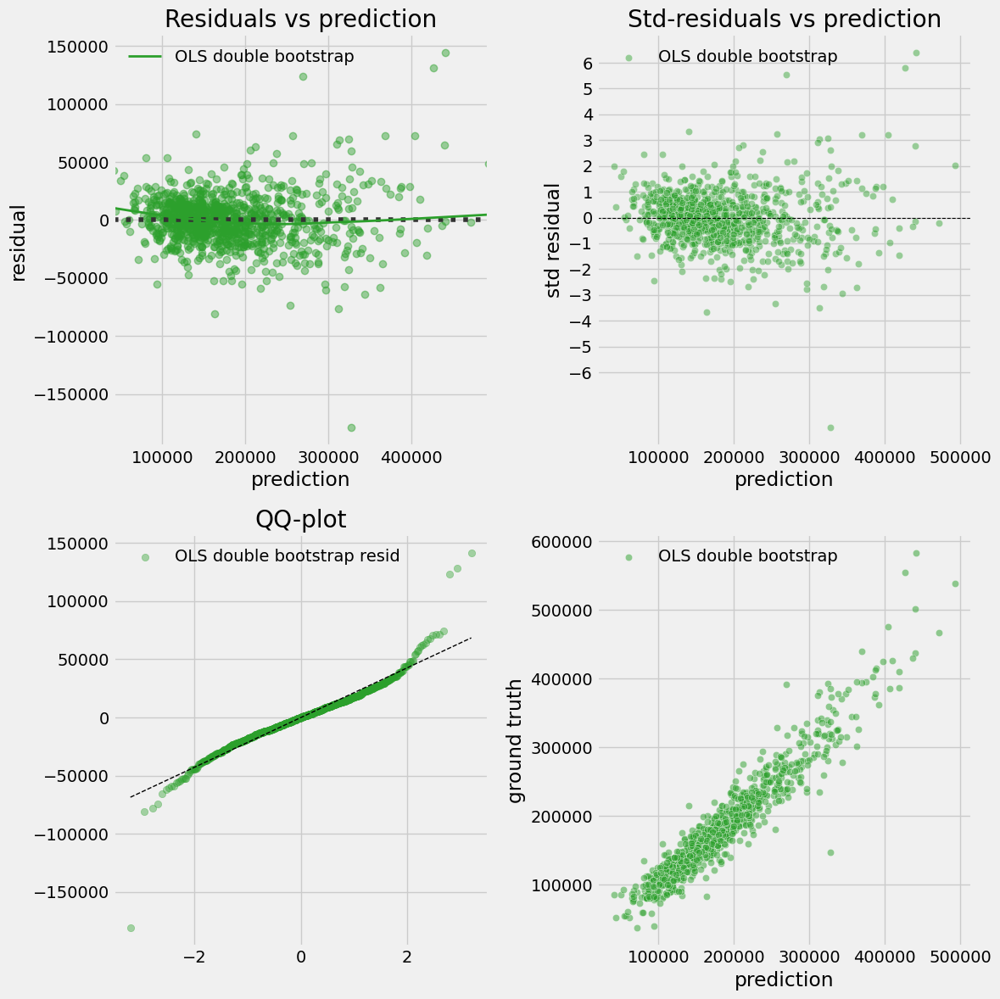

In [ ]:
s_o, r_o = model_training(ols_boot_model_, 'OLS double bootstrap', X_train, y_train, cv=kf)

In [ ]:
ols_boot_model_.score(X_test, y_test)

0.9218095208947429

In [ ]:
print('LASSO - Test Score:', lasso_boot_model_.score(X_test, y_test))
print('OLS - Test Score:', ols_boot_model_.score(X_test, y_test))

LASSO - Test Score: 0.922113370050915
OLS - Test Score: 0.9218095208947429


# Statisical Inference

It is needed to use the whole dataset and the unscaled explanatory variables to compute the individual coefficient standard errors and p-values.

In [ ]:
prep_statisical_inference = clone(lasso_boot_model_[:-1])
prep_statisical_inference.set_params(bootstrap_select2__scaled=False)
prep_statisical_inference.fit(X_train, y_train)
# prep_statisical_inference

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('ord_encode',
                                                  Pipeline(steps=[('encode',
                                                                   ColumnTransformer(transformers=[('exter_heat_kitchen',
                                                                                                    Pipeline(steps=[('impute',
                                                                                                                     SimpleImputer(fill_value='NA',
                                                                                                                                   strategy='constant')),
                                                                                                                    ('ord',
                                                                                                                     OrdinalEncoder(categories=[['Po',
                                                                                                                                                 'Fa',
                                                                                                                                                 'TA',
                                                                                                                                                 'Gd',
                                                                                                                                                 'Ex'],
                                                                                                                                                ['Po',
                                                                                                                                                 'Fa',
                                                                                                                                                 'TA',
                                                                                                                                                 'Gd',
                                                                                                                                                 'Ex'],
                                                                                                                                                ['Po',
                                                                                                                                                 'Fa',
                                                                                                                                                 'TA',
                                                                                                                                                 'Gd',
                                                                                                                                                 'Ex'],
                                                                                                                                                ['Po',
                                                                                                                                                 '...
                                                    max_iter=10000),
                                   cd_level=0.95, cz_given_selected=True,
                                   freq_threshold=0.9, n_bootstraps=2000,
                                   scaled=False)),
                ('rfe',
                 RFE(estimator=LinearRegression(), n_features_to_select=42)),
                ('drop_cols',
                 CustomDropper(drop_cols=['LandContour_HLS',
                                          'Neighborhood_CollgCr',
                                          'Exterior_contains_Pl

In [ ]:
cleaned_data = pd.concat([train_cleaned, test], axis=0)
cleaned_data.shape

(1450, 89)

In [ ]:
cleaned_X, cleaned_y = cleaned_data.drop(columns='SalePrice'), cleaned_data['SalePrice']

In [ ]:
transformed_X = prep_statisical_inference.transform(cleaned_X)
transformed_X

,Functional,BsmtExposure,GrLivArea,TotalBsmtSF,LotArea,OverallCond,Sale_is_New,House_Age,LuxuryScore^2,Exterior_contains_BrkFace,...,Luxury_Garage3up,Loc_Tier,CentralAir_Y,TotalPorchDeckSF,BedroomAbvGr,Foundation_PConc,AboveGradeBaths,ExterQual,HeatingQC,MasVnrType_Stone
135,0.248326,-0.587966,0.356724,0.614045,0.259997,0.385834,0.0,0.031667,-0.237436,0.0,...,0,0.664591,1.0,-0.541711,0.138017,1.0,0.384105,-0.680806,-0.144462,0.0
1452,0.248326,2.223161,-0.882028,-1.226392,-1.733741,-0.511785,0.0,-1.172126,-0.372259,0.0,...,0,-1.417656,1.0,-0.971682,-1.098032,1.0,-1.225478,-0.680806,-0.144462,0.0
762,0.248326,0.349076,0.082574,-0.718266,-0.095368,-0.511785,0.0,-1.172126,-0.743169,0.0,...,0,0.664591,1.0,0.170811,0.138017,1.0,1.188897,-0.680806,0.892383,0.0
932,0.248326,-0.587966,0.809580,2.075211,0.480835,-0.511785,0.0,-1.172126,3.160464,0.0,...,1,0.664591,1.0,0.029535,0.138017,1.0,0.384105,2.843365,0.892383,1.0
435,0.248326,1.286118,0.314079,-0.613723,0.308584,0.385834,0.0,-0.781706,-0.572186,0.0,...,0,0.664591,1.0,0.201523,0.138017,1.0,1.188897,1.081279,0.892383,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,0.248326,-0.587966,-0.914520,0.011101,-0.201168,0.385834,0.0,0.389551,-0.060141,0.0,...,0,-0.376533,1.0,-1.143670,0.138017,0.0,-1.225478,-0.680806,-2.218150,0.0
323,0.248326,-0.587966,-0.697231,0.268811,-0.852637,2.181073,0.0,0.454621,0.440007,0.0,...,0,-1.417656,1.0,0.330514,0.138017,0.0,-1.225478,-0.680806,0.892383,0.0
650,0.248326,-0.587966,0.322202,-0.579686,-0.213161,0.385834,0.0,-1.172126,-0.744099,0.0,...,0,0.664591,1.0,-1.143670,0.138017,1.0,1.188897,1.081279,0.892383,0.0
439,0.248326,0.349076,-0.630216,-0.893314,0.590011,2.181073,0.0,1.690948,-0.462378,0.0,...,0,-1.417656,1.0,-0.861118,0.138017,0.0,-1.225478,-0.680806,-0.144462,0.0


In [ ]:
_,_,_ = check_pair(transformed_X, cleaned_y, check=True, threshold=0.65)

,v1,v2,pair_corr,v1_y_corr,v2_y_corr,drop
0,LuxuryScore,ExterQual,0.726995,0.868804,0.698113,ExterQual
1,GrLivArea,AboveGradeBaths,0.715595,0.724140,0.596323,AboveGradeBaths
2,House_Age,Loc_Tier,0.711332,-0.531125,0.679206,House_Age
3,KitchenAbvGr KitchenQual,ExterQual,0.704343,0.657256,0.698113,KitchenAbvGr KitchenQual
4,LuxuryScore,Loc_Tier,0.702004,0.868804,0.679206,Loc_Tier
5,LuxuryScore,KitchenAbvGr KitchenQual,0.694716,0.868804,0.657256,KitchenAbvGr KitchenQual
6,TotalBsmtSF,LuxuryScore,0.692827,0.649572,0.868804,TotalBsmtSF
7,GrLivArea,LuxuryScore,0.690202,0.724140,0.868804,GrLivArea
8,LuxuryScore,BsmtQual,0.681894,0.868804,0.627573,BsmtQual
9,House_Age,BsmtQual,0.655652,-0.531125,0.627573,House_Age


r2 score: 0.9266834291472285


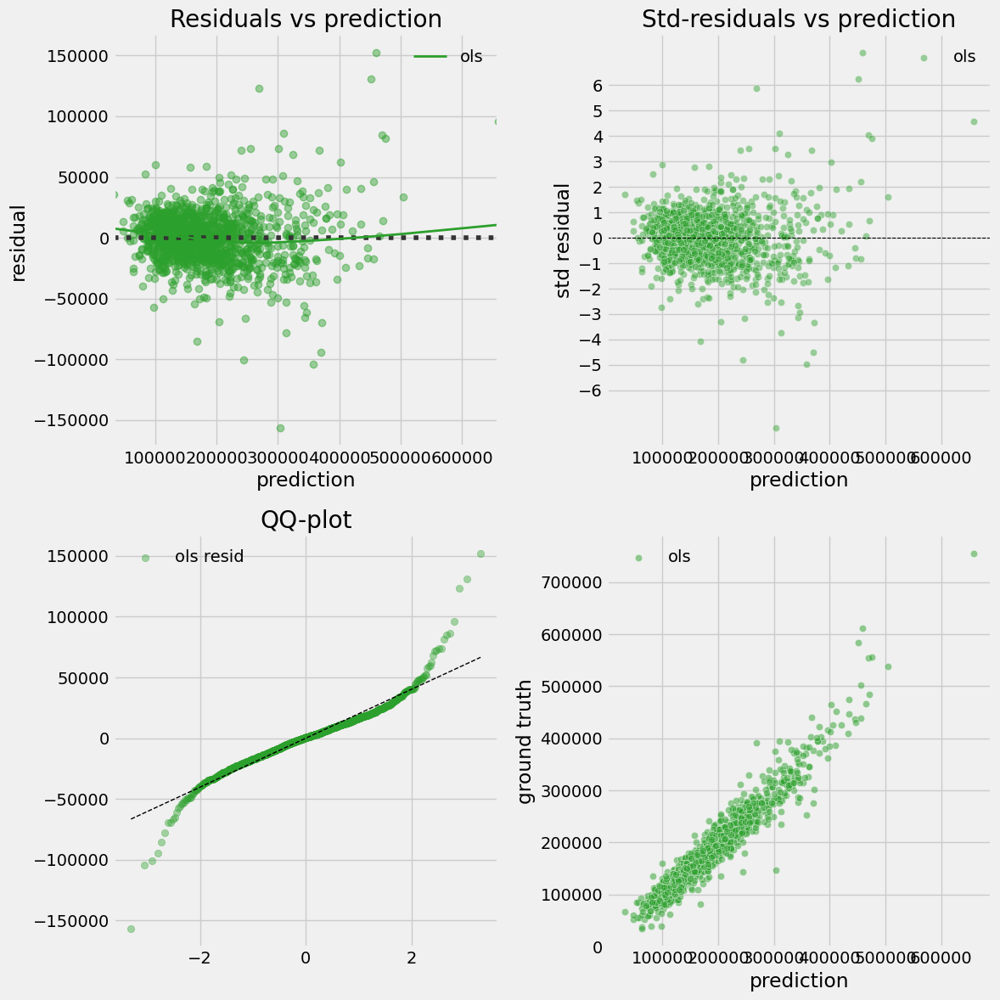

In [ ]:
ols = LinearRegression()
ols.fit(transformed_X, cleaned_y)
print('r2 score:', ols.score(transformed_X, cleaned_y))
plot_residuals('ols', ols.predict(transformed_X), cleaned_y)

In [ ]:
transformed_X_sm = sm.add_constant(transformed_X)
model_statistical_inference = sm.OLS(cleaned_y, transformed_X_sm)
results = model_statistical_inference.fit()

In [ ]:
from scipy.stats import normaltest
from statsmodels.stats.diagnostic import het_breuschpagan

print('Normality Test', normaltest(cleaned_y-ols.predict(transformed_X)))
print('Bresuch-Pagan Test', het_breuschpagan(results.resid, results.model.exog))

Normality Test NormaltestResult(statistic=np.float64(235.89842714673526), pvalue=np.float64(5.9608391152875815e-52))
Bresuch-Pagan Test (np.float64(261.34804334802686), np.float64(1.956808344352567e-36), np.float64(8.882718690002301), np.float64(8.262077063449814e-41))


In [ ]:
results = model_statistical_inference.fit(cov_type='HC3')
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.925
Method:                 Least Squares   F-statistic:                     369.1
Date:                Thu, 14 Aug 2025   Prob (F-statistic):               0.00
Time:                        11:00:59   Log-Likelihood:                -16484.
No. Observations:                1450   AIC:                         3.304e+04
Df Residuals:                    1414   BIC:                         3.323e+04
Df Model:                          35                                         
Covariance Type:                  HC3                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                      1.592e+05   3262.334     48.811      0.000    1.53e+05    1.66e+05
Functional                 3728.9364    716.881      5.202      0.000    2323.875    5133.998
BsmtExposure               3940.0519    773.527      5.094      0.000    2423.966    5456.138
GrLivArea                  1.929e+04   1888.277     10.214      0.000    1.56e+04     2.3e+04
TotalBsmtSF                7501.6910   1337.911      5.607      0.000    4879.434    1.01e+04
LotArea                    7627.7384    836.910      9.114      0.000    5987.426    9268.051
OverallCond                7176.8748    692.470     10.364      0.000    5819.658    8534.092
Sale_is_New                1.434e+04   3662.642      3.914      0.000    7158.722    2.15e+04
House_Age                 -7269.3592   1390.095     -5.229      0.000   -9993.896   -4544.823
LuxuryScore^2              7437.3413   1408.258      5.281      0.000    4677.207    1.02e+04
Exterior_contains_BrkFace  1.771e+04   3731.305      4.746      0.000    1.04e+04     2.5e+04
LuxuryScore                 1.09e+04   2197.041      4.960      0.000    6590.242    1.52e+04
Condition1_Norm            7552.8250   1580.984      4.777      0.000    4454.152    1.07e+04
BsmtFinSF1                 6947.2522    919.250      7.558      0.000    5145.555    8748.950
BsmtQual                   5205.8408   1374.544      3.787      0.000    2511.785    7899.897
BsmtQual TotalBsmtSF       6606.3115   1442.302      4.580      0.000    3779.452    9433.171
Luxury_HighQual GrLivArea  6563.4450   1383.861      4.743      0.000    3851.127    9275.763
Neighborhood_Crawfor       2.121e+04   4610.566      4.601      0.000    1.22e+04    3.02e+04
HalfBath                   3169.3589    948.467      3.342      0.001    1310.398    5028.319
Neighborhood_BrkSide       1.405e+04   2694.904      5.212      0.000    8763.999    1.93e+04
ScreenPorch                1547.3285    721.831      2.144      0.032     132.567    2962.090
GrLivArea^2                4190.4840   1882.700      2.226      0.026     500.460    7880.508
GarageQual                 2741.8106    745.245      3.679      0.000    1281.158    4202.463
Neighborhood_StoneBr       2.736e+04   8351.705      3.276      0.001     1.1e+04    4.37e+04
KitchenAbvGr KitchenQual   3155.8973    978.760      3.224      0.001    1237.563    5074.232
SaleCondition_Abnorml     -1.037e+04   2439.389     -4.252      0.000   -1.52e+04   -5590.423
Luxury_Garage3up            1.03e+04   3101.281      3.320      0.001    4218.949    1.64e+04
Loc_Tier                   3057.7281   1094.164      2.795      0.005     913.206    5202.251
CentralAir_Y               7288.3242   2857.030      2.551      0.011    1688.649    1.29e+04
TotalPorchDeckSF           2267.9598    833.755      2.720      0.007     6

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_df = pd.DataFrame({
    "feature": transformed_X_sm.columns,
    "VIF": [variance_inflation_factor(transformed_X_sm.values, i)
            for i in range(transformed_X_sm.shape[1])]
})
vif_df

,feature,VIF
0,const,32.359476
1,Functional,1.148125
2,BsmtExposure,1.407714
3,GrLivArea,8.148293
4,TotalBsmtSF,3.165600
5,LotArea,1.553672
6,OverallCond,1.608703
7,Sale_is_New,1.376907
8,House_Age,5.269439
9,LuxuryScore^2,4.119949


In [ ]:
transformed_X_sm.columns

Index(['const', 'Functional', 'BsmtExposure', 'GrLivArea', 'TotalBsmtSF',
       'LotArea', 'OverallCond', 'Sale_is_New', 'House_Age', 'LuxuryScore^2',
       'Exterior_contains_BrkFace', 'LuxuryScore', 'Condition1_Norm',
       'BsmtFinSF1', 'BsmtQual', 'BsmtQual TotalBsmtSF',
       'Luxury_HighQual GrLivArea', 'Neighborhood_Crawfor', 'HalfBath',
       'Neighborhood_BrkSide', 'ScreenPorch', 'GrLivArea^2', 'GarageQual',
       'Neighborhood_StoneBr', 'KitchenAbvGr KitchenQual',
       'SaleCondition_Abnorml', 'Luxury_Garage3up', 'Loc_Tier', 'CentralAir_Y',
       'TotalPorchDeckSF', 'BedroomAbvGr', 'Foundation_PConc',
       'AboveGradeBaths', 'ExterQual', 'HeatingQC', 'MasVnrType_Stone'],
      dtype='object')

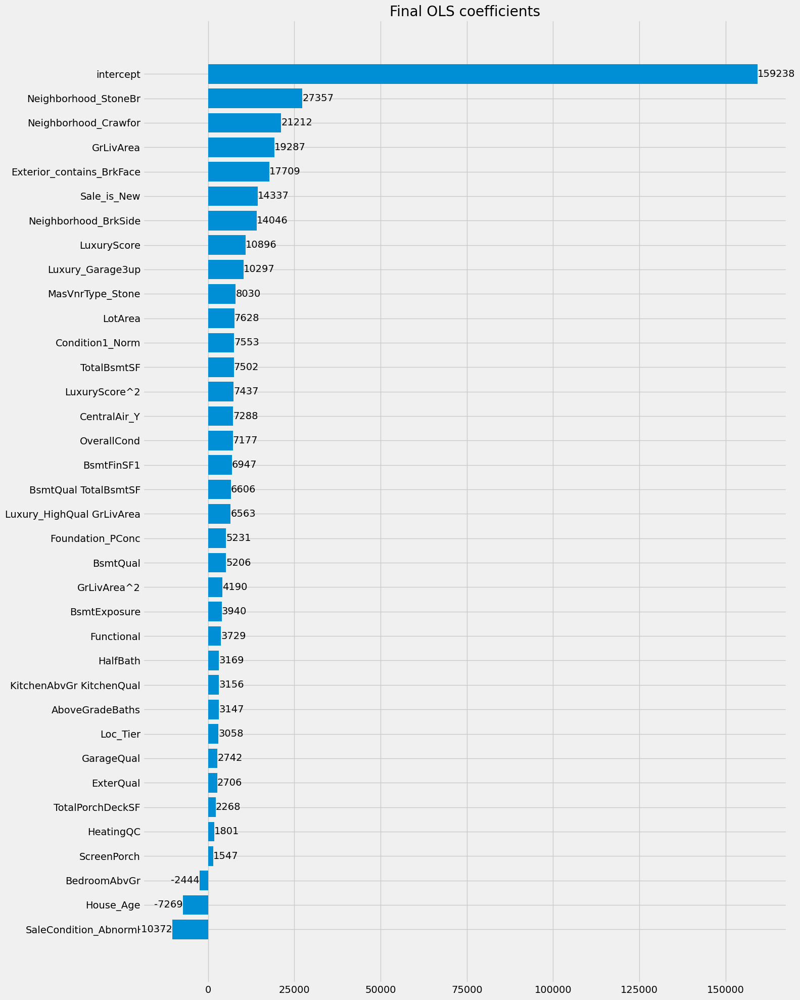

In [ ]:
transformed_coef = ols.coef_
transformed_coef = np.append(transformed_coef, ols.intercept_)
transformed_X_features_ = np.append(transformed_X_sm.columns[1:], ['intercept'])

fig, ax = plt.subplots(figsize=(16, 20))
rank_idx = np.argsort(transformed_coef)
bars = ax.barh(transformed_X_features_[rank_idx], transformed_coef[rank_idx])
ax.bar_label(bars, fmt='%.0f', padding=0)

ax.set_title('Final OLS coefficients')
ax.margins(x=0.05)
plt.tight_layout()
plt.show()


In [ ]:
P_ref = cleaned_y.mean()
pct_change = transformed_coef / P_ref * 100

df_effect = (pd.DataFrame({
                'feature': transformed_X_features_,
                'coef': transformed_coef,
                'pct_per_unit(%)': pct_change
             })
             .sort_values('pct_per_unit(%)', ascending=False)
             .reset_index(drop=True))
df_effect

,feature,coef,pct_per_unit(%)
0,intercept,159238.038675,88.335478
1,Neighborhood_StoneBr,27356.936849,15.175947
2,Neighborhood_Crawfor,21211.633404,11.766911
3,GrLivArea,19286.663931,10.699056
4,Exterior_contains_BrkFace,17709.001365,9.823866
5,Sale_is_New,14337.368608,7.953491
6,Neighborhood_BrkSide,14045.914175,7.791810
7,LuxuryScore,10896.362047,6.044632
8,Luxury_Garage3up,10297.348881,5.712336
9,MasVnrType_Stone,8029.912439,4.454502
